# Start

In [1]:
import os
import pandas as pd
import string as st
import missingno as msno
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import dash 
import dash_core_components as dcc
import dash_html_components as html
import plotly.express as px
import matplotlib.cm as cm

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from scipy.stats import zscore
from sklearn.impute import KNNImputer
from bioinfokit.visuz import cluster
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from scipy.stats import shapiro
from datetime import datetime
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_samples, silhouette_score

# pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

# Ouverture des fichiers

In [2]:
#On ouvre les fichiers
path_p = "C:/Users/Anwender"

#Feature Table scaled
customer_feature = pd.read_csv('customer_feature')
customer_feature = customer_feature.iloc[:, 1:]
#Feature Table not scaled
customer_feature_no_s = pd.read_csv('customer_feature_notscaled')
customer_feature_no_s = customer_feature_no_s.iloc[:, 1:]
#customer table
customer_study = pd.read_csv('customer_study')
customer_study = customer_study.iloc[:, 1:]

In [3]:
customer_feature

,customer_unique_id,nb_product_bought,nb_order,"Beauté, Santé et Bien-être","Bricolage, jardin et Animalerie",Cuisine & Maison,High-Tech,"Jouets, enfants et bébés",Sport et Loisirs,"Vêtements, Chaussures et Bijoux",expense_mean,expense_total,n_day_w/o_order,freight_mean,freight_total,pm_boleto,pm_credit_card,pm_voucher,freight_time,n_order_weekday,n_order_weekend,most_frequent_buying_day,most_frequent_buying_hour,product_description_lenght,mean_review_score,review_length
0,f4769d07fbfa6b165ac06e843ce1e3da,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.074498,0.187848,0.479626,0.198485,0.378483,0.0,1.000000,0.0,0.089971,1.000000,0.0,0.000,0.304348,0.528594,0.50,0.461538
1,cc6a7c09092000c1485649d3cff4e0c3,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.090555,0.227869,0.094455,0.213638,0.407386,0.0,1.000000,0.0,0.096362,1.000000,0.0,0.375,0.086957,0.164783,0.00,0.927885
2,0e34a60534391f19af7e10f1c8ac28d4,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.190562,0.477304,0.442320,0.406329,0.775007,0.0,1.000000,0.0,0.034415,1.000000,0.0,0.250,0.782609,0.091937,0.25,0.120192
3,e1708ec558c8c1d8bd5e24d022cd13ce,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.102122,0.256743,0.168515,0.207696,0.396241,0.0,1.000000,0.0,0.135939,1.000000,0.0,0.125,0.739130,0.657289,0.75,0.173077
4,1fc8630d25cd738b571a0acc08c2eff7,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.096971,0.243885,0.994327,0.199673,0.380844,0.0,1.000000,0.0,0.153884,1.000000,0.0,0.000,0.956522,0.266767,1.00,0.125000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72864,5b8515d0ff29f6655acc9bb8341b443a,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.213150,0.177202,0.091201,0.234586,0.149145,1.0,0.000000,0.0,0.367257,0.333333,0.0,0.125,0.434783,0.147450,1.00,0.413462
72865,5b143240c381316b9b1dc332176b4a71,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.142637,0.118581,0.496485,0.266677,0.169548,0.0,0.333333,0.0,0.205752,0.333333,0.0,0.000,0.869565,0.218287,1.00,0.000000
72866,5afa58a8f5f4690413cfa9e809d551c1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.084958,0.070630,0.426269,0.185411,0.117880,0.0,0.333333,0.0,0.190020,0.000000,0.5,0.750,0.521739,0.084652,1.00,0.000000
72867,5b131a24689b26c3e931c218a83c7568,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.027264,0.022666,0.450642,0.117070,0.074431,0.0,0.333333,0.0,0.034907,0.333333,0.0,0.000,0.695652,0.120322,1.00,0.000000


## Quelle donnée avons nous?

In [4]:
customer_feature_no_s

,customer_unique_id,nb_product_bought,nb_order,"Beauté, Santé et Bien-être","Bricolage, jardin et Animalerie",Cuisine & Maison,High-Tech,"Jouets, enfants et bébés",Sport et Loisirs,"Vêtements, Chaussures et Bijoux",expense_mean,expense_total,n_day_w/o_order,freight_mean,freight_total,pm_boleto,pm_credit_card,pm_voucher,freight_time,n_order_weekday,n_order_weekend,most_frequent_buying_day,most_frequent_buying_hour,product_description_lenght,mean_review_score,review_length
0,f4769d07fbfa6b165ac06e843ce1e3da,6.0,3,0,0,2,0,1,0,0,52.63,157.90,356.77,13.36,40.07,0,3,0,4.19,3.0,0.0,0,7,2108.333333,3.0,96.0
1,cc6a7c09092000c1485649d3cff4e0c3,6.0,3,0,1,2,0,0,0,0,63.79,191.36,70.26,14.38,43.13,0,3,0,4.45,3.0,0.0,3,2,660.000000,1.0,193.0
2,0e34a60534391f19af7e10f1c8ac28d4,6.0,3,0,0,2,0,1,0,0,133.30,399.90,329.02,27.35,82.05,0,3,0,1.93,3.0,0.0,2,18,370.000000,2.0,25.0
3,e1708ec558c8c1d8bd5e24d022cd13ce,6.0,3,0,0,2,0,0,1,0,71.83,215.50,125.35,13.98,41.95,0,3,0,6.06,3.0,0.0,1,17,2620.666667,4.0,36.0
4,1fc8630d25cd738b571a0acc08c2eff7,6.0,3,0,1,2,0,0,0,0,68.25,204.75,739.63,13.44,40.32,0,3,0,6.79,3.0,0.0,0,22,1066.000000,5.0,26.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72864,5b8515d0ff29f6655acc9bb8341b443a,1.0,1,0,0,0,0,0,0,1,149.00,149.00,67.84,15.79,15.79,1,0,0,15.47,1.0,0.0,1,10,591.000000,5.0,86.0
72865,5b143240c381316b9b1dc332176b4a71,1.0,1,0,0,1,0,0,0,0,99.99,99.99,369.31,17.95,17.95,0,1,0,8.90,1.0,0.0,0,20,873.000000,5.0,0.0
72866,5afa58a8f5f4690413cfa9e809d551c1,1.0,1,0,1,0,0,0,0,0,59.90,59.90,317.08,12.48,12.48,0,1,0,8.26,0.0,1.0,6,12,341.000000,5.0,0.0
72867,5b131a24689b26c3e931c218a83c7568,1.0,1,1,0,0,0,0,0,0,19.80,19.80,335.21,7.88,7.88,0,1,0,1.95,1.0,0.0,0,16,483.000000,5.0,0.0


In [5]:
customer_feature

,customer_unique_id,nb_product_bought,nb_order,"Beauté, Santé et Bien-être","Bricolage, jardin et Animalerie",Cuisine & Maison,High-Tech,"Jouets, enfants et bébés",Sport et Loisirs,"Vêtements, Chaussures et Bijoux",expense_mean,expense_total,n_day_w/o_order,freight_mean,freight_total,pm_boleto,pm_credit_card,pm_voucher,freight_time,n_order_weekday,n_order_weekend,most_frequent_buying_day,most_frequent_buying_hour,product_description_lenght,mean_review_score,review_length
0,f4769d07fbfa6b165ac06e843ce1e3da,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.074498,0.187848,0.479626,0.198485,0.378483,0.0,1.000000,0.0,0.089971,1.000000,0.0,0.000,0.304348,0.528594,0.50,0.461538
1,cc6a7c09092000c1485649d3cff4e0c3,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.090555,0.227869,0.094455,0.213638,0.407386,0.0,1.000000,0.0,0.096362,1.000000,0.0,0.375,0.086957,0.164783,0.00,0.927885
2,0e34a60534391f19af7e10f1c8ac28d4,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.190562,0.477304,0.442320,0.406329,0.775007,0.0,1.000000,0.0,0.034415,1.000000,0.0,0.250,0.782609,0.091937,0.25,0.120192
3,e1708ec558c8c1d8bd5e24d022cd13ce,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.102122,0.256743,0.168515,0.207696,0.396241,0.0,1.000000,0.0,0.135939,1.000000,0.0,0.125,0.739130,0.657289,0.75,0.173077
4,1fc8630d25cd738b571a0acc08c2eff7,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.096971,0.243885,0.994327,0.199673,0.380844,0.0,1.000000,0.0,0.153884,1.000000,0.0,0.000,0.956522,0.266767,1.00,0.125000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72864,5b8515d0ff29f6655acc9bb8341b443a,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.213150,0.177202,0.091201,0.234586,0.149145,1.0,0.000000,0.0,0.367257,0.333333,0.0,0.125,0.434783,0.147450,1.00,0.413462
72865,5b143240c381316b9b1dc332176b4a71,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.142637,0.118581,0.496485,0.266677,0.169548,0.0,0.333333,0.0,0.205752,0.333333,0.0,0.000,0.869565,0.218287,1.00,0.000000
72866,5afa58a8f5f4690413cfa9e809d551c1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.084958,0.070630,0.426269,0.185411,0.117880,0.0,0.333333,0.0,0.190020,0.000000,0.5,0.750,0.521739,0.084652,1.00,0.000000
72867,5b131a24689b26c3e931c218a83c7568,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.027264,0.022666,0.450642,0.117070,0.074431,0.0,0.333333,0.0,0.034907,0.333333,0.0,0.000,0.695652,0.120322,1.00,0.000000


In [6]:
customer_feature_no_s.describe()

,nb_product_bought,nb_order,"Beauté, Santé et Bien-être","Bricolage, jardin et Animalerie",Cuisine & Maison,High-Tech,"Jouets, enfants et bébés",Sport et Loisirs,"Vêtements, Chaussures et Bijoux",expense_mean,expense_total,n_day_w/o_order,freight_mean,freight_total,pm_boleto,pm_credit_card,pm_voucher,freight_time,n_order_weekday,n_order_weekend,most_frequent_buying_day,most_frequent_buying_hour,product_description_lenght,mean_review_score,review_length
count,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000
mean,1.075437,1.046453,0.131935,0.071512,0.337620,0.207372,0.074627,0.125389,0.097998,105.864408,109.733043,288.052235,18.467057,19.302028,0.201046,0.827965,0.017442,11.856316,0.801919,0.244535,2.783927,14.796882,778.952174,4.225279,26.232225
std,0.362065,0.214022,0.338423,0.257680,0.544096,0.405427,0.262790,0.331162,0.297314,98.612238,101.789047,153.304075,9.581959,10.692352,0.400785,0.471790,0.130913,7.352889,0.477076,0.452825,1.980593,5.330308,635.584102,1.211086,46.298111
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.850000,0.850000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.530000,0.000000,0.000000,0.000000,0.000000,4.000000,1.000000,0.000000
25%,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,42.900000,44.900000,163.690000,13.190000,13.440000,0.000000,1.000000,0.000000,6.690000,1.000000,0.000000,1.000000,11.000000,348.000000,4.000000,0.000000
50%,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,78.990000,79.900000,269.000000,16.180000,16.510000,0.000000,1.000000,0.000000,10.110000,1.000000,0.000000,3.000000,15.000000,600.000000,5.000000,0.000000
75%,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,132.910000,139.900000,397.170000,20.190000,21.480000,0.000000,1.000000,0.000000,15.240000,1.000000,0.000000,4.000000,19.000000,982.000000,5.000000,38.000000
max,6.000000,3.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,695.900000,836.900000,743.850000,67.310000,105.870000,1.000000,3.000000,1.000000,41.210000,3.000000,2.000000,8.000000,23.000000,3985.000000,5.000000,208.000000


In [7]:
customer_study

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english\r
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00,1.0,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,124.99,21.88,1.0,credit_card,2.0,146.87,88b8b52d46df026a9d1ad2136a59b30b,4,NaN,NaN,2017-05-26 00:00:00,2017-05-30 22:34:40,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture\r
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,2018-01-29 12:41:19,2018-02-06 00:00:00,1.0,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-01-18 20:58:32,289.00,46.48,1.0,credit_card,8.0,335.48,02fc48a9efa3e3d0f1a8ea26507eeec3,5,NaN,NaN,2018-01-30 00:00:00,2018-02-10 22:43:29,utilidades_domesticas,43.0,1002.0,3.0,10150.0,89.0,15.0,40.0,housewares\r
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,2018-06-13 00:00:00,1.0,bd07b66896d6f1494f5b86251848ced7,7c67e1448b00f6e969d365cea6b010ab,2018-06-05 16:19:10,139.94,17.79,1.0,credit_card,7.0,157.73,5ad6695d76ee186dc473c42706984d87,5,NaN,NaN,2018-06-15 00:00:00,2018-06-15 12:10:59,moveis_escritorio,55.0,955.0,1.0,8267.0,52.0,52.0,17.0,office_furniture\r
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,2018-03-28 16:04:25,2018-04-10 00:00:00,1.0,a5647c44af977b148e0a3a4751a09e2e,7c67e1448b00f6e969d365cea6b010ab,2018-03-27 16:31:16,149.94,23.36,1.0,credit_card,1.0,173.30,059a801bb31f6aab2266e672cab87bc5,5,NaN,NaN,2018-03-29 00:00:00,2018-04-02 18:36:47,moveis_escritorio,48.0,1066.0,1.0,12160.0,56.0,51.0,28.0,office_furniture\r
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,2018-08-09 20:55:48,2018-08-15 00:00:00,1.0,9391a573abe00141c56e38d84d7d5b3b,4a3ca9315b744ce9f8e9374361493884,2018-07-31 10:10:09,230.00,22.25,1.0,credit_card,8.0,252.25,8490879d58d6c5d7773f2739a03f089a,5,a melhor nota,O baratheon è esxelente Amo adoro o baratheon,2018-08-10 00:00:00,2018-08-17 01:59:52,casa_conforto,61.0,407.0,1.0,5200.0,45.0,15.0,35.0,home_confort\r
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119146,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,6760e20addcf0121e9d58f2f1ff14298,delivered,2018-04-07 15:48:17,2018-04-07 16:08:45,2018-04-11 02:08:36,2018-04-13 20:06:37,2018-04-25 00:00:00,1.0,ccb4503d9d43d245d3b295d0544f988b,527801b552d0077ffd170872eb49683b,2018-04-12 16:08:45,74.90,13.88,1.0,credit_card,6.0,88.78,36e2cdbaa9f639b57c53b37ac798fee8,4,Recomendo,NaN,2018-04-14 00:00:00,2018-04-28 11:15:04,livros_interesse_geral,51.0,489.0,2.0,611.0,22.0,22.0,23.0,books_gener

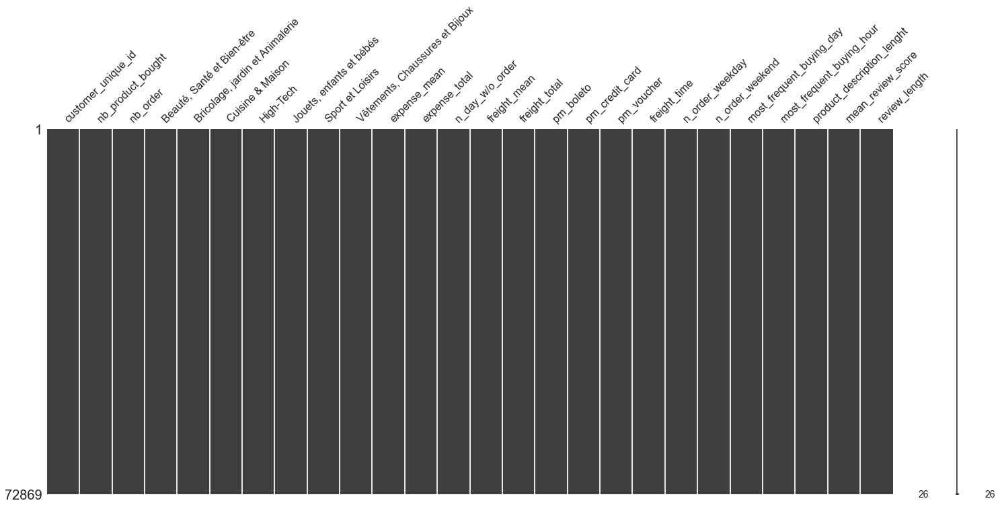

In [8]:
msno.matrix(customer_feature)

## Missing data

In [9]:
ratio_missing = customer_feature.apply(lambda x: x.isna().sum(), axis=0)
ratio_missing = round(ratio_missing*100/(customer_feature.index.size), 2)
ratio_missing = ratio_missing.sort_values(ascending=False)
ratio_missing

review_length                      0.0
mean_review_score                  0.0
nb_product_bought                  0.0
nb_order                           0.0
Beauté, Santé et Bien-être         0.0
Bricolage, jardin et Animalerie    0.0
Cuisine & Maison                   0.0
High-Tech                          0.0
Jouets, enfants et bébés           0.0
Sport et Loisirs                   0.0
Vêtements, Chaussures et Bijoux    0.0
expense_mean                       0.0
expense_total                      0.0
n_day_w/o_order                    0.0
freight_mean                       0.0
freight_total                      0.0
pm_boleto                          0.0
pm_credit_card                     0.0
pm_voucher                         0.0
freight_time                       0.0
n_order_weekday                    0.0
n_order_weekend                    0.0
most_frequent_buying_day           0.0
most_frequent_buying_hour          0.0
product_description_lenght         0.0
customer_unique_id       

# Analyse univariée

In [10]:
customer_feature.dtypes

customer_unique_id                  object
nb_product_bought                  float64
nb_order                           float64
Beauté, Santé et Bien-être         float64
Bricolage, jardin et Animalerie    float64
Cuisine & Maison                   float64
High-Tech                          float64
Jouets, enfants et bébés           float64
Sport et Loisirs                   float64
Vêtements, Chaussures et Bijoux    float64
expense_mean                       float64
expense_total                      float64
n_day_w/o_order                    float64
freight_mean                       float64
freight_total                      float64
pm_boleto                          float64
pm_credit_card                     float64
pm_voucher                         float64
freight_time                       float64
n_order_weekday                    float64
n_order_weekend                    float64
most_frequent_buying_day           float64
most_frequent_buying_hour          float64
product_des

In [11]:
customer_feature.describe()

,nb_product_bought,nb_order,"Beauté, Santé et Bien-être","Bricolage, jardin et Animalerie",Cuisine & Maison,High-Tech,"Jouets, enfants et bébés",Sport et Loisirs,"Vêtements, Chaussures et Bijoux",expense_mean,expense_total,n_day_w/o_order,freight_mean,freight_total,pm_boleto,pm_credit_card,pm_voucher,freight_time,n_order_weekday,n_order_weekend,most_frequent_buying_day,most_frequent_buying_hour,product_description_lenght,mean_review_score,review_length
count,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000,72869.000000
mean,0.015087,0.023227,0.131935,0.071512,0.168810,0.207372,0.074627,0.125389,0.097998,0.151089,0.130235,0.387245,0.274358,0.182318,0.201046,0.275988,0.017442,0.278425,0.267306,0.122267,0.347991,0.643343,0.194663,0.806320,0.126116
std,0.072413,0.107011,0.338423,0.257680,0.272048,0.405427,0.262790,0.331162,0.297314,0.141878,0.121750,0.206095,0.142356,0.100995,0.400785,0.157263,0.130913,0.180749,0.159025,0.226413,0.247574,0.231753,0.159654,0.302771,0.222587
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.060499,0.052688,0.220058,0.195959,0.126948,0.000000,0.333333,0.000000,0.151426,0.333333,0.000000,0.125000,0.478261,0.086410,0.750000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.112424,0.094552,0.361632,0.240380,0.155946,0.000000,0.333333,0.000000,0.235497,0.333333,0.000000,0.375000,0.652174,0.149711,1.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.190001,0.166318,0.533938,0.299955,0.202890,0.000000,0.333333,0.000000,0.361603,0.333333,0.000000,0.500000,0.826087,0.245667,1.000000,0.182692
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [12]:
def petit_resume_svp(d):
    df_store= pd.DataFrame(index=d.columns)
    df_store["mean"] = d[df_store.index].mean()
    df_store["median"] = d[df_store.index].median()
    df_store["var"] = d[df_store.index].var(ddof=0)
    df_store["std"] = d[df_store.index].std(ddof=0)
    df_store["skew"] = d[df_store.index].skew()
    df_store["kurtosis"] = d[df_store.index].kurtosis()
    return(df_store)

j = petit_resume_svp(customer_feature_no_s.iloc[:, 1:])
j

,mean,median,var,std,skew,kurtosis
nb_product_bought,1.075437,1.00,0.131089,0.362062,4.992370,25.176552
nb_order,1.046453,1.00,0.045805,0.214021,4.539257,19.952864
"Beauté, Santé et Bien-être",0.131935,0.00,0.114528,0.338421,2.175236,2.731725
"Bricolage, jardin et Animalerie",0.071512,0.00,0.066398,0.257678,3.325833,9.061412
Cuisine & Maison,0.337620,0.00,0.296036,0.544092,1.344178,0.841005
High-Tech,0.207372,0.00,0.164369,0.405424,1.443593,0.083963
"Jouets, enfants et bébés",0.074627,0.00,0.069058,0.262789,3.237443,8.481273
Sport et Loisirs,0.125389,0.00,0.109667,0.331160,2.262462,3.118818
"Vêtements, Chaussures et Bijoux",0.097998,0.00,0.088394,0.297312,2.704304,5.313405
expense_mean,105.864408,78.99,9724.239998,98.611561,2.471419,8.063925


### Boxplot RFM

{'whiskers': [<matplotlib.lines.Line2D at 0x1e5b68fc490>,
 'caps': [<matplotlib.lines.Line2D at 0x1e5b68fcb50>,
 'boxes': [<matplotlib.lines.Line2D at 0x1e5b68fc130>],
 'medians': [<matplotlib.lines.Line2D at 0x1e5b6906250>],
 'fliers': [<matplotlib.lines.Line2D at 0x1e5b6906550>],
 'means': []}

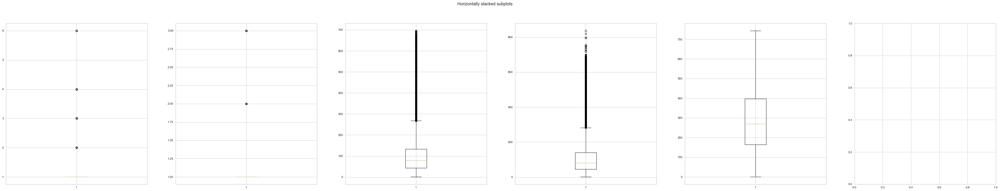

In [13]:
n_plot = 6
fig, ax = plt.subplots(1, n_plot, figsize=(n_plot*10,10))
fig.suptitle('Horizontally stacked subplots')
ax[0].boxplot(customer_feature_no_s['nb_product_bought'])
ax[1].boxplot(customer_feature_no_s['nb_order'])
ax[2].boxplot(customer_feature_no_s['expense_mean'])
ax[3].boxplot(customer_feature_no_s['expense_total'])
ax[4].boxplot(customer_feature_no_s['n_day_w/o_order'])

## Répartition sur le temps

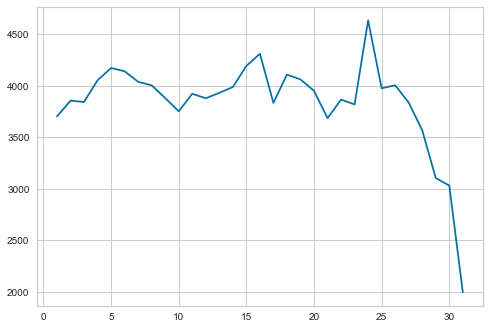

In [14]:
days = pd.to_datetime(customer_study["order_purchase_timestamp"])
days = days.apply(lambda x: x.day)
days= days.value_counts().sort_index(ascending=True)
plt.plot(days)

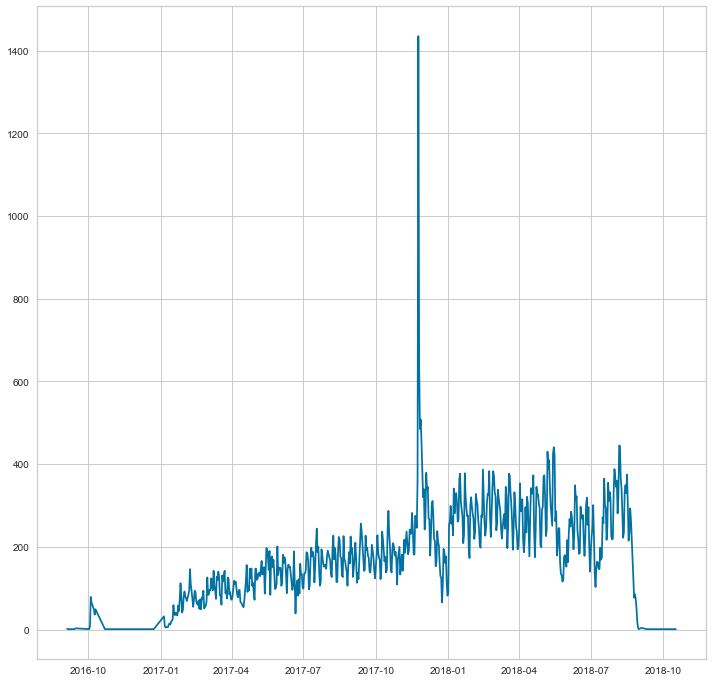

In [15]:
days = pd.to_datetime(customer_study["order_purchase_timestamp"])
days = days.apply(lambda x: x.date())
days = days.value_counts()
days = days.sort_index(ascending=True)
plt.figure(figsize=(12,12))
plt.plot(days.index, days)
plt.show()

### repartition par nombre de produits achetés

<BarContainer object of 5 artists>

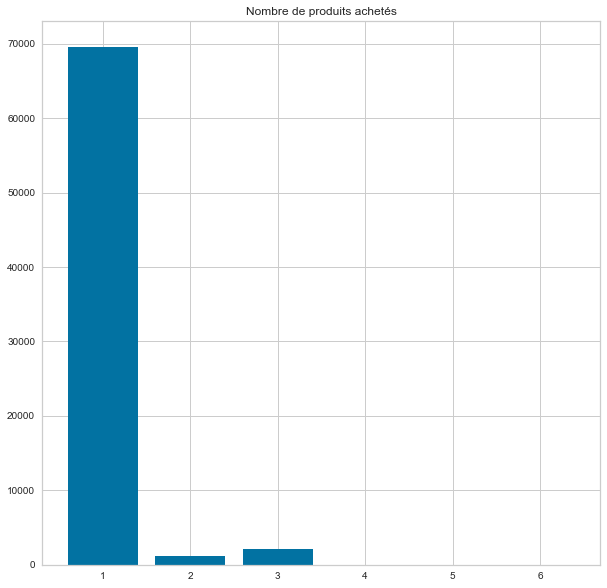

In [16]:
k = customer_feature_no_s.loc[:, "nb_product_bought"].value_counts()
plt.figure(figsize=(10,10))
plt.title(label="Nombre de produits achetés")
plt.bar(k.index, k.values,align='center')

#### La plupart des customers n'achétent qu'une fois

<BarContainer object of 4 artists>

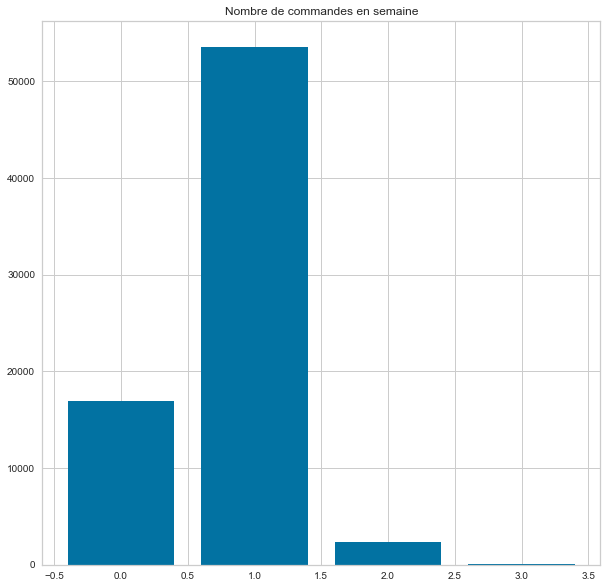

In [17]:
k = customer_feature_no_s.loc[:, "n_order_weekday"].value_counts()
plt.figure(figsize=(10,10))
plt.title(label="Nombre de commandes en semaine")
plt.bar(k.index, k.values,align='center')

#### La plupart des customers ne font qu'une commande par semaine

<BarContainer object of 3 artists>

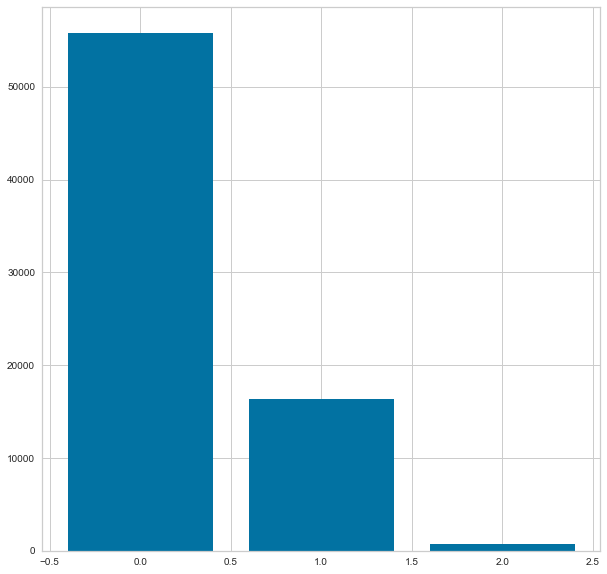

In [18]:
k = customer_feature_no_s.loc[:, "n_order_weekend"].value_counts()
plt.figure(figsize=(10,10))
plt.bar(k.index, k.values,align='center')

#### Les gens achétent des items ponctuels autant en semaine qu'en weekend

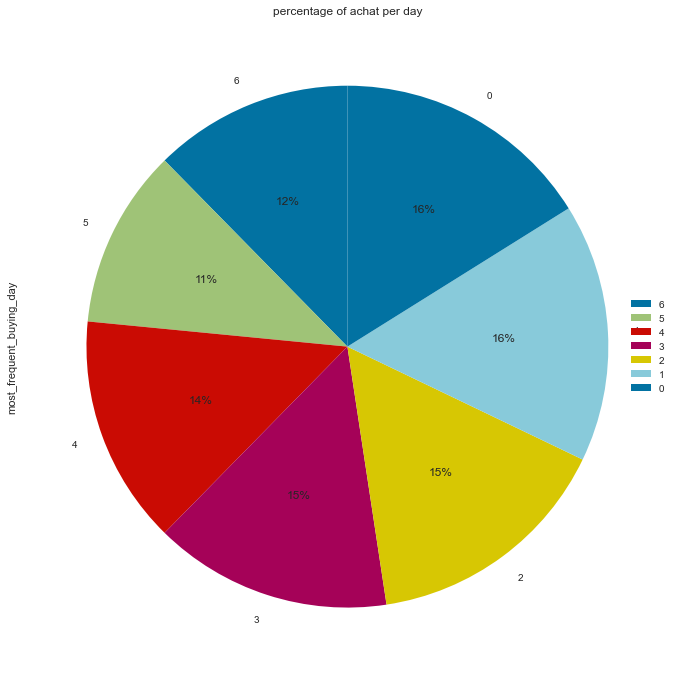

In [19]:
plt.figure(figsize=(12,12))
plt.title("percentage of achat per day")
customer_feature_no_s["most_frequent_buying_day"].value_counts()[0:7].sort_index(ascending=False).plot.pie(autopct='%1.0f%%', startangle=90)
plt.legend(loc = "right")

#### Les customers achétent autant chaque jour de la semaine (un peu moins le dimanche)

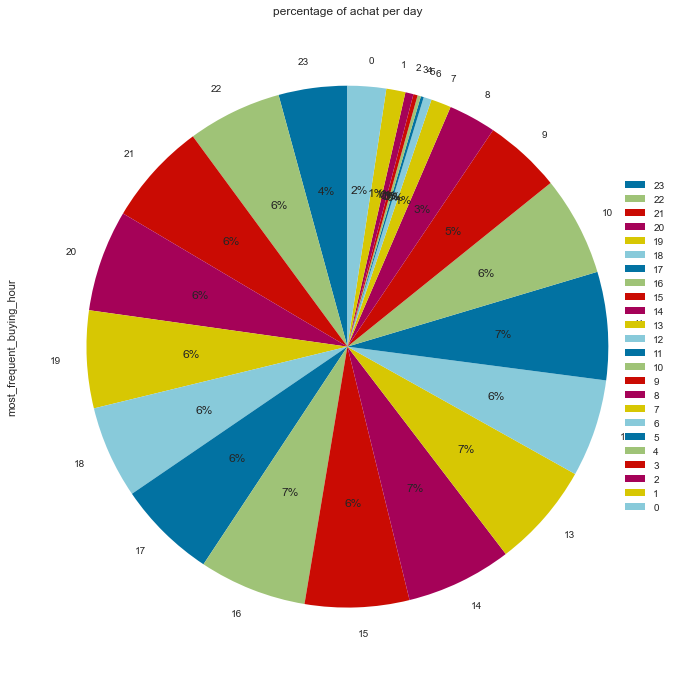

In [20]:
plt.figure(figsize=(12,12))
plt.title("percentage of achat per day")
customer_feature_no_s["most_frequent_buying_hour"].value_counts().sort_index(ascending=False).plot.pie(autopct='%1.0f%%', startangle=90)
plt.legend(loc = "right")

#### Les customers achétent uniformément entre 9 et 22 heures

# Analyse des commentaires client

<BarContainer object of 289 artists>

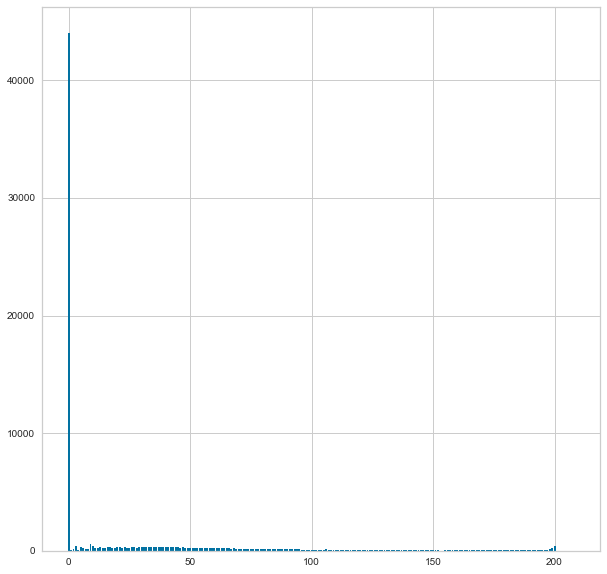

In [21]:
k = customer_feature_no_s.loc[:, "review_length"].value_counts()
plt.figure(figsize=(10,10))
plt.bar(k.index, k.values,align='center')

In [22]:
customer_feature_no_s.loc[:, "review_length"].value_counts()[0]/customer_feature.loc[:, "review_length"].value_counts().values.sum()*100  

60.39742551702369

#### 60.38% des acheteurs n'ont pas commenté

# Catégories d'achat

<BarContainer object of 7 artists>

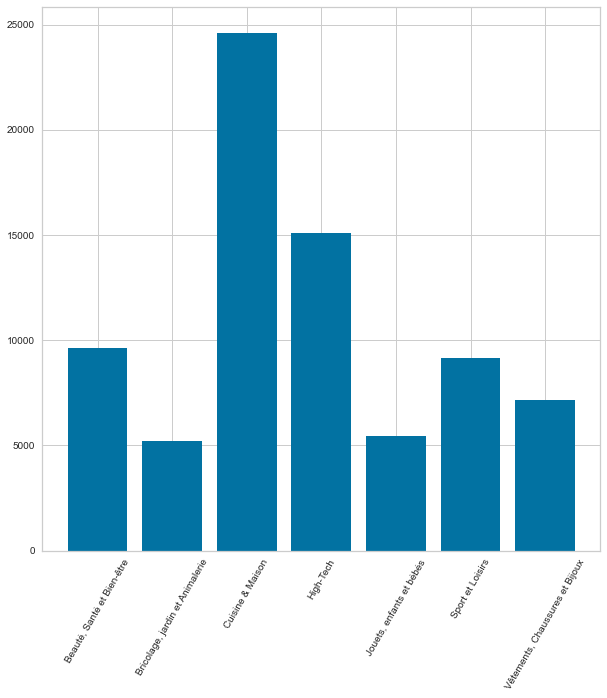

In [23]:
k = customer_feature_no_s.loc[:, ['Beauté, Santé et Bien-être', 'Bricolage, jardin et Animalerie',
       'Cuisine & Maison', 'High-Tech', 'Jouets, enfants et bébés',
       'Sport et Loisirs', 'Vêtements, Chaussures et Bijoux']].apply(lambda x: x.sum(), axis=0)
k
plt.figure(figsize=(10,10))
plt.xticks(rotation="60")
plt.bar(k.index, k.values,align='center')

<BarContainer object of 7 artists>

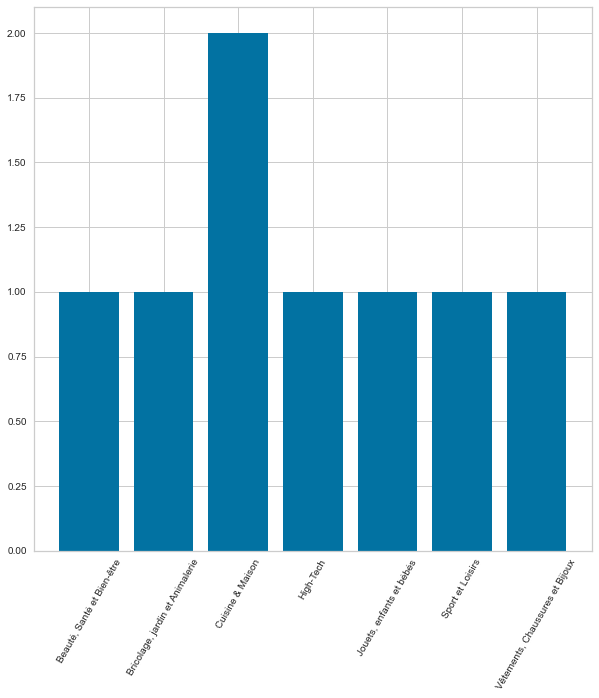

In [24]:
k = customer_feature_no_s.loc[:, ['Beauté, Santé et Bien-être', 'Bricolage, jardin et Animalerie',
       'Cuisine & Maison', 'High-Tech', 'Jouets, enfants et bébés',
       'Sport et Loisirs', 'Vêtements, Chaussures et Bijoux']].apply(lambda x: x.max(), axis=0)
k
plt.figure(figsize=(10,10))
plt.xticks(rotation="60")
plt.bar(k.index, k.values,align='center')

#### Les achats sont bien répartis sur les groupes néanmoins les customers n'achètent pas souvent dans la même catégorie

In [25]:
customer_feature_no_s

,customer_unique_id,nb_product_bought,nb_order,"Beauté, Santé et Bien-être","Bricolage, jardin et Animalerie",Cuisine & Maison,High-Tech,"Jouets, enfants et bébés",Sport et Loisirs,"Vêtements, Chaussures et Bijoux",expense_mean,expense_total,n_day_w/o_order,freight_mean,freight_total,pm_boleto,pm_credit_card,pm_voucher,freight_time,n_order_weekday,n_order_weekend,most_frequent_buying_day,most_frequent_buying_hour,product_description_lenght,mean_review_score,review_length
0,f4769d07fbfa6b165ac06e843ce1e3da,6.0,3,0,0,2,0,1,0,0,52.63,157.90,356.77,13.36,40.07,0,3,0,4.19,3.0,0.0,0,7,2108.333333,3.0,96.0
1,cc6a7c09092000c1485649d3cff4e0c3,6.0,3,0,1,2,0,0,0,0,63.79,191.36,70.26,14.38,43.13,0,3,0,4.45,3.0,0.0,3,2,660.000000,1.0,193.0
2,0e34a60534391f19af7e10f1c8ac28d4,6.0,3,0,0,2,0,1,0,0,133.30,399.90,329.02,27.35,82.05,0,3,0,1.93,3.0,0.0,2,18,370.000000,2.0,25.0
3,e1708ec558c8c1d8bd5e24d022cd13ce,6.0,3,0,0,2,0,0,1,0,71.83,215.50,125.35,13.98,41.95,0,3,0,6.06,3.0,0.0,1,17,2620.666667,4.0,36.0
4,1fc8630d25cd738b571a0acc08c2eff7,6.0,3,0,1,2,0,0,0,0,68.25,204.75,739.63,13.44,40.32,0,3,0,6.79,3.0,0.0,0,22,1066.000000,5.0,26.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72864,5b8515d0ff29f6655acc9bb8341b443a,1.0,1,0,0,0,0,0,0,1,149.00,149.00,67.84,15.79,15.79,1,0,0,15.47,1.0,0.0,1,10,591.000000,5.0,86.0
72865,5b143240c381316b9b1dc332176b4a71,1.0,1,0,0,1,0,0,0,0,99.99,99.99,369.31,17.95,17.95,0,1,0,8.90,1.0,0.0,0,20,873.000000,5.0,0.0
72866,5afa58a8f5f4690413cfa9e809d551c1,1.0,1,0,1,0,0,0,0,0,59.90,59.90,317.08,12.48,12.48,0,1,0,8.26,0.0,1.0,6,12,341.000000,5.0,0.0
72867,5b131a24689b26c3e931c218a83c7568,1.0,1,1,0,0,0,0,0,0,19.80,19.80,335.21,7.88,7.88,0,1,0,1.95,1.0,0.0,0,16,483.000000,5.0,0.0


<BarContainer object of 3 artists>

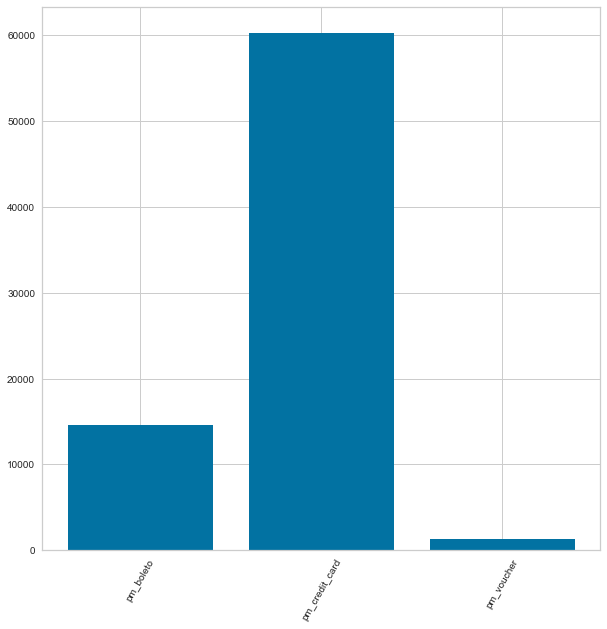

In [26]:
k = customer_feature_no_s.loc[:, ['pm_boleto', 'pm_credit_card','pm_voucher']].apply(lambda x: x.sum(), axis=0)
k
plt.figure(figsize=(10,10))
plt.xticks(rotation="60")
plt.bar(k.index, k.values,align='center')

## Les variables étudiées suivent-elles une loi normale?

In [27]:
for i in customer_feature.columns[1:]:
    stats, pval = shapiro(customer_feature[i])
    if pval<0.05:
        print("pval = "+str(pval)+" donc "+i+" ne suit pas une loi normale")

pval = 0.0 donc nb_product_bought ne suit pas une loi normale
pval = 0.0 donc nb_order ne suit pas une loi normale
pval = 0.0 donc Beauté, Santé et Bien-être ne suit pas une loi normale
pval = 0.0 donc Bricolage, jardin et Animalerie ne suit pas une loi normale
pval = 0.0 donc Cuisine & Maison ne suit pas une loi normale
pval = 0.0 donc High-Tech ne suit pas une loi normale
pval = 0.0 donc Jouets, enfants et bébés ne suit pas une loi normale
pval = 0.0 donc Sport et Loisirs ne suit pas une loi normale
pval = 0.0 donc Vêtements, Chaussures et Bijoux ne suit pas une loi normale
pval = 0.0 donc expense_mean ne suit pas une loi normale
pval = 0.0 donc expense_total ne suit pas une loi normale
pval = 0.0 donc n_day_w/o_order ne suit pas une loi normale
pval = 0.0 donc freight_mean ne suit pas une loi normale
pval = 0.0 donc freight_total ne suit pas une loi normale
pval = 0.0 donc pm_boleto ne suit pas une loi normale
pval = 0.0 donc pm_credit_card ne suit pas une loi normale
pval = 0.0 don

C:\Users\Anwender\anaconda3\lib\site-packages\scipy\stats\morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


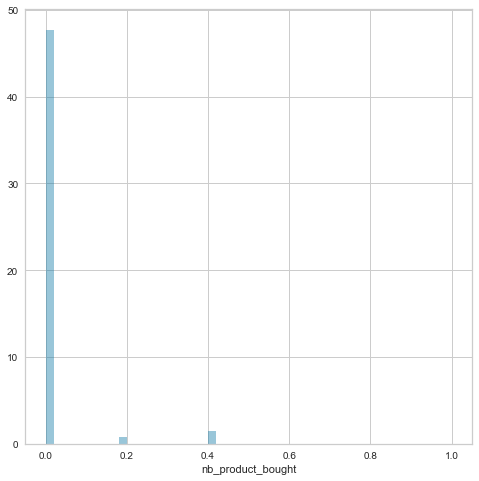

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


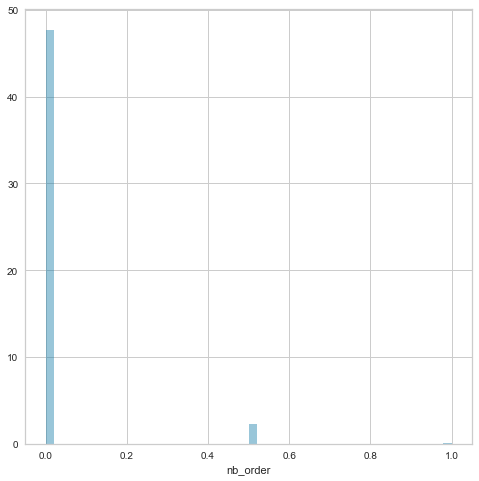

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


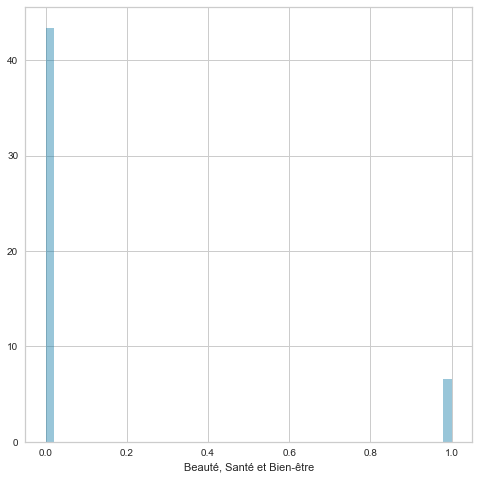

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


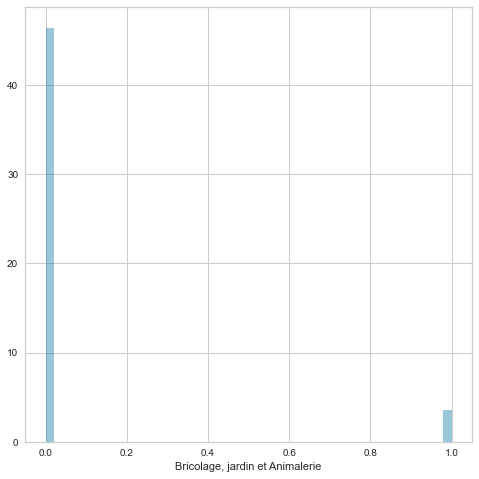

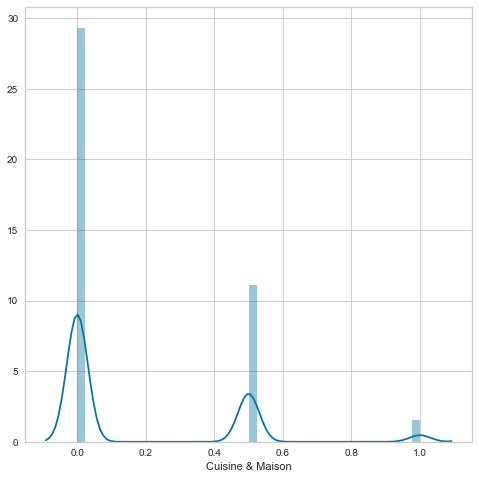

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


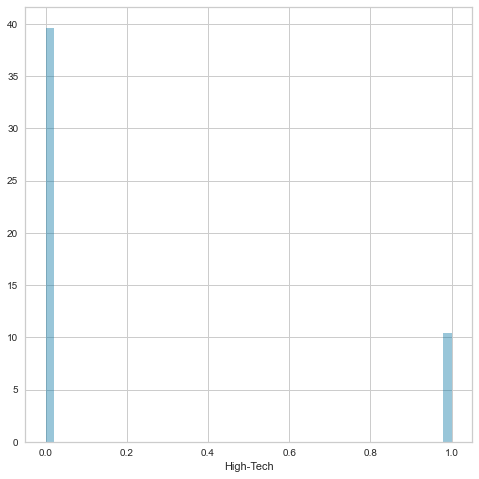

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


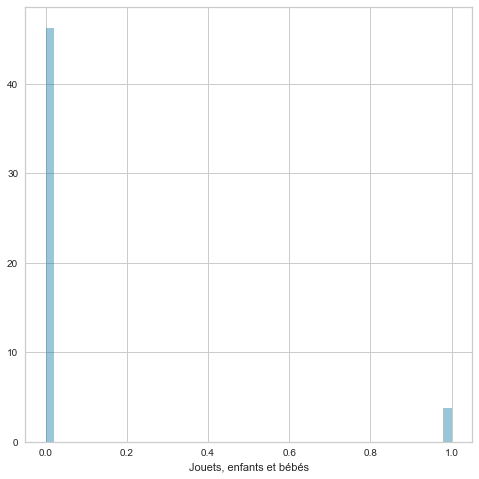

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


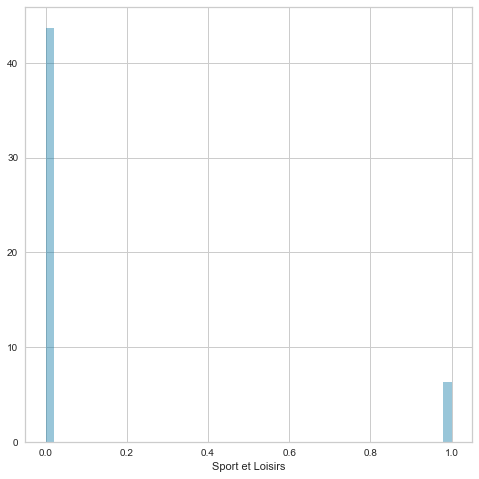

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


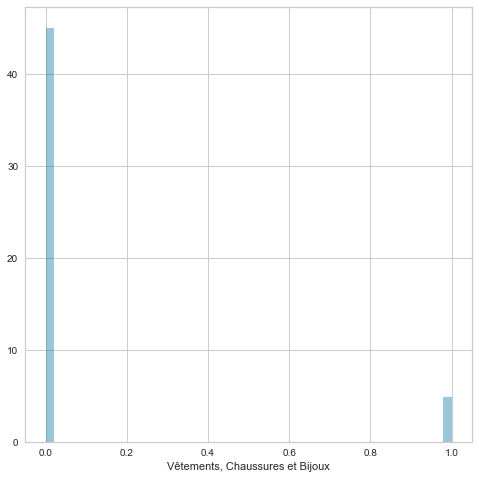

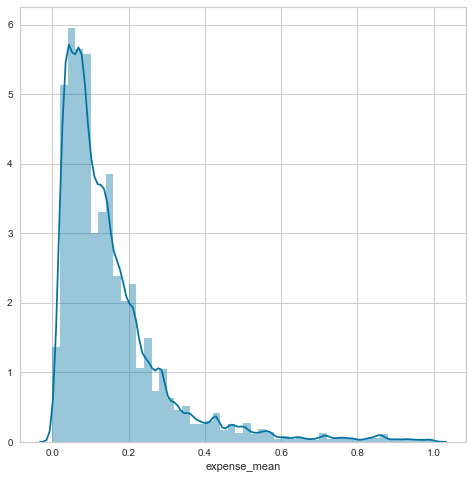

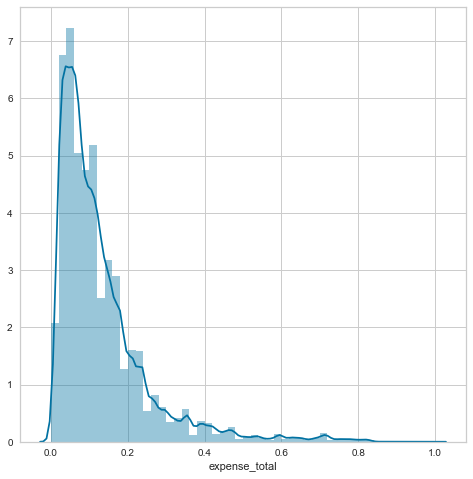

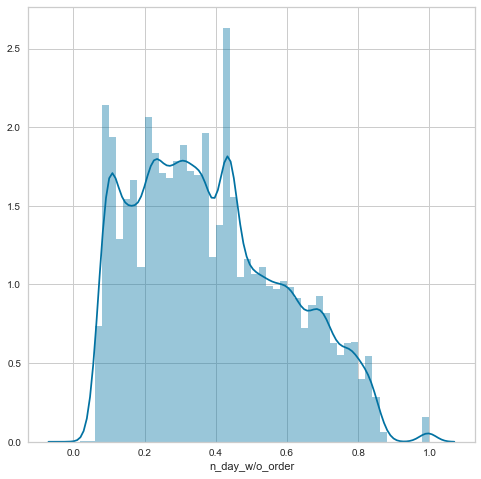

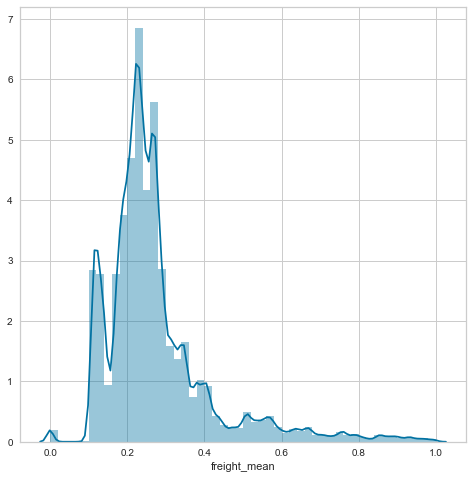

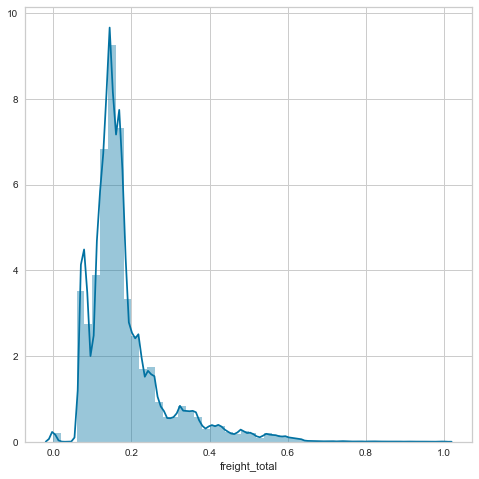

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


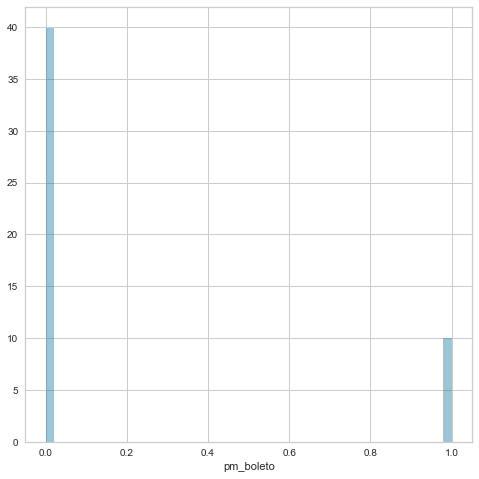

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


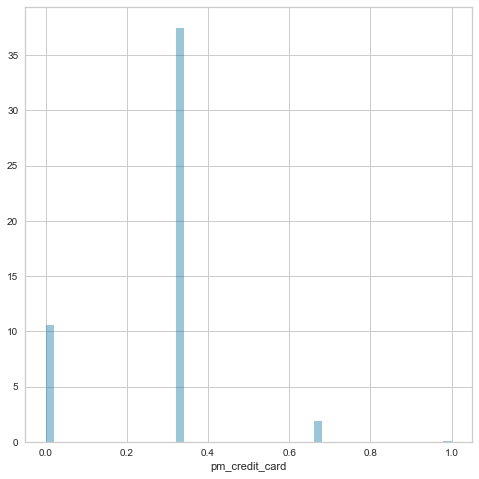

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


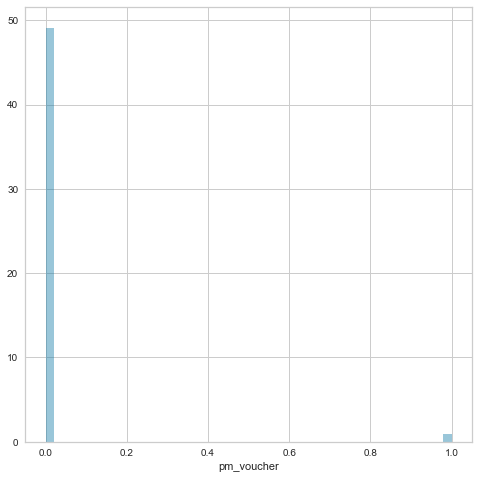

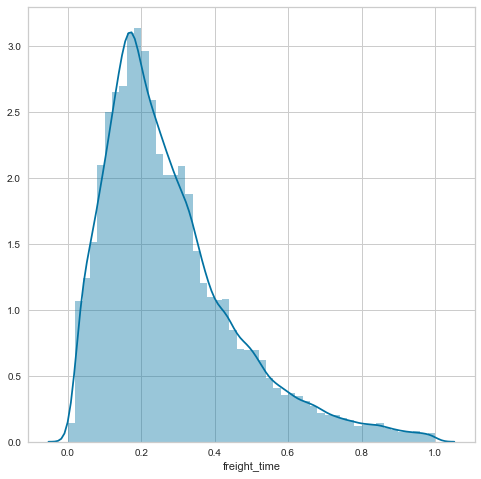

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


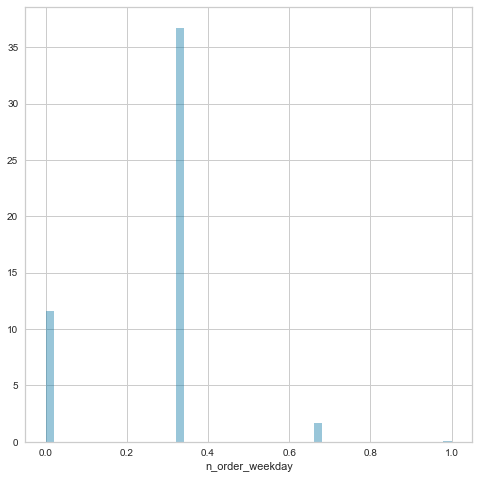

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


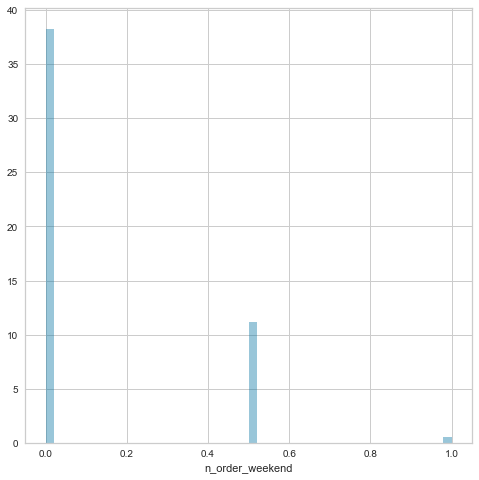

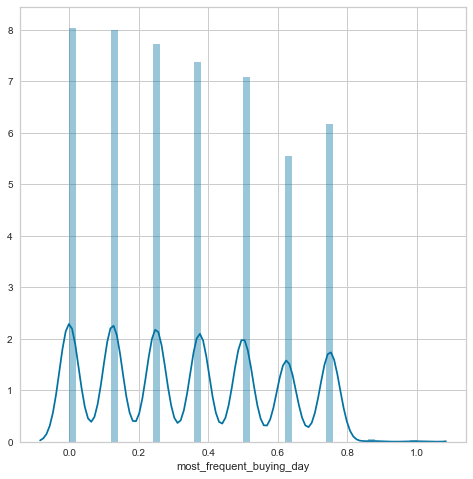

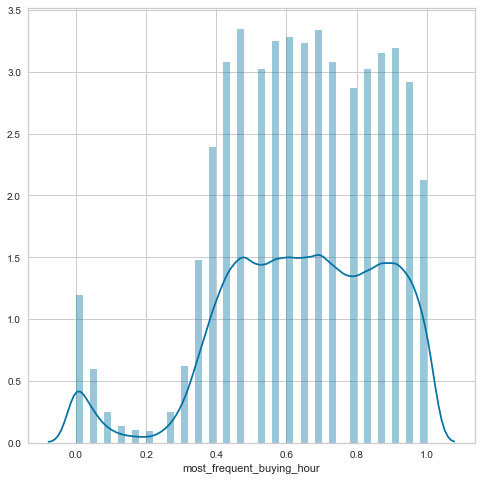

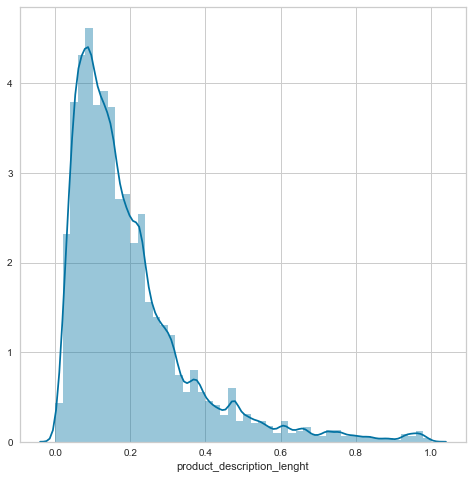

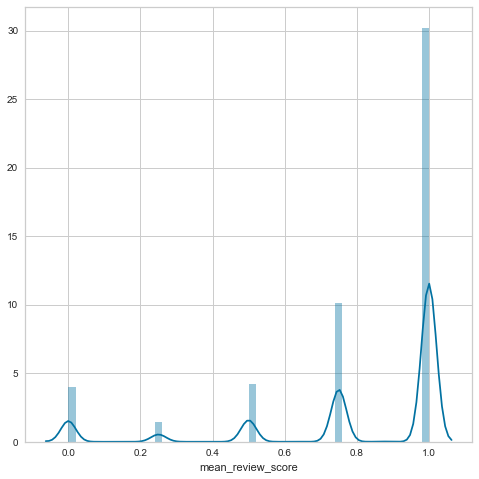

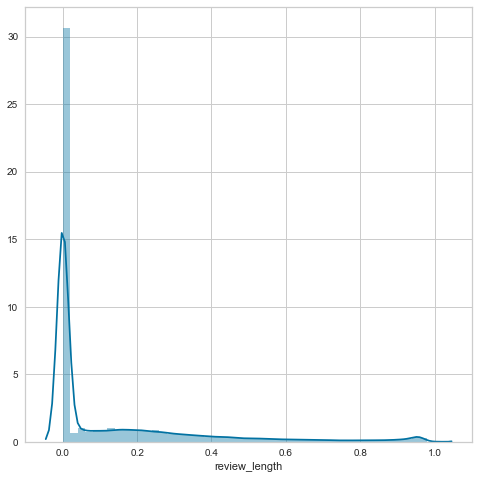

In [28]:
for i in customer_feature.columns[1:]:
    plt.figure(figsize=(8,8))
    sns.distplot(customer_feature[i])
    plt.show()

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


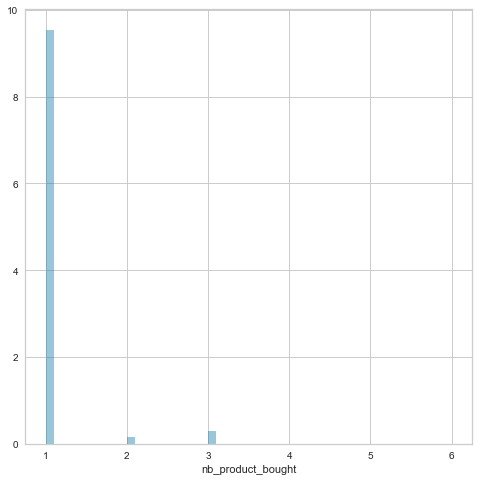

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


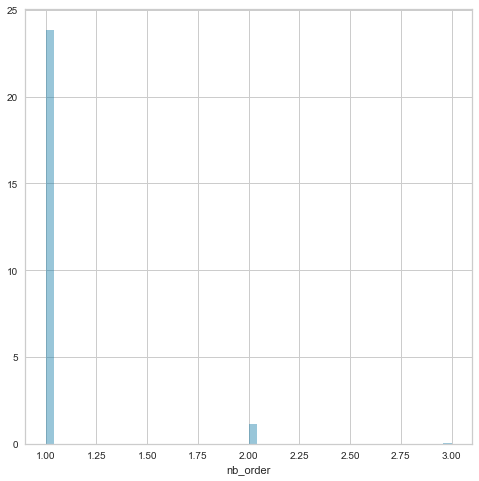

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


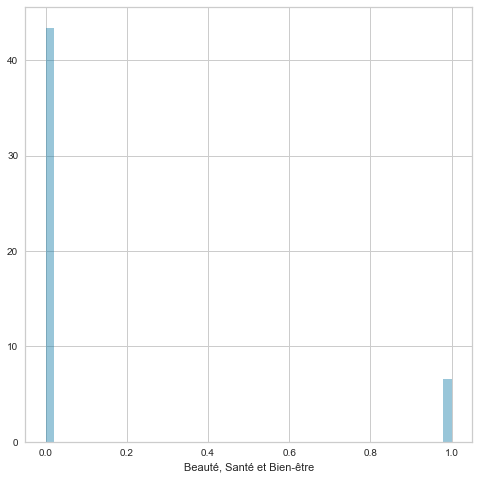

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


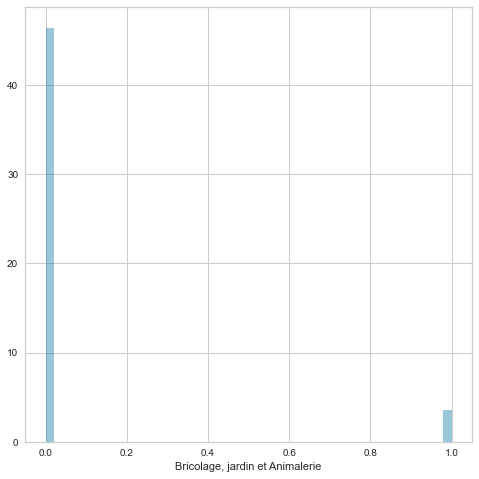

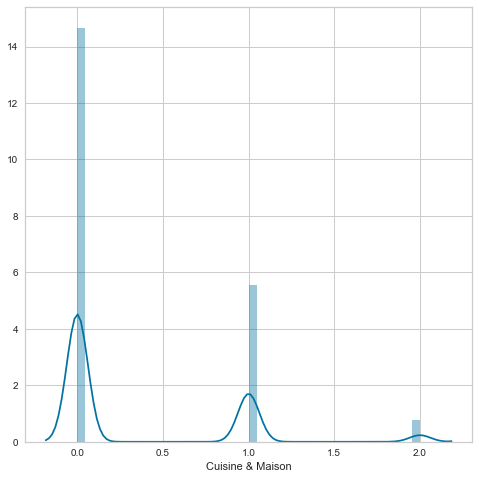

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


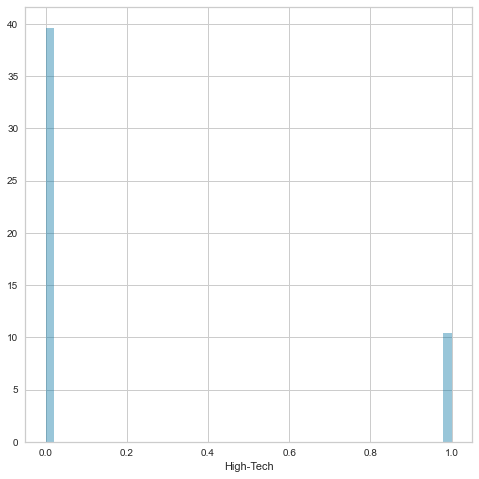

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


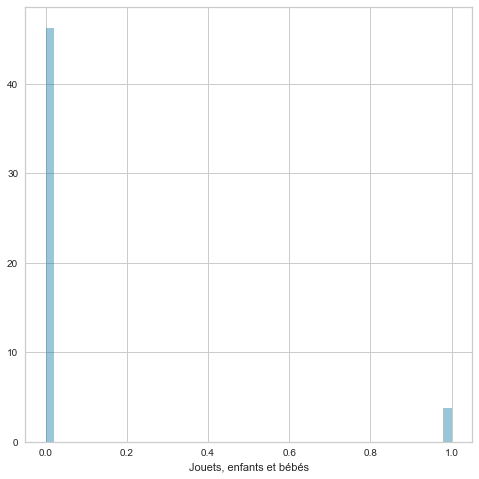

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


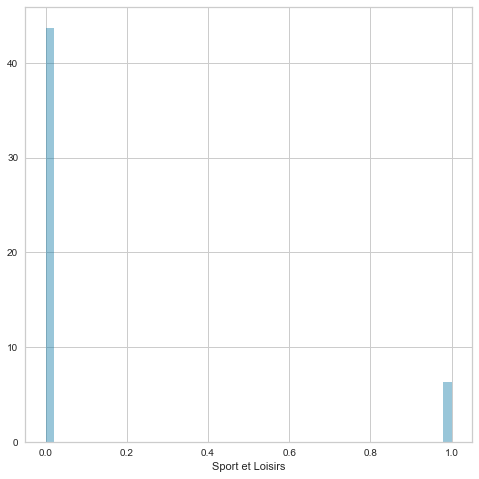

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


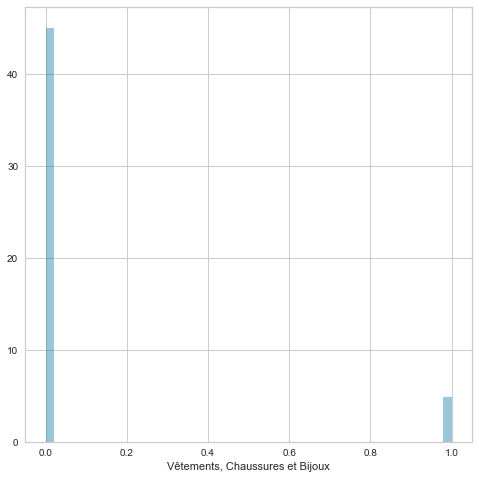

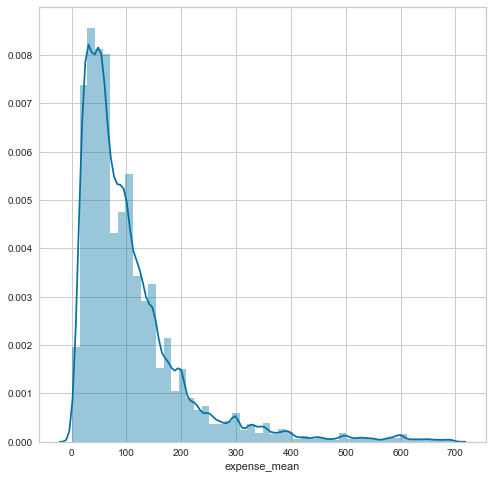

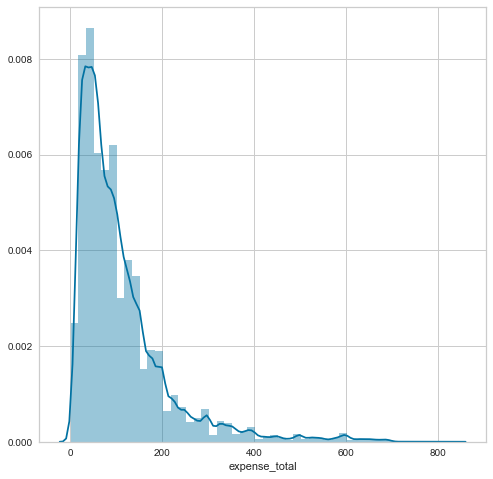

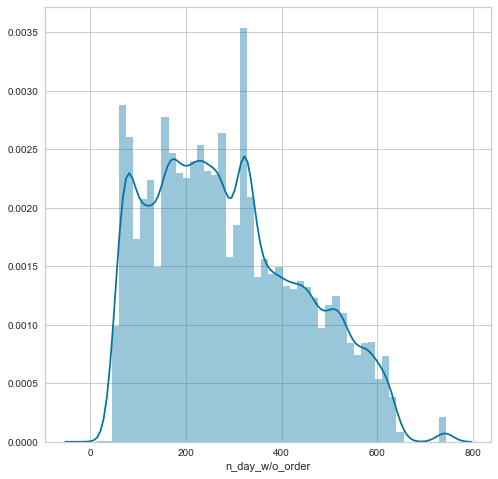

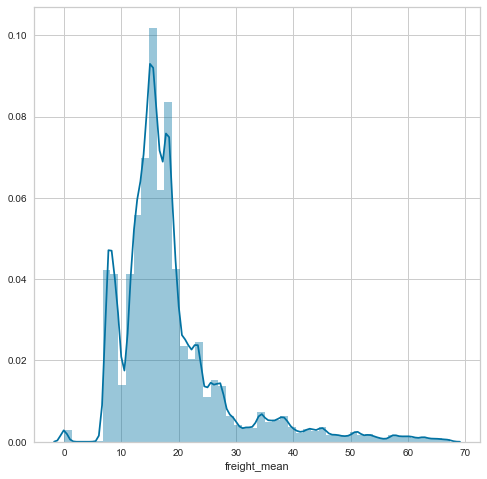

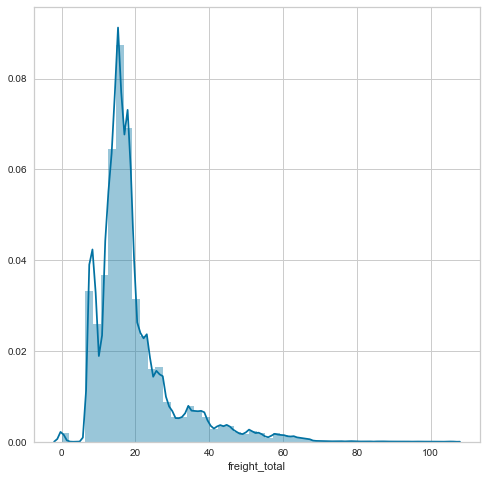

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


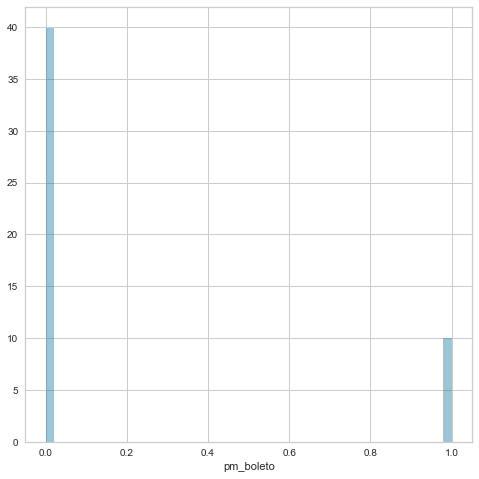

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


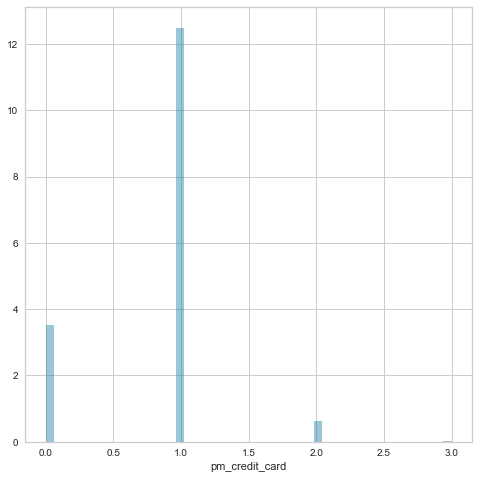

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


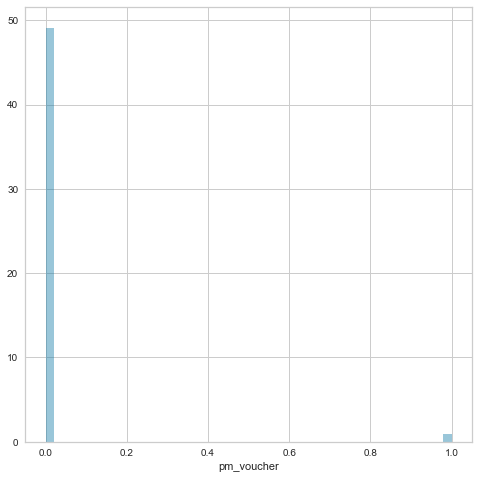

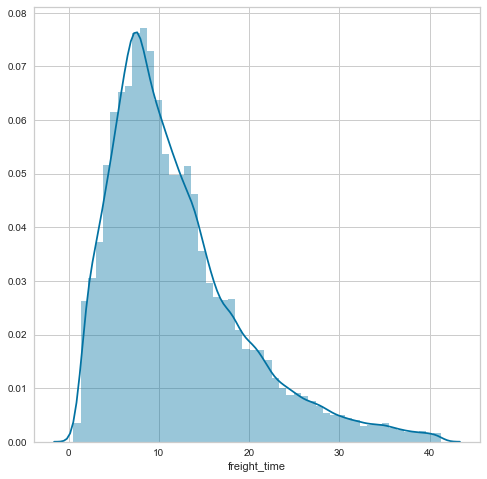

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


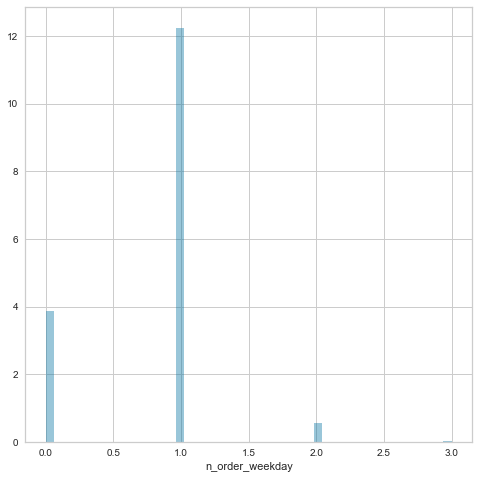

C:\Users\Anwender\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


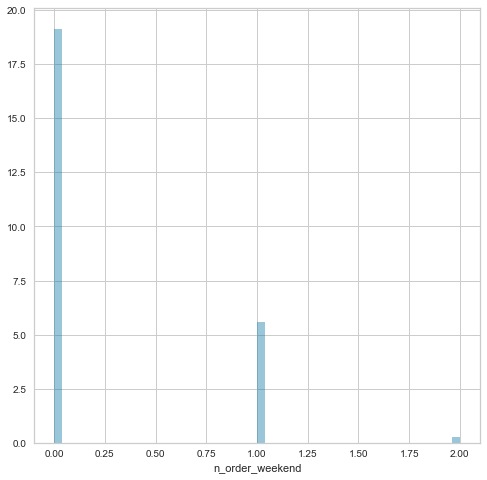

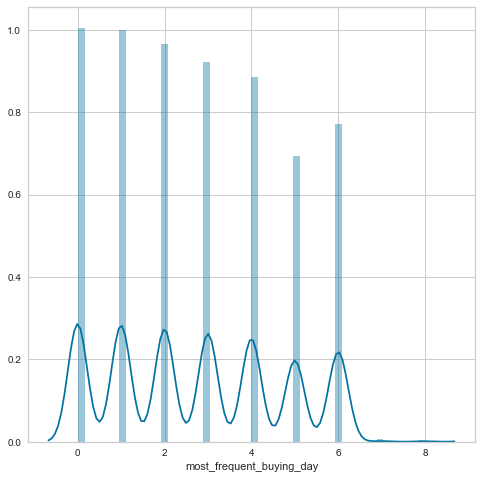

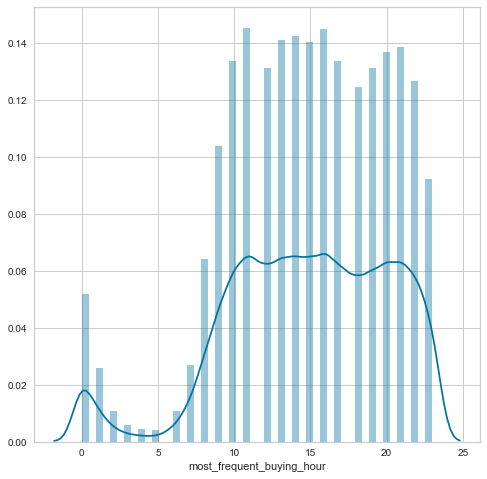

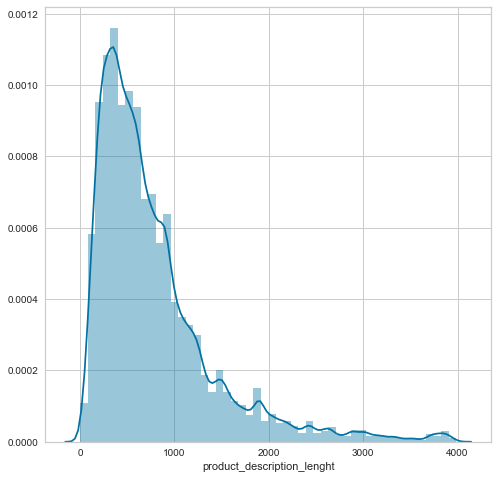

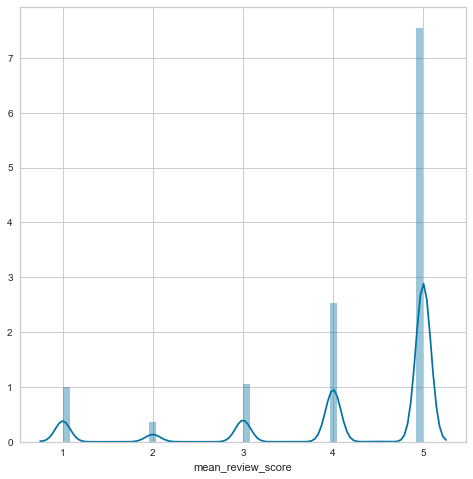

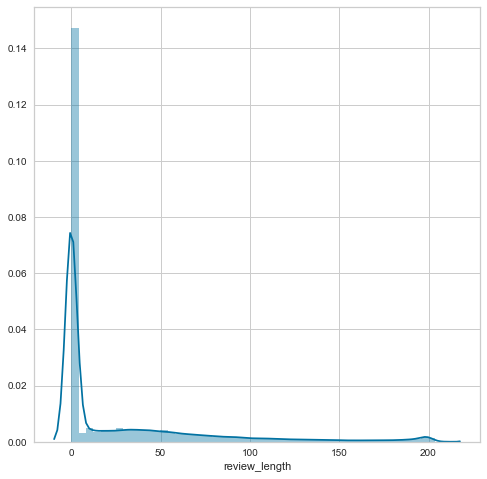

In [29]:
for i in customer_feature_no_s.columns[1:]:
    plt.figure(figsize=(8,8))
    sns.distplot(customer_feature_no_s[i])
    plt.show()

In [30]:
for i in customer_feature.columns[1:]:
    stats, pval = shapiro(np.log(customer_feature[i]))
    if pval<0.05:
        print("pval = "+str(pval)+" donc "+i+" ne suit pas une loi normale")
    else:
        print("pval = "+str(pval)+" donc "+i+" suit une loi normale")

pval = 1.0 donc nb_product_bought suit une loi normale
pval = 1.0 donc nb_order suit une loi normale
pval = 1.0 donc Beauté, Santé et Bien-être suit une loi normale
pval = 1.0 donc Bricolage, jardin et Animalerie suit une loi normale
pval = 1.0 donc Cuisine & Maison suit une loi normale
pval = 1.0 donc High-Tech suit une loi normale
pval = 1.0 donc Jouets, enfants et bébés suit une loi normale
pval = 1.0 donc Sport et Loisirs suit une loi normale
pval = 1.0 donc Vêtements, Chaussures et Bijoux suit une loi normale
pval = 1.0 donc expense_mean suit une loi normale
pval = 1.0 donc expense_total suit une loi normale
pval = 1.0 donc n_day_w/o_order suit une loi normale
pval = 1.0 donc freight_mean suit une loi normale
pval = 1.0 donc freight_total suit une loi normale
pval = 1.0 donc pm_boleto suit une loi normale
pval = 1.0 donc pm_credit_card suit une loi normale
pval = 1.0 donc pm_voucher suit une loi normale
pval = 1.0 donc freight_time suit une loi normale
pval = 1.0 donc n_order_week

C:\Users\Anwender\anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\Anwender\anaconda3\lib\site-packages\scipy\stats\morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [31]:
# for i in customer_feature.columns[1:]:
#     plt.figure(figsize=(8,8))
#     sns.distplot(customer_feature[i].apply(lambda x: np.log(x), axis= 1))
#     plt.show()

# Analyse Multivariée

In [32]:
customer_feature.columns

Index(['customer_unique_id', 'nb_product_bought', 'nb_order',
       'Beauté, Santé et Bien-être', 'Bricolage, jardin et Animalerie',
       'Cuisine & Maison', 'High-Tech', 'Jouets, enfants et bébés',
       'Sport et Loisirs', 'Vêtements, Chaussures et Bijoux', 'expense_mean',
       'expense_total', 'n_day_w/o_order', 'freight_mean', 'freight_total',
       'pm_boleto', 'pm_credit_card', 'pm_voucher', 'freight_time',
       'n_order_weekday', 'n_order_weekend', 'most_frequent_buying_day',
       'most_frequent_buying_hour', 'product_description_lenght',
       'mean_review_score', 'review_length'],
      dtype='object')

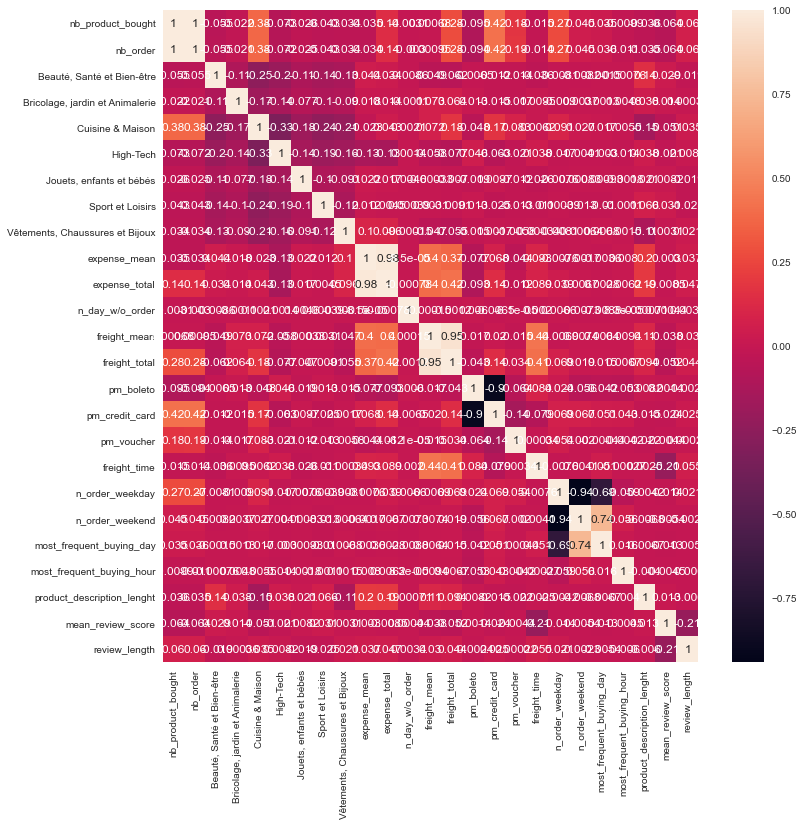

In [33]:
corr = customer_feature.corr("spearman")
plt.figure(figsize=(12,12))
sns.heatmap(corr, annot=True)

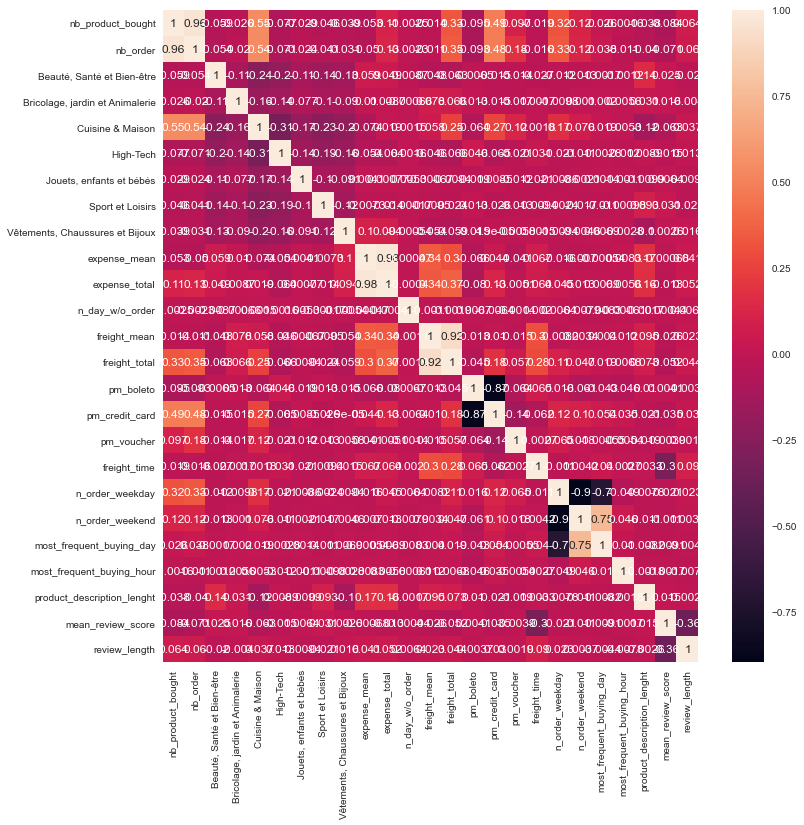

In [34]:
corr = customer_feature.corr("pearson")
plt.figure(figsize=(12,12))
sns.heatmap(corr, annot=True)

### Que retirer de ces corrélations?
#### Des variables sont très fortements corrélées et on ne va conserver que certaines d'entre elles:
_'nb_product_bought', 'nb_order' ==> 'nb_order' <br>
_'freight_mean', 'freight_total' ==> 'freight_mean'<br>
_'n_order_weekday', 'n_order_weekend', 'most_frequent_buying_day' ==> 'most_frequent_buying_day'<br>
_'pm_boleto', 'pm_credit_card' ==> 'pm_credit_card'<br>
_'expense_mean', 'expense_total' ==> 'expense_total'<br>
       

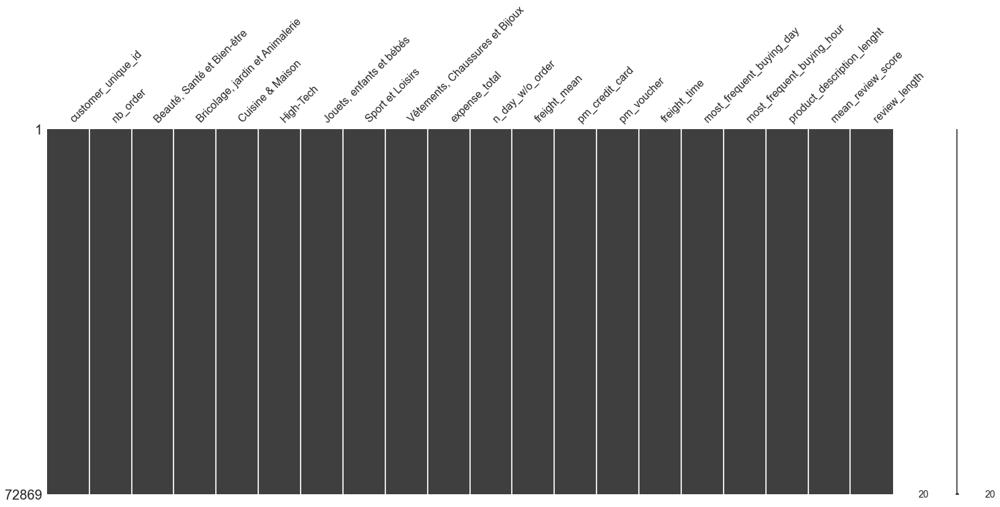

In [35]:
# customer_feature = customer_feature.drop(columns=['nb_product_bought','freight_total','n_order_weekday',
#                                                  'pm_boleto','expense_total', 'n_order_weekend'])
customer_feature = customer_feature.drop(columns=['nb_product_bought','freight_total','n_order_weekday',
                                                 'pm_boleto','expense_mean', 'n_order_weekend'])
msno.matrix(customer_feature)

### PCA

In [36]:
pca = PCA()
pca_t = pca.fit_transform(customer_feature.iloc[:, 1:])
pca_t

array([[-3.80727526e-01, -3.50525652e-01,  8.10869311e-01, ...,
         1.51764090e-02,  5.55270152e-01, -2.21548485e-13],
       [-3.57505610e-01, -4.35289561e-01,  1.08753029e+00, ...,
         7.22750144e-02,  5.28105572e-01, -6.45625925e-13],
       [-3.91865718e-01, -3.87593943e-01,  8.97613375e-01, ...,
         1.62656974e-01,  5.41839109e-01,  9.74670794e-13],
       ...,
       [-1.53666541e-01, -2.84670482e-02, -7.11992744e-03, ...,
         1.54413978e-02, -2.79833648e-02,  1.56170014e-16],
       [-3.15730337e-01,  8.64160232e-01, -2.48275443e-01, ...,
        -4.52040062e-02, -6.90665093e-03, -2.32016614e-17],
       [-3.18883874e-01,  8.72163298e-01, -2.47019462e-01, ...,
        -5.17839985e-03, -2.01603373e-02,  6.26380644e-17]])

In [37]:
pca.n_components_

19

In [38]:
pca.explained_variance_

array([1.87096288e-01, 1.29292793e-01, 1.22845997e-01, 1.04791972e-01,
       9.91277741e-02, 7.98278939e-02, 7.28402518e-02, 6.15043597e-02,
       5.37009666e-02, 4.24800345e-02, 3.99289488e-02, 3.34267564e-02,
       2.86087471e-02, 2.40506612e-02, 1.79015580e-02, 1.70561044e-02,
       9.90359318e-03, 7.31063079e-03, 4.63515139e-29])

In [39]:
pca.explained_variance_ratio_

array([1.65323902e-01, 1.14246997e-01, 1.08550414e-01, 9.25973356e-02,
       8.75922798e-02, 7.05383258e-02, 6.43638353e-02, 5.43471004e-02,
       4.74517877e-02, 3.75366349e-02, 3.52824189e-02, 2.95368864e-02,
       2.52795486e-02, 2.12518869e-02, 1.58183546e-02, 1.50712864e-02,
       8.75111252e-03, 6.45989304e-03, 4.09575905e-29])

In [40]:
pca.explained_variance_ratio_.cumsum()

array([0.1653239 , 0.2795709 , 0.38812131, 0.48071865, 0.56831093,
       0.63884925, 0.70321309, 0.75756019, 0.80501198, 0.84254861,
       0.87783103, 0.90736792, 0.93264747, 0.95389935, 0.96971771,
       0.98478899, 0.99354011, 1.        , 1.        ])

## ELBOW METHODE

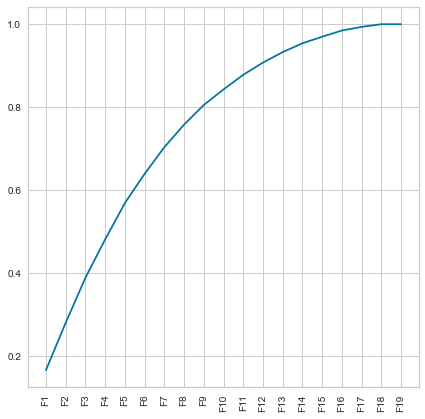

In [41]:
list_f = []
for i in range(0, customer_feature.columns[1:].size):
    list_f.append("F"+str(i+1))
    

plt.figure(figsize=(7,7))
plt.xticks(rotation='90')
# plt.plot(test_sa_don.columns, pca.explained_variance_ratio_.cumsum())
plt.plot(list_f, pca.explained_variance_ratio_.cumsum())

### 10 composantes suffisent pour conserver 90% de la donnée

## Diagramme des axes de corrélation

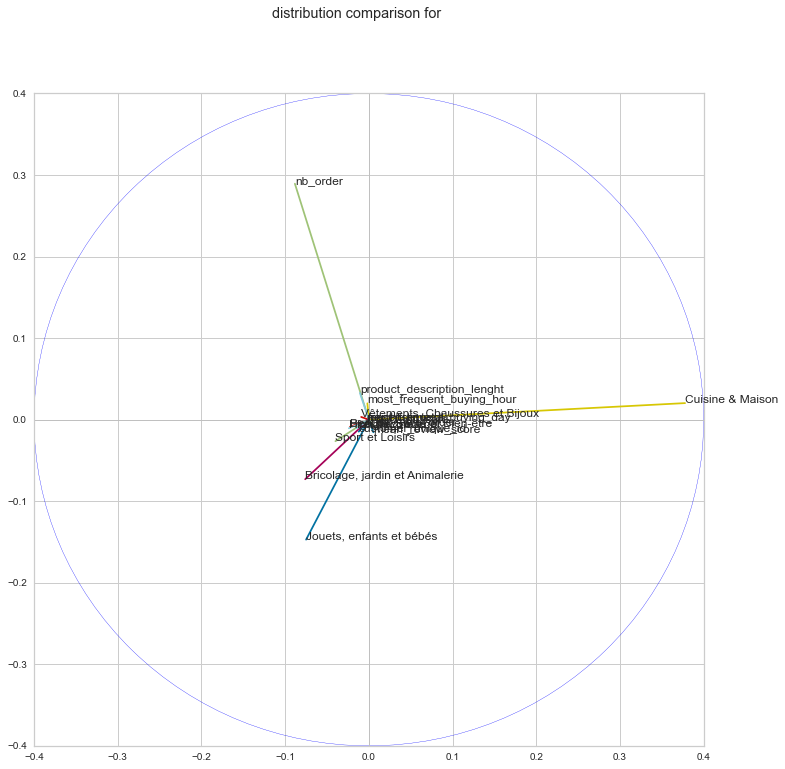

In [42]:
eigval_sqrt = np.sqrt(pca.explained_variance_ratio_)

corvar = np.zeros((len(eigval_sqrt),len(eigval_sqrt)))

for k in range(len(eigval_sqrt)):
    corvar[:,k] = pca.components_[k,:] * eigval_sqrt[k]
# print(corvar)

size_max= 0.4
fig, (ax1) = plt.subplots(1, 1, figsize=(12,12))
fig.suptitle('distribution comparison for ')

ax1.set_xlim(-1*size_max, size_max)
ax1.set_ylim(-1*size_max, size_max)
for j in range(len(eigval_sqrt)):
    ax1.annotate(customer_feature.columns[j],(corvar[j,0],corvar[j,1]))
    ax1.plot([0,corvar[j,0]], [0,corvar[j,1]])
ax1.plot([-1*size_max, size_max],[0,0],color='silver',linestyle='-',linewidth=1)
ax1.plot([0,0],[-1*size_max, size_max],color='silver',linestyle='-',linewidth=1)

cercle = plt.Circle((0,0),size_max,color='blue',fill=False)
ax1.add_artist(cercle)
plt.show()

0


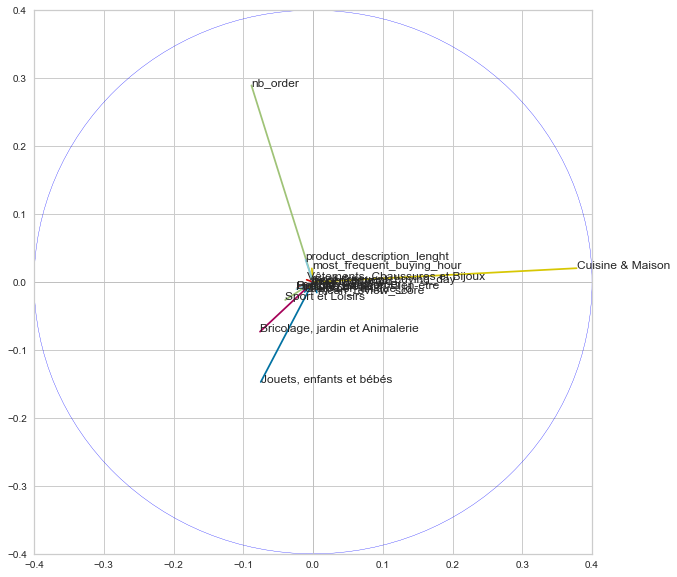

1


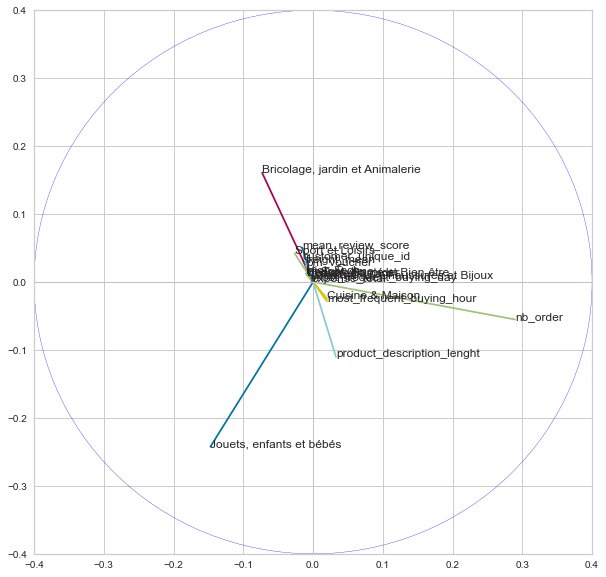

2


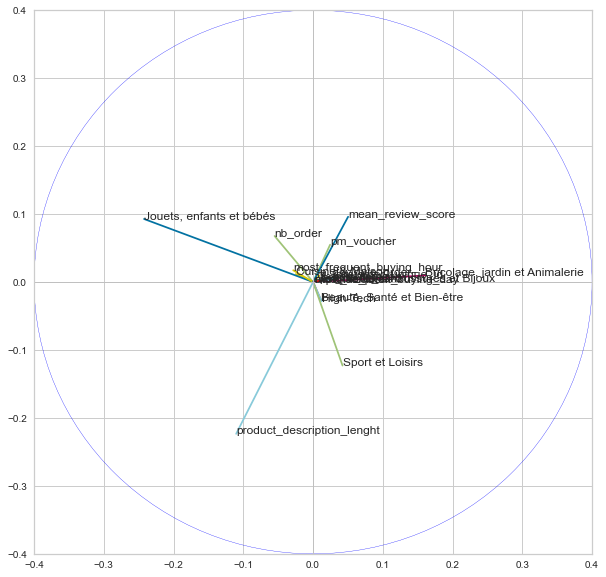

3


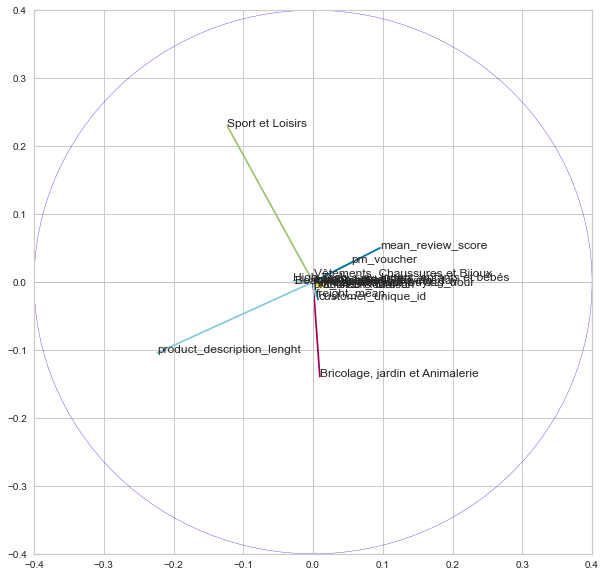

4


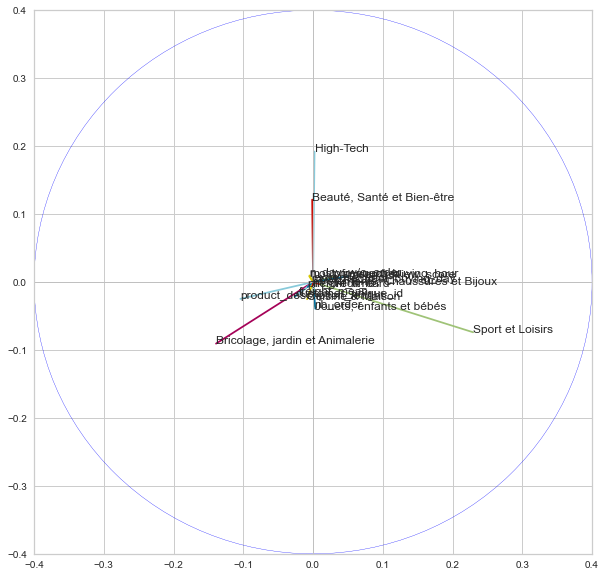

In [43]:
size_max= 0.4
for i in range(len(eigval_sqrt)-14):
    print(i)
    fig, axes = plt.subplots(figsize=(10,10))
    axes.set_xlim(-1*size_max, size_max)
    axes.set_ylim(-1*size_max, size_max)

    for j in range(len(eigval_sqrt)):
        plt.annotate(customer_feature.columns[j],(corvar[j,i],corvar[j,i+1]))
        plt.plot([0,corvar[j,i]], [0,corvar[j,i+1]])

    plt.plot([-1*size_max, size_max],[0,0],color='silver',linestyle='-',linewidth=1)
    plt.plot([0,0],[-1*size_max, size_max],color='silver',linestyle='-',linewidth=1)

    cercle = plt.Circle((0,0),size_max,color='blue',fill=False)
    axes.add_artist(cercle)

    plt.show()

#### En résumé, nous pourrions conserver 12premiers axes d'inertie afin de conserver 98% de l'information. Sur l'axe 1, 

## Utilisation de la table pca

In [44]:
pca_t = pd.DataFrame(data = pca_t)
n_useful_comp = 9
pca_t=pca_t.iloc[:,0:n_useful_comp]
pca_t

,0,1,2,3,4,5,6,7,8
0,-0.380728,-0.350526,0.810869,0.253581,-0.444956,0.356511,-0.667804,-0.362232,0.300701
1,-0.357506,-0.435290,1.087530,0.760019,-0.191929,0.127997,0.714159,-0.030302,0.575227
2,-0.391866,-0.387594,0.897613,0.303519,-0.411394,0.353957,-0.665762,-0.062779,-0.167457
3,-0.522767,-0.710320,-0.090366,0.394102,-0.577647,-0.545674,-0.109104,-0.176540,-0.123311
4,-0.398311,-0.302953,0.620283,-0.215511,-0.682005,0.032449,0.711928,-0.303287,-0.330005
...,...,...,...,...,...,...,...,...,...
72864,-0.176826,-0.085654,0.111351,-0.476703,0.798396,-0.210937,-0.019089,-0.253697,0.198896
72865,-0.194464,-0.102619,0.174169,-0.208746,-0.327793,-0.131659,-0.020356,-0.341446,-0.252828
72866,-0.153667,-0.028467,-0.007120,-0.317487,-0.094939,0.469785,0.799027,0.403279,0.171778
72867,-0.315730,0.864160,-0.248275,-0.043306,-0.100923,-0.109498,-0.041208,-0.340211,-0.083224


## KMEAN Optimization

### Elbow method avec yellowbricks

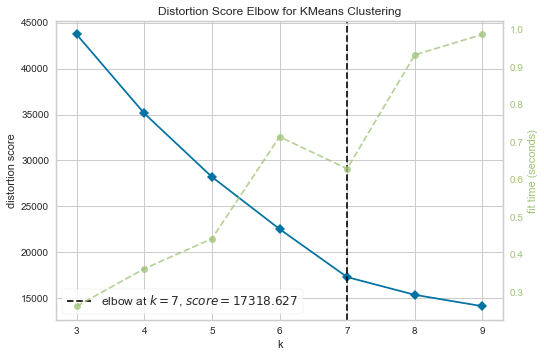

In [45]:
pca_t=pca_t.iloc[:,0:n_useful_comp]

model = KMeans()
visualizer = KElbowVisualizer(model, k=(3,10))

visualizer.fit(pca_t)    # Fit the data to the visualizer
visualizer.poof() 

C:\Users\Anwender\anaconda3\lib\site-packages\yellowbrick\utils\kneed.py:155: YellowbrickWarning: No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
  warnings.warn(warning_message, YellowbrickWarning)
C:\Users\Anwender\anaconda3\lib\site-packages\yellowbrick\cluster\elbow.py:343: YellowbrickWarning: No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning
  warnings.warn(warning_message, YellowbrickWarning)


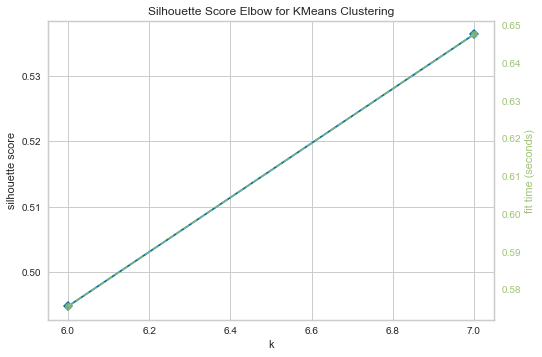

In [47]:
model = KMeans()
visualizer = KElbowVisualizer(model, k=(6,8), metric="silhouette")

visualizer.fit(pca_t)   
visualizer.show() 

### 7 noyaux pour notre cluster, avis en accord entre la methode du coude et la mesure de silhouette

### Confirmation with silhouette analysis

For n_clusters = 6 The average silhouette_score is : 0.48469326704445903
For n_clusters = 7 The average silhouette_score is : 0.5363288922853777
For n_clusters = 8 The average silhouette_score is : 0.49741276803426676


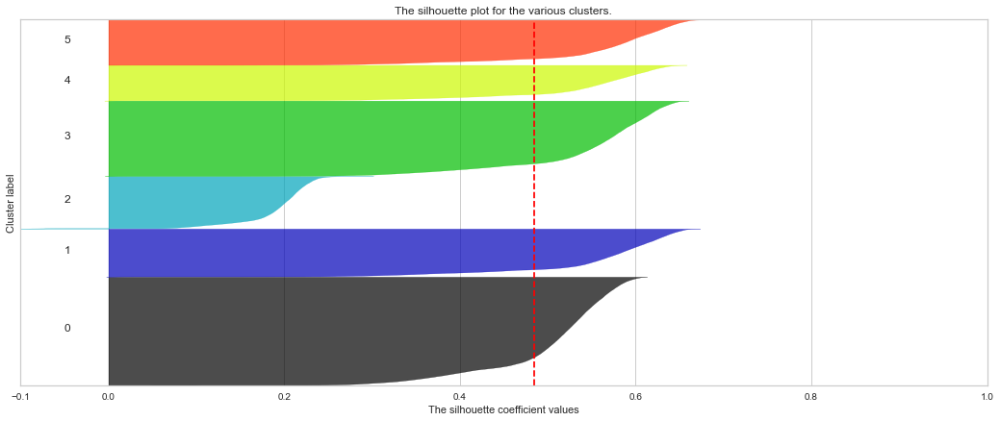

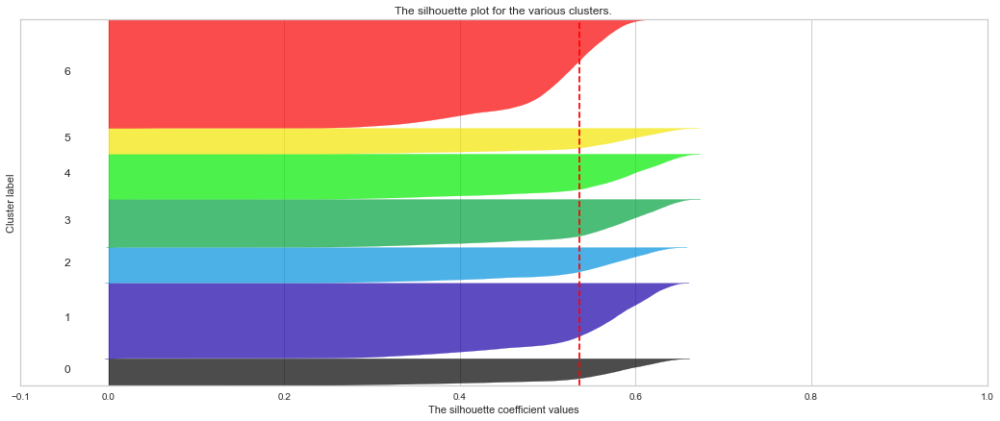

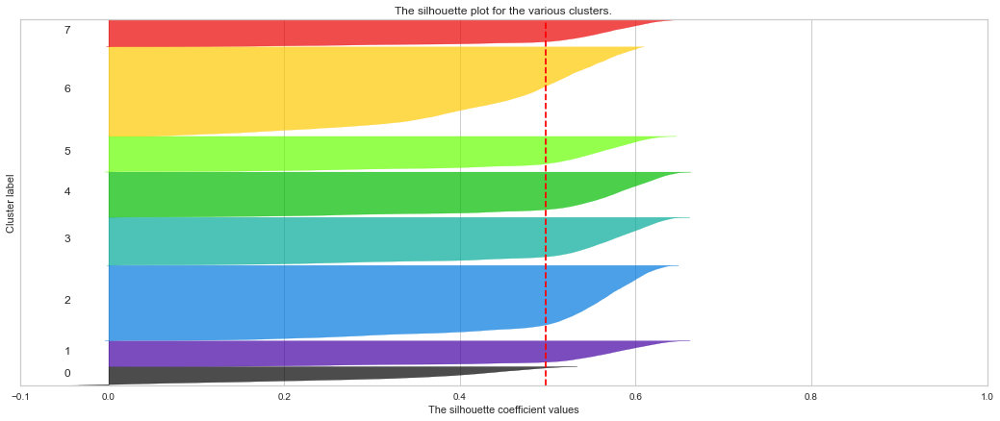

In [48]:
range_n_clusters = [6, 7, 8]

for n_clusters in range_n_clusters:
#     fig, (ax1, ax2) = plt.subplots(1, 2)
    fig, (ax1) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(pca_t) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(pca_t)

    silhouette_avg = silhouette_score(pca_t, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    sample_silhouette_values = silhouette_samples(pca_t, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

For n_clusters = 7 The average silhouette_score is : 0.5363288922853777


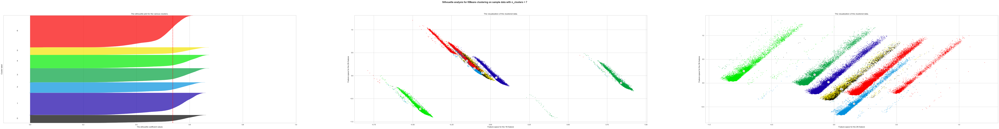

In [49]:
range_n_clusters = [7]

for n_clusters in range_n_clusters:
    fig, ax = plt.subplots(1, 3, figsize=(n_useful_comp*12,12))

    ax[0].set_xlim([-0.1, 1])
    ax[0].set_ylim([0, len(pca_t) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(pca_t)

    silhouette_avg = silhouette_score(pca_t, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    sample_silhouette_values = silhouette_samples(pca_t, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax[0].fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax[0].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10  # 10 for the 0 samples

    ax[0].set_title("The silhouette plot for the various clusters.")
    ax[0].set_xlabel("The silhouette coefficient values")
    ax[0].set_ylabel("Cluster label")

    ax[0].axvline(x=silhouette_avg, color="red", linestyle="--")

    ax[0].set_yticks([])  
    
    for axe in range(1, 3):
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax[axe].scatter(pca_t.iloc[:, axe], pca_t.iloc[:, axe+1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax[axe].scatter(centers[:, axe], centers[:, axe+1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax[axe].scatter(c[axe], c[axe+1], marker='$%d$' % i, alpha=1,
                        s=50, edgecolor='k')

        ax[axe].set_title("The visualization of the clustered data.")
        ax[axe].set_xlabel("Feature space for the "+str(axe)+"th feature")
        ax[axe].set_ylabel("Feature space for the "+str(axe+1)+"th feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

plt.show()

# Application KMEANS

In [50]:
pca = PCA()
pca_t = pca.fit_transform(customer_feature.iloc[:, 1:])
pca_t = pd.DataFrame(data = pca_t)
n_useful_comp = 9
n_cluster_opti = visualizer.elbow_value_
n_cluster_opti = 7
pca_t = pca_t.iloc[:,0:n_useful_comp]
kmeans = KMeans(n_clusters=n_cluster_opti, init="k-means++",random_state=0).fit(pca_t)

print(kmeans.labels_)
print(kmeans.cluster_centers_)

[0 0 0 ... 6 2 2]
[[-1.97716893e-01 -1.51396349e-01  3.21309776e-01  7.32384170e-03
  -2.53170660e-01 -1.40583339e-01 -2.35096747e-02 -1.48428507e-02
   1.99974337e-03]
 [ 8.39073759e-01  3.72409598e-02 -4.46604144e-02  1.97352626e-02
  -1.44127831e-02 -3.56961647e-02 -7.86848693e-03  2.75412762e-03
  -2.36458140e-03]
 [-3.09122451e-01  8.39224715e-01 -1.56552459e-01  1.76736054e-01
   2.87556069e-03 -8.11293229e-02 -1.80161619e-02  4.79784356e-03
  -9.85301045e-04]
 [-2.75491873e-01 -4.51274168e-01 -7.22769829e-01  2.52799365e-01
   6.77024447e-03 -9.23372906e-02 -1.80826990e-02  9.15543848e-03
  -1.43480296e-03]
 [-1.87926656e-01 -1.02911160e-01  1.59497071e-01 -4.32876578e-01
   7.85377878e-01 -2.25825928e-01 -3.10888276e-02  4.75541211e-05
  -3.95505734e-03]
 [-1.50933165e-01 -5.32494146e-02  6.28210321e-02 -1.31787001e-01
   8.90684401e-03  7.76794877e-01 -5.67056380e-01  1.62506349e-02
  -3.77878931e-03]
 [-1.46857421e-01 -4.61244411e-02  5.59350041e-02 -1.26188342e-01
  -6.13410

In [51]:
pca_t["cluster_label"] = kmeans.labels_
customer_feature["cluster_label"] = kmeans.labels_
customer_feature["cluster_label"] = kmeans.labels_
pca_t

,0,1,2,3,4,5,6,7,8,cluster_label
0,-0.380728,-0.350526,0.810869,0.253581,-0.444956,0.356511,-0.667804,-0.362232,0.300701,0
1,-0.357506,-0.435290,1.087530,0.760019,-0.191929,0.127997,0.714159,-0.030302,0.575227,0
2,-0.391866,-0.387594,0.897613,0.303519,-0.411394,0.353957,-0.665762,-0.062779,-0.167457,0
3,-0.522767,-0.710320,-0.090366,0.394102,-0.577647,-0.545674,-0.109104,-0.176540,-0.123311,0
4,-0.398311,-0.302953,0.620283,-0.215511,-0.682005,0.032449,0.711928,-0.303287,-0.330005,0
...,...,...,...,...,...,...,...,...,...,...
72864,-0.176826,-0.085654,0.111351,-0.476703,0.798396,-0.210937,-0.019089,-0.253697,0.198896,4
72865,-0.194464,-0.102619,0.174169,-0.208746,-0.327793,-0.131659,-0.020356,-0.341446,-0.252828,0
72866,-0.153667,-0.028467,-0.007120,-0.317487,-0.094939,0.469785,0.799027,0.403279,0.171778,6
72867,-0.315730,0.864160,-0.248275,-0.043306,-0.100923,-0.109498,-0.041208,-0.340211,-0.083224,2


In [52]:
customer_feature

,customer_unique_id,nb_order,"Beauté, Santé et Bien-être","Bricolage, jardin et Animalerie",Cuisine & Maison,High-Tech,"Jouets, enfants et bébés",Sport et Loisirs,"Vêtements, Chaussures et Bijoux",expense_total,n_day_w/o_order,freight_mean,pm_credit_card,pm_voucher,freight_time,most_frequent_buying_day,most_frequent_buying_hour,product_description_lenght,mean_review_score,review_length,cluster_label
0,f4769d07fbfa6b165ac06e843ce1e3da,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.187848,0.479626,0.198485,1.000000,0.0,0.089971,0.000,0.304348,0.528594,0.50,0.461538,0
1,cc6a7c09092000c1485649d3cff4e0c3,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.227869,0.094455,0.213638,1.000000,0.0,0.096362,0.375,0.086957,0.164783,0.00,0.927885,0
2,0e34a60534391f19af7e10f1c8ac28d4,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.477304,0.442320,0.406329,1.000000,0.0,0.034415,0.250,0.782609,0.091937,0.25,0.120192,0
3,e1708ec558c8c1d8bd5e24d022cd13ce,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.256743,0.168515,0.207696,1.000000,0.0,0.135939,0.125,0.739130,0.657289,0.75,0.173077,0
4,1fc8630d25cd738b571a0acc08c2eff7,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.243885,0.994327,0.199673,1.000000,0.0,0.153884,0.000,0.956522,0.266767,1.00,0.125000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72864,5b8515d0ff29f6655acc9bb8341b443a,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.177202,0.091201,0.234586,0.000000,0.0,0.367257,0.125,0.434783,0.147450,1.00,0.413462,4
72865,5b143240c381316b9b1dc332176b4a71,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.118581,0.496485,0.266677,0.333333,0.0,0.205752,0.000,0.869565,0.218287,1.00,0.000000,0
72866,5afa58a8f5f4690413cfa9e809d551c1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.070630,0.426269,0.185411,0.333333,0.0,0.190020,0.750,0.521739,0.084652,1.00,0.000000,6
72867,5b131a24689b26c3e931c218a83c7568,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.022666,0.450642,0.117070,0.333333,0.0,0.034907,0.000,0.695652,0.120322,1.00,0.000000,2


In [53]:
customer_feature_no_s

,customer_unique_id,nb_product_bought,nb_order,"Beauté, Santé et Bien-être","Bricolage, jardin et Animalerie",Cuisine & Maison,High-Tech,"Jouets, enfants et bébés",Sport et Loisirs,"Vêtements, Chaussures et Bijoux",expense_mean,expense_total,n_day_w/o_order,freight_mean,freight_total,pm_boleto,pm_credit_card,pm_voucher,freight_time,n_order_weekday,n_order_weekend,most_frequent_buying_day,most_frequent_buying_hour,product_description_lenght,mean_review_score,review_length
0,f4769d07fbfa6b165ac06e843ce1e3da,6.0,3,0,0,2,0,1,0,0,52.63,157.90,356.77,13.36,40.07,0,3,0,4.19,3.0,0.0,0,7,2108.333333,3.0,96.0
1,cc6a7c09092000c1485649d3cff4e0c3,6.0,3,0,1,2,0,0,0,0,63.79,191.36,70.26,14.38,43.13,0,3,0,4.45,3.0,0.0,3,2,660.000000,1.0,193.0
2,0e34a60534391f19af7e10f1c8ac28d4,6.0,3,0,0,2,0,1,0,0,133.30,399.90,329.02,27.35,82.05,0,3,0,1.93,3.0,0.0,2,18,370.000000,2.0,25.0
3,e1708ec558c8c1d8bd5e24d022cd13ce,6.0,3,0,0,2,0,0,1,0,71.83,215.50,125.35,13.98,41.95,0,3,0,6.06,3.0,0.0,1,17,2620.666667,4.0,36.0
4,1fc8630d25cd738b571a0acc08c2eff7,6.0,3,0,1,2,0,0,0,0,68.25,204.75,739.63,13.44,40.32,0,3,0,6.79,3.0,0.0,0,22,1066.000000,5.0,26.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72864,5b8515d0ff29f6655acc9bb8341b443a,1.0,1,0,0,0,0,0,0,1,149.00,149.00,67.84,15.79,15.79,1,0,0,15.47,1.0,0.0,1,10,591.000000,5.0,86.0
72865,5b143240c381316b9b1dc332176b4a71,1.0,1,0,0,1,0,0,0,0,99.99,99.99,369.31,17.95,17.95,0,1,0,8.90,1.0,0.0,0,20,873.000000,5.0,0.0
72866,5afa58a8f5f4690413cfa9e809d551c1,1.0,1,0,1,0,0,0,0,0,59.90,59.90,317.08,12.48,12.48,0,1,0,8.26,0.0,1.0,6,12,341.000000,5.0,0.0
72867,5b131a24689b26c3e931c218a83c7568,1.0,1,1,0,0,0,0,0,0,19.80,19.80,335.21,7.88,7.88,0,1,0,1.95,1.0,0.0,0,16,483.000000,5.0,0.0


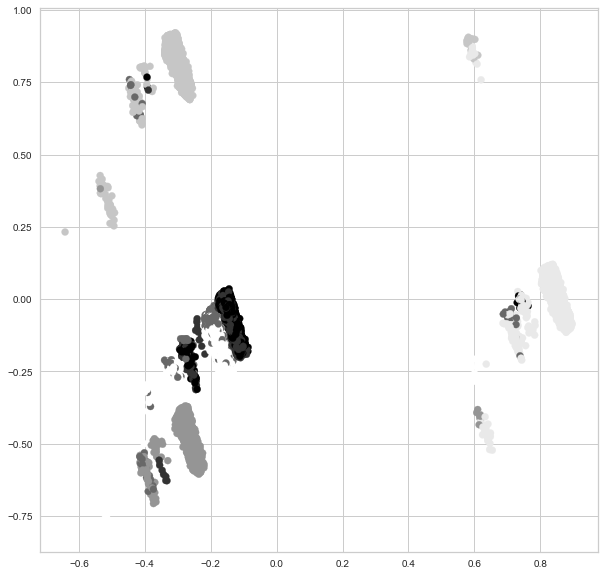

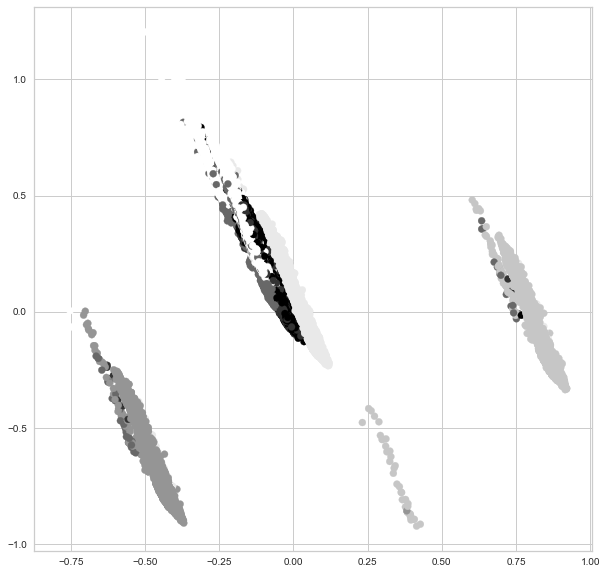

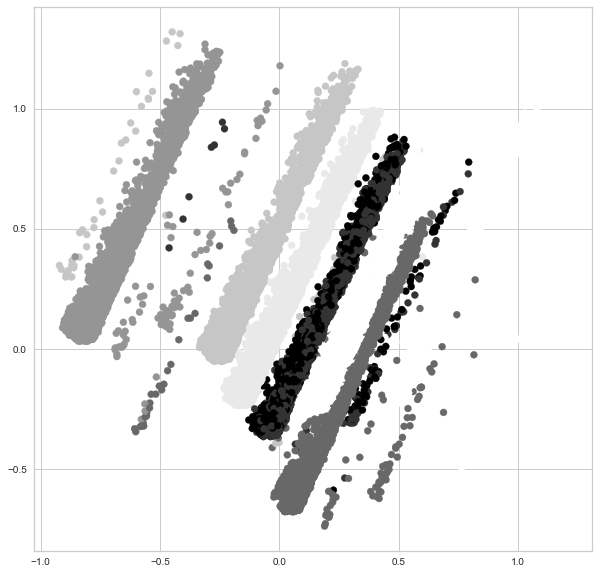

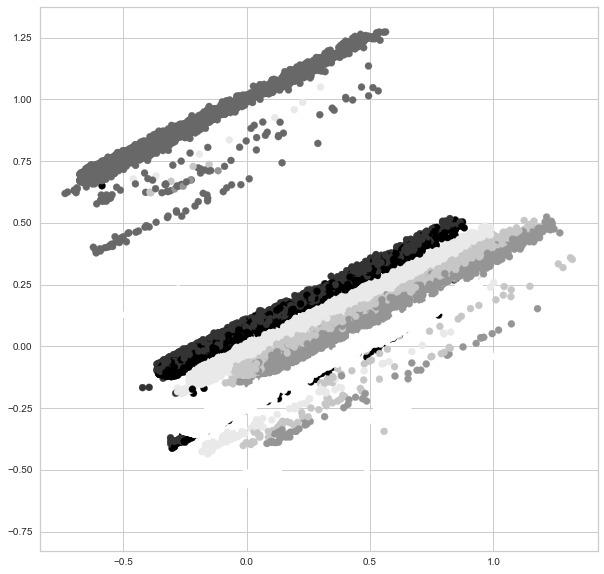

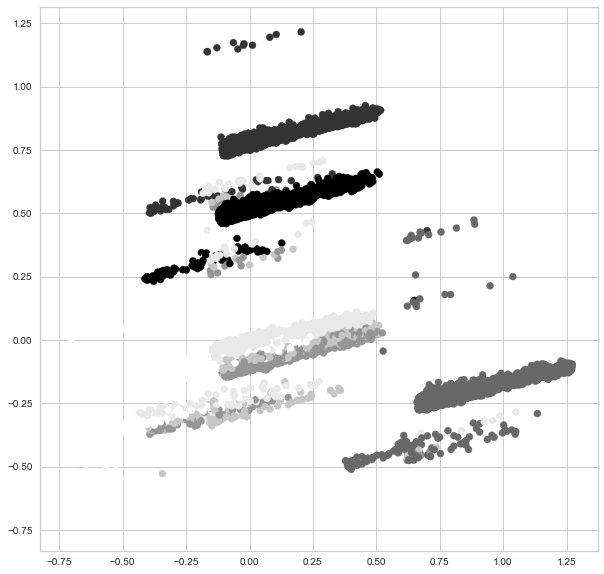

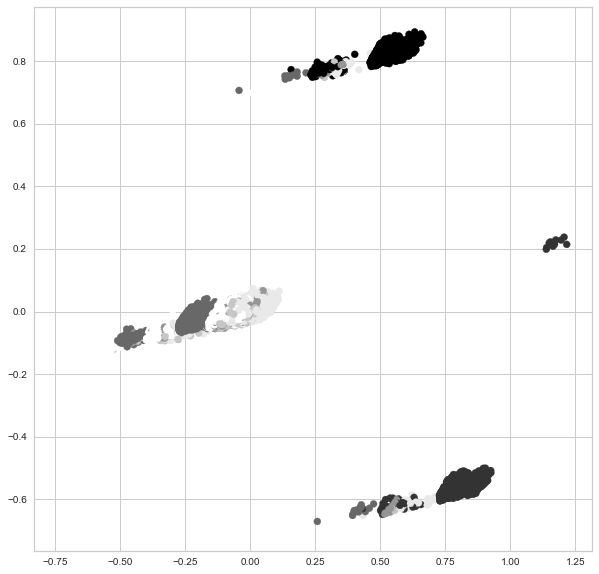

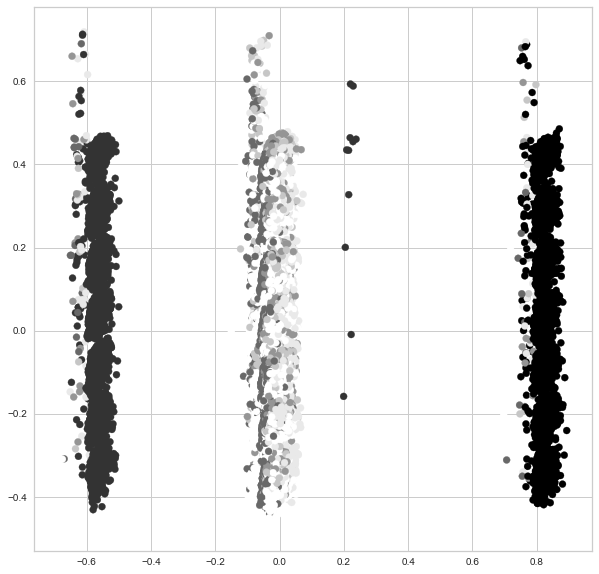

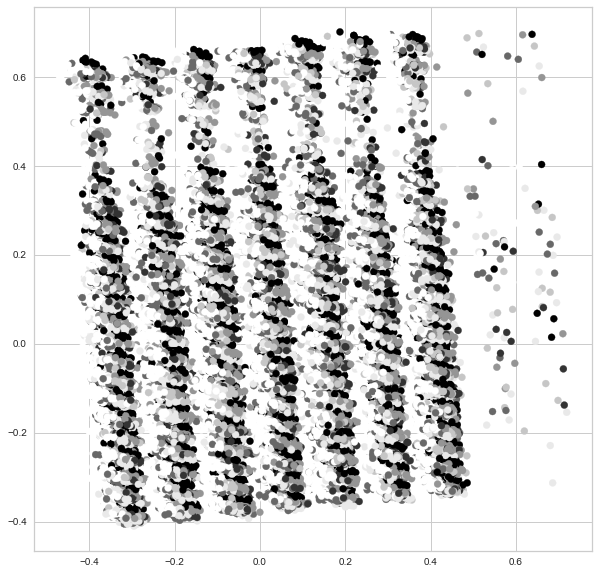

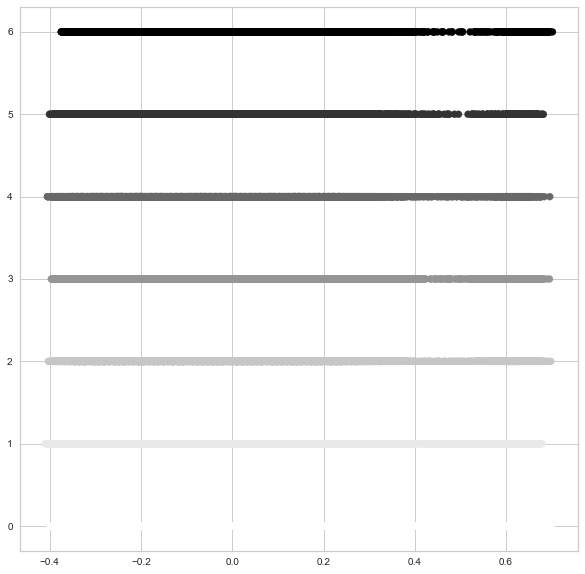

In [54]:
for i in range(0,n_useful_comp):
    plt.figure(figsize=(10,10))
    plt.scatter(pca_t.iloc[:,i], pca_t.iloc[:,i+1], c=pca_t["cluster_label"])
    plt.show()

In [63]:
from sklearn.manifold import TSNE
# tsne = TSNE(n_components=2, verbose=0, perplexity=20, n_iter=300)
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=300)
tsne_results = tsne.fit_transform(pca_t.iloc[:,:-1])

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 72869 samples in 0.161s...
[t-SNE] Computed neighbors for 72869 samples in 7.292s...
[t-SNE] Computed conditional probabilities for sample 1000 / 72869
[t-SNE] Computed conditional probabilities for sample 2000 / 72869
[t-SNE] Computed conditional probabilities for sample 3000 / 72869
[t-SNE] Computed conditional probabilities for sample 4000 / 72869
[t-SNE] Computed conditional probabilities for sample 5000 / 72869
[t-SNE] Computed conditional probabilities for sample 6000 / 72869
[t-SNE] Computed conditional probabilities for sample 7000 / 72869
[t-SNE] Computed conditional probabilities for sample 8000 / 72869
[t-SNE] Computed conditional probabilities for sample 9000 / 72869
[t-SNE] Computed conditional probabilities for sample 10000 / 72869
[t-SNE] Computed conditional probabilities for sample 11000 / 72869
[t-SNE] Computed conditional probabilities for sample 12000 / 72869
[t-SNE] Computed conditional probabilities for sa

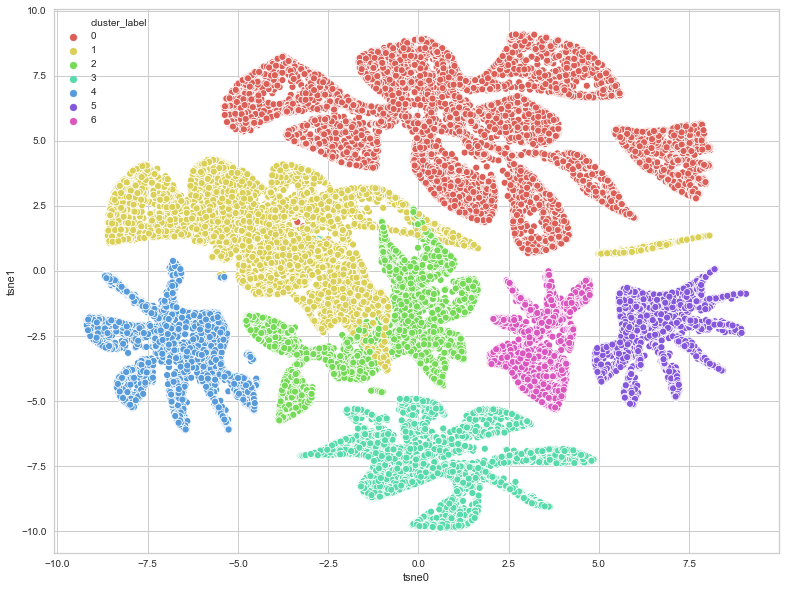

In [64]:
df_tsne = pd.DataFrame(data=tsne_results[:,0], columns=["tsne0"])
df_tsne["tsne1"] = tsne_results[:,1]

plt.figure(figsize=(13,10))
sns.scatterplot(
    x="tsne0", y="tsne1",
    data=df_tsne,
    palette=sns.color_palette("hls", n_cluster_opti),
    hue=pca_t["cluster_label"]
)

### Diagrammes en radar sur les noyaux de clusters

In [57]:
import plotly.graph_objects as go

categories = customer_feature.columns.values

test_radar = customer_feature.iloc[:,1:].groupby(by=["cluster_label"]).mean()
test_radar

for i in range(0, n_cluster_opti):
    fig = go.Figure()
    fig.add_trace(go.Scatterpolar(
          r=test_radar.iloc[i,:],
          theta=categories,
          fill='toself',
          name='Cluster '+str(i)
    ))

    fig.update_layout(
      polar=dict(
        radialaxis=dict(
          visible=True,
          range=[0, 1.1]
        )),
      showlegend=False
    )

    fig.show()
    


### Comment cela s'exprime dans les chiffres

In [58]:
customer_feature_no_s["cluster_label"] = kmeans.labels_
customer_feature_no_s

,customer_unique_id,nb_product_bought,nb_order,"Beauté, Santé et Bien-être","Bricolage, jardin et Animalerie",Cuisine & Maison,High-Tech,"Jouets, enfants et bébés",Sport et Loisirs,"Vêtements, Chaussures et Bijoux",expense_mean,expense_total,n_day_w/o_order,freight_mean,freight_total,pm_boleto,pm_credit_card,pm_voucher,freight_time,n_order_weekday,n_order_weekend,most_frequent_buying_day,most_frequent_buying_hour,product_description_lenght,mean_review_score,review_length,cluster_label
0,f4769d07fbfa6b165ac06e843ce1e3da,6.0,3,0,0,2,0,1,0,0,52.63,157.90,356.77,13.36,40.07,0,3,0,4.19,3.0,0.0,0,7,2108.333333,3.0,96.0,0
1,cc6a7c09092000c1485649d3cff4e0c3,6.0,3,0,1,2,0,0,0,0,63.79,191.36,70.26,14.38,43.13,0,3,0,4.45,3.0,0.0,3,2,660.000000,1.0,193.0,0
2,0e34a60534391f19af7e10f1c8ac28d4,6.0,3,0,0,2,0,1,0,0,133.30,399.90,329.02,27.35,82.05,0,3,0,1.93,3.0,0.0,2,18,370.000000,2.0,25.0,0
3,e1708ec558c8c1d8bd5e24d022cd13ce,6.0,3,0,0,2,0,0,1,0,71.83,215.50,125.35,13.98,41.95,0,3,0,6.06,3.0,0.0,1,17,2620.666667,4.0,36.0,0
4,1fc8630d25cd738b571a0acc08c2eff7,6.0,3,0,1,2,0,0,0,0,68.25,204.75,739.63,13.44,40.32,0,3,0,6.79,3.0,0.0,0,22,1066.000000,5.0,26.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72864,5b8515d0ff29f6655acc9bb8341b443a,1.0,1,0,0,0,0,0,0,1,149.00,149.00,67.84,15.79,15.79,1,0,0,15.47,1.0,0.0,1,10,591.000000,5.0,86.0,4
72865,5b143240c381316b9b1dc332176b4a71,1.0,1,0,0,1,0,0,0,0,99.99,99.99,369.31,17.95,17.95,0,1,0,8.90,1.0,0.0,0,20,873.000000,5.0,0.0,0
72866,5afa58a8f5f4690413cfa9e809d551c1,1.0,1,0,1,0,0,0,0,0,59.90,59.90,317.08,12.48,12.48,0,1,0,8.26,0.0,1.0,6,12,341.000000,5.0,0.0,6
72867,5b131a24689b26c3e931c218a83c7568,1.0,1,1,0,0,0,0,0,0,19.80,19.80,335.21,7.88,7.88,0,1,0,1.95,1.0,0.0,0,16,483.000000,5.0,0.0,2


<BarContainer object of 7 artists>

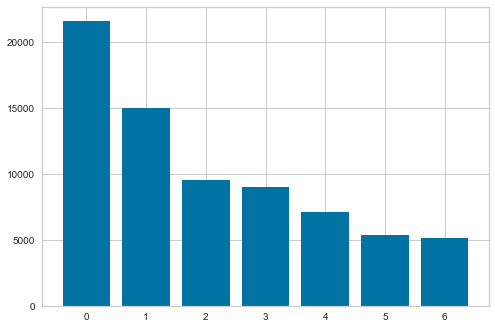

In [59]:
n = customer_feature_no_s["cluster_label"].value_counts()
n = n.sort_index(ascending=True)
plt.figure()
plt.bar(n.index, n.values)

In [60]:
conclusion = customer_feature_no_s.iloc[:,1:].groupby(by=["cluster_label"]).mean()
conclusion

,nb_product_bought,nb_order,"Beauté, Santé et Bien-être","Bricolage, jardin et Animalerie",Cuisine & Maison,High-Tech,"Jouets, enfants et bébés",Sport et Loisirs,"Vêtements, Chaussures et Bijoux",expense_mean,expense_total,n_day_w/o_order,freight_mean,freight_total,pm_boleto,pm_credit_card,pm_voucher,freight_time,n_order_weekday,n_order_weekend,most_frequent_buying_day,most_frequent_buying_hour,product_description_lenght,mean_review_score,review_length
cluster_label,,,,,,,,,,,,,,,,,,,,,,,,,
0,1.213469,1.124462,0.000093,0.000324,1.122101,0.000463,0.000324,0.000509,0.000648,95.908360,105.733811,288.648648,19.547794,21.761644,0.178940,0.915760,0.029762,11.942555,0.851701,0.272761,2.817265,14.862162,655.575692,4.142012,27.641210
1,1.014690,1.011898,0.000798,0.001595,0.005451,1.000000,0.002194,0.001329,0.000532,95.334039,96.444603,288.460515,17.604526,17.822052,0.237703,0.762364,0.011832,12.313038,0.777985,0.233914,2.769476,14.680404,789.627393,4.187705,27.373970
2,1.016595,1.013151,1.000000,0.000835,0.005532,0.001566,0.000731,0.003966,0.000522,120.827880,122.127290,284.471699,17.283156,17.505604,0.194865,0.805866,0.012420,11.339572,0.784469,0.228682,2.771214,14.784678,1013.721984,4.306266,23.788348
3,1.014061,1.010740,0.000111,0.001218,0.006089,0.000996,0.001882,1.000000,0.000443,104.207594,105.236660,287.806042,18.239042,18.428322,0.216453,0.781222,0.013065,11.689631,0.789969,0.220771,2.712910,14.804694,936.628155,4.332872,23.307739
4,1.024339,1.019977,0.002110,0.001407,0.006612,0.003658,0.002110,0.004080,1.000000,136.492669,138.638530,287.876410,16.901159,17.260208,0.183455,0.821891,0.014631,11.889606,0.782499,0.237479,2.822032,14.758582,578.432517,4.236986,28.444007
5,1.016981,1.012689,0.000187,0.002053,0.008770,0.000187,1.000000,0.001306,0.000187,107.434460,108.626971,291.460795,18.471196,18.710375,0.176712,0.824221,0.011756,11.329130,0.774585,0.238104,2.779250,14.801269,757.530789,4.253779,24.593488
6,1.022179,1.016342,0.000389,1.000000,0.014591,0.001167,0.000000,0.000000,0.000195,109.560720,111.414749,288.146467,21.217486,21.619449,0.220817,0.786576,0.008949,11.916796,0.771595,0.244747,2.786770,14.920817,851.244553,4.299319,25.312354


In [61]:
def cluster_describe(n, d):
    print("Les individus du cluster "+str(n)+
            " dépensent en moyenne "+
            str(round(d[d["cluster_label"]==n].iloc[:,10].mean(),2))+
            "sur "+str(round(d[d["cluster_label"]==n].iloc[:,1].mean(),0))+
            " commandes. Commandes généralement passées le "+
            str(round(d[d["cluster_label"]==n].iloc[:,-5].mode()[0],0))+
            "ème jour de la semaine")
cluster_describe(0, customer_feature_no_s)

Les individus du cluster 0 dépensent en moyenne 95.91sur 1.0 commandes. Commandes généralement passées le 15ème jour de la semaine


In [62]:
conclusion = conclusion.reset_index(level=[0,0])
conclusion

,cluster_label,nb_product_bought,nb_order,"Beauté, Santé et Bien-être","Bricolage, jardin et Animalerie",Cuisine & Maison,High-Tech,"Jouets, enfants et bébés",Sport et Loisirs,"Vêtements, Chaussures et Bijoux",expense_mean,expense_total,n_day_w/o_order,freight_mean,freight_total,pm_boleto,pm_credit_card,pm_voucher,freight_time,n_order_weekday,n_order_weekend,most_frequent_buying_day,most_frequent_buying_hour,product_description_lenght,mean_review_score,review_length
0,0,1.213469,1.124462,0.000093,0.000324,1.122101,0.000463,0.000324,0.000509,0.000648,95.908360,105.733811,288.648648,19.547794,21.761644,0.178940,0.915760,0.029762,11.942555,0.851701,0.272761,2.817265,14.862162,655.575692,4.142012,27.641210
1,1,1.014690,1.011898,0.000798,0.001595,0.005451,1.000000,0.002194,0.001329,0.000532,95.334039,96.444603,288.460515,17.604526,17.822052,0.237703,0.762364,0.011832,12.313038,0.777985,0.233914,2.769476,14.680404,789.627393,4.187705,27.373970
2,2,1.016595,1.013151,1.000000,0.000835,0.005532,0.001566,0.000731,0.003966,0.000522,120.827880,122.127290,284.471699,17.283156,17.505604,0.194865,0.805866,0.012420,11.339572,0.784469,0.228682,2.771214,14.784678,1013.721984,4.306266,23.788348
3,3,1.014061,1.010740,0.000111,0.001218,0.006089,0.000996,0.001882,1.000000,0.000443,104.207594,105.236660,287.806042,18.239042,18.428322,0.216453,0.781222,0.013065,11.689631,0.789969,0.220771,2.712910,14.804694,936.628155,4.332872,23.307739
4,4,1.024339,1.019977,0.002110,0.001407,0.006612,0.003658,0.002110,0.004080,1.000000,136.492669,138.638530,287.876410,16.901159,17.260208,0.183455,0.821891,0.014631,11.889606,0.782499,0.237479,2.822032,14.758582,578.432517,4.236986,28.444007
5,5,1.016981,1.012689,0.000187,0.002053,0.008770,0.000187,1.000000,0.001306,0.000187,107.434460,108.626971,291.460795,18.471196,18.710375,0.176712,0.824221,0.011756,11.329130,0.774585,0.238104,2.779250,14.801269,757.530789,4.253779,24.593488
6,6,1.022179,1.016342,0.000389,1.000000,0.014591,0.001167,0.000000,0.000000,0.000195,109.560720,111.414749,288.146467,21.217486,21.619449,0.220817,0.786576,0.008949,11.916796,0.771595,0.244747,2.786770,14.920817,851.244553,4.299319,25.312354


# DBSCAN

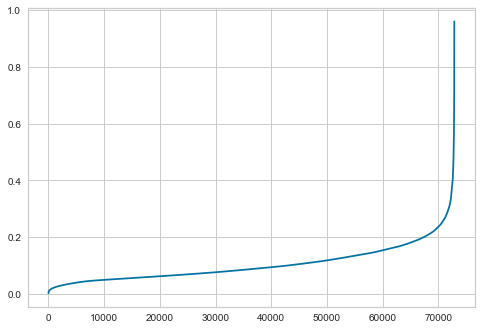

In [65]:
pca = PCA()
pca_t = pca.fit_transform(customer_feature.iloc[:, 1:])
pca_t = pd.DataFrame(data = pca_t)
n_useful_comp = 12
pca_t = pca_t.iloc[:,0:n_useful_comp]

neighbors = NearestNeighbors(n_neighbors=20)
neighbors_fit = neighbors.fit(pca_t)
distances, indices = neighbors_fit.kneighbors(pca_t)

distances = np.sort(distances, axis=0)
distances = distances[:,1]

plt.plot(distances)


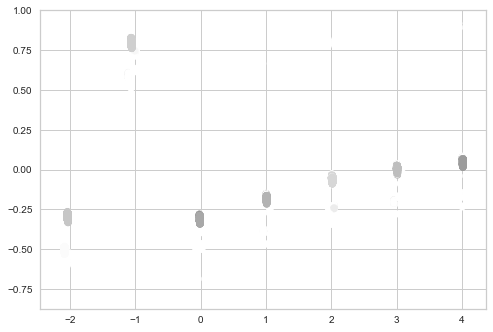

In [66]:
clustering = DBSCAN(eps=0.3, min_samples=5).fit_predict(pca_t)
# clustering.labels_
plt.scatter(pca_t.iloc[:,0],pca_t.iloc[:,1],c = clustering)

In [67]:
from collections import Counter
clustering = DBSCAN(eps=0.3, min_samples=5).fit(pca_t)
c = Counter(clustering.labels_)

In [68]:
c

Counter({-1: 1776,
         0: 2427,
         3: 8,
         4: 9,
         1: 6,
         5: 15,
         2: 7,
         10: 8766,
         6: 6798,
         7: 14746,
         8: 18856,
         9: 5160,
         11: 9326,
         12: 4896,
         25: 5,
         13: 4,
         17: 5,
         24: 6,
         21: 7,
         14: 7,
         23: 4,
         15: 7,
         16: 6,
         20: 5,
         18: 7,
         22: 5,
         19: 2,
         26: 3})

#### Le dbscan trouve c.? clusters aux tailles extrêmements variées. Ces résultats ne seront ni faciles à utiliser ni utiles à notre équipe marketing

# RFM et satisfaction client

### Kmeans

In [76]:
customer_feature.columns

Index(['customer_unique_id', 'nb_order', 'Beauté, Santé et Bien-être',
       'Bricolage, jardin et Animalerie', 'Cuisine & Maison', 'High-Tech',
       'Jouets, enfants et bébés', 'Sport et Loisirs',
       'Vêtements, Chaussures et Bijoux', 'expense_total', 'n_day_w/o_order',
       'freight_mean', 'pm_credit_card', 'pm_voucher', 'freight_time',
       'most_frequent_buying_day', 'most_frequent_buying_hour',
       'product_description_lenght', 'mean_review_score', 'review_length',
       'cluster_label'],
      dtype='object')

In [151]:
customer_feature = pd.read_csv('customer_feature')
customer_feature = customer_feature.iloc[:, 1:]
customer_feature.columns

Index(['customer_unique_id', 'nb_product_bought', 'nb_order',
       'Beauté, Santé et Bien-être', 'Bricolage, jardin et Animalerie',
       'Cuisine & Maison', 'High-Tech', 'Jouets, enfants et bébés',
       'Sport et Loisirs', 'Vêtements, Chaussures et Bijoux', 'expense_mean',
       'expense_total', 'n_day_w/o_order', 'freight_mean', 'freight_total',
       'pm_boleto', 'pm_credit_card', 'pm_voucher', 'freight_time',
       'n_order_weekday', 'n_order_weekend', 'most_frequent_buying_day',
       'most_frequent_buying_hour', 'product_description_lenght',
       'mean_review_score', 'review_length'],
      dtype='object')

In [198]:
# customer_feature_short = customer_feature[['customer_unique_id', 'nb_order', 'expense_total', 
#                                             'n_day_w/o_order', 'freight_mean']]
customer_feature_short = customer_feature[["customer_unique_id","nb_order", "pm_credit_card",
                                           "pm_voucher", "mean_review_score",
                                           "expense_total","n_day_w/o_order",
                                           "freight_time","freight_mean"]]
# "nb_order","review_score","expense_mean","n_day_w/o_order","pm_boleto",
# "pm_credit_card","pm_voucher","freight_time","freight_total","review_length"
customer_feature_short

,customer_unique_id,nb_order,pm_credit_card,pm_voucher,mean_review_score,expense_total,n_day_w/o_order,freight_time,freight_mean
0,f4769d07fbfa6b165ac06e843ce1e3da,1.0,1.000000,0.0,0.50,0.187848,0.479626,0.089971,0.198485
1,cc6a7c09092000c1485649d3cff4e0c3,1.0,1.000000,0.0,0.00,0.227869,0.094455,0.096362,0.213638
2,0e34a60534391f19af7e10f1c8ac28d4,1.0,1.000000,0.0,0.25,0.477304,0.442320,0.034415,0.406329
3,e1708ec558c8c1d8bd5e24d022cd13ce,1.0,1.000000,0.0,0.75,0.256743,0.168515,0.135939,0.207696
4,1fc8630d25cd738b571a0acc08c2eff7,1.0,1.000000,0.0,1.00,0.243885,0.994327,0.153884,0.199673
...,...,...,...,...,...,...,...,...,...
72864,5b8515d0ff29f6655acc9bb8341b443a,0.0,0.000000,0.0,1.00,0.177202,0.091201,0.367257,0.234586
72865,5b143240c381316b9b1dc332176b4a71,0.0,0.333333,0.0,1.00,0.118581,0.496485,0.205752,0.266677
72866,5afa58a8f5f4690413cfa9e809d551c1,0.0,0.333333,0.0,1.00,0.070630,0.426269,0.190020,0.185411
72867,5b131a24689b26c3e931c218a83c7568,0.0,0.333333,0.0,1.00,0.022666,0.450642,0.034907,0.117070


In [209]:
pca = PCA()
pca_t = pca.fit_transform(customer_feature_short.iloc[:, 1:])
pca_t = pd.DataFrame(data = pca_t)
pca.explained_variance_ratio_.cumsum()

array([0.78202784, 0.87297781, 0.90519068, 0.933156  , 0.95082531,
       0.96793464, 0.98415198, 0.99396596, 1.        ])

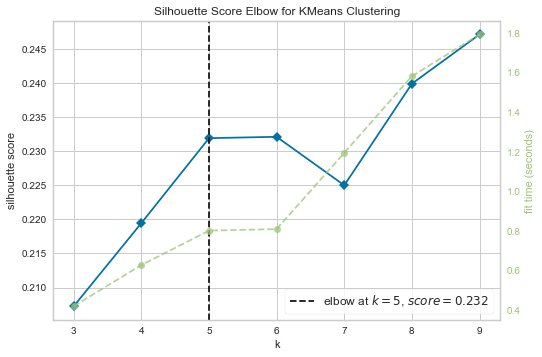

5

In [112]:
model = KMeans()
visualizer = KElbowVisualizer(model, k=(3,10), metric="silhouette")
# while visualizer.elbow_value_ is None:
visualizer.fit(pca_t)    # Fit the data to the visualizer
visualizer.poof() 
visualizer.elbow_value_

For n_clusters = 3 The average silhouette_score is : 0.20735551030835114
For n_clusters = 4 The average silhouette_score is : 0.21952873899732323
For n_clusters = 5 The average silhouette_score is : 0.21866386574112415
For n_clusters = 6 The average silhouette_score is : 0.21268927915399774
For n_clusters = 7 The average silhouette_score is : 0.23344345207900122


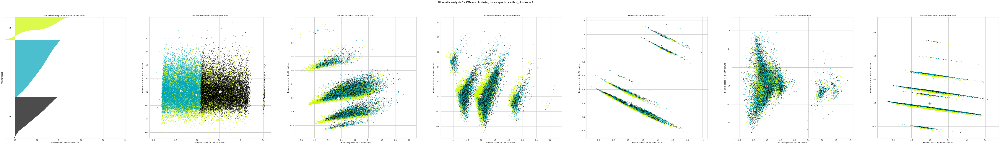

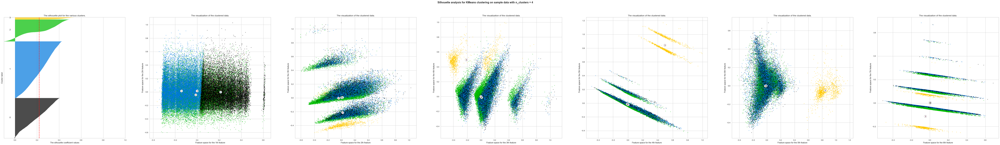

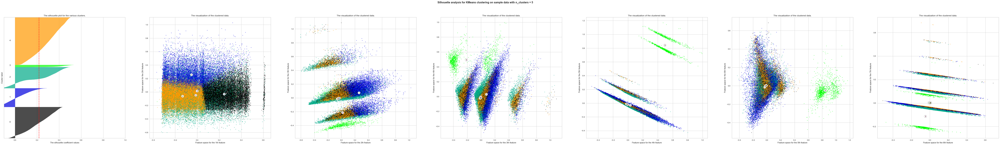

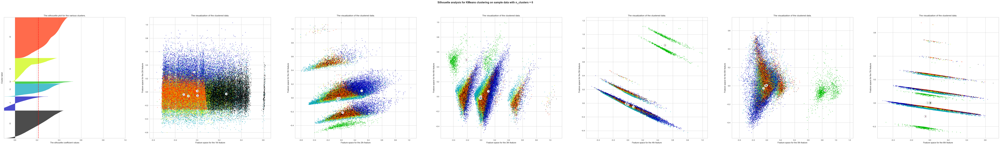

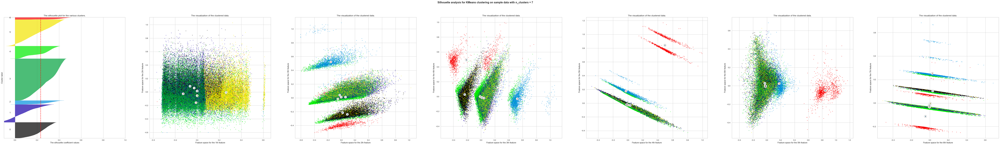

In [113]:
pca = PCA()
pca_t = pca.fit_transform(customer_feature_short.iloc[:, 1:])
pca_t = pd.DataFrame(data = pca_t)
n_useful_comp = pca_t.columns.size
# n_useful_comp = 3
# pca_t = pca_t.iloc[:,0:n_useful_comp]

range_n_clusters = [visualizer.elbow_value_-2,visualizer.elbow_value_-1,
                    visualizer.elbow_value_, visualizer.elbow_value_+1,visualizer.elbow_value_+2]

for n_clusters in range_n_clusters:
#     fig, (ax1, ax2) = plt.subplots(1, 2)
#     fig, (ax1) = plt.subplots(1, 1)
    fig, ax = plt.subplots(1, n_useful_comp-1, figsize=(n_useful_comp*12,12))
#     fig.set_size_inches(18, 7)

    ax[0].set_xlim([-0.1, 1])
    ax[0].set_ylim([0, len(pca_t) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(pca_t)

    silhouette_avg = silhouette_score(pca_t, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    sample_silhouette_values = silhouette_samples(pca_t, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax[0].fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax[0].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax[0].set_title("The silhouette plot for the various clusters.")
    ax[0].set_xlabel("The silhouette coefficient values")
    ax[0].set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax[0].axvline(x=silhouette_avg, color="red", linestyle="--")

    ax[0].set_yticks([])  # Clear the yaxis labels / ticks
#     ax[0].set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    for axe in range(1, n_useful_comp-1):
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax[axe].scatter(pca_t.iloc[:, axe], pca_t.iloc[:, axe+1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax[axe].scatter(centers[:, axe], centers[:, axe+1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax[axe].scatter(c[axe], c[axe+1], marker='$%d$' % i, alpha=1,
                        s=50, edgecolor='k')

        ax[axe].set_title("The visualization of the clustered data.")
        ax[axe].set_xlabel("Feature space for the "+str(axe)+"th feature")
        ax[axe].set_ylabel("Feature space for the "+str(axe+1)+"th feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')

plt.show()

In [114]:
print(visualizer.elbow_value_)

5


In [245]:
# n_cluster_opti = visualizer.elbow_value_
n_cluster_opti = 5
kmeans = KMeans(n_clusters=n_cluster_opti, random_state=0).fit(pca_t)
print(kmeans.labels_)
print(kmeans.cluster_centers_)

[2 3 2 ... 1 1 0]
[[-0.88415187 -0.13752298 -0.08086045]
 [ 1.14711565 -0.15583235  0.01154962]
 [ 0.13609733  0.34930989 -0.05459806]
 [ 0.15220658  0.79407394 -0.03096818]
 [-0.88198577 -0.04299726  0.20984231]]


In [246]:
customer_feature_short["cluster_label"] = kmeans.labels_
customer_feature_short

<ipython-input-246-3070f3a40b7c>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,customer_unique_id,nb_order,pm_credit_card,pm_voucher,mean_review_score,expense_total,n_day_w/o_order,freight_time,freight_mean,cluster_label
0,f4769d07fbfa6b165ac06e843ce1e3da,1.0,1.000000,0.0,0.50,0.187848,0.479626,0.089971,0.198485,2
1,cc6a7c09092000c1485649d3cff4e0c3,1.0,1.000000,0.0,0.00,0.227869,0.094455,0.096362,0.213638,3
2,0e34a60534391f19af7e10f1c8ac28d4,1.0,1.000000,0.0,0.25,0.477304,0.442320,0.034415,0.406329,2
3,e1708ec558c8c1d8bd5e24d022cd13ce,1.0,1.000000,0.0,0.75,0.256743,0.168515,0.135939,0.207696,0
4,1fc8630d25cd738b571a0acc08c2eff7,1.0,1.000000,0.0,1.00,0.243885,0.994327,0.153884,0.199673,1
...,...,...,...,...,...,...,...,...,...,...
72864,5b8515d0ff29f6655acc9bb8341b443a,0.0,0.000000,0.0,1.00,0.177202,0.091201,0.367257,0.234586,4
72865,5b143240c381316b9b1dc332176b4a71,0.0,0.333333,0.0,1.00,0.118581,0.496485,0.205752,0.266677,1
72866,5afa58a8f5f4690413cfa9e809d551c1,0.0,0.333333,0.0,1.00,0.070630,0.426269,0.190020,0.185411,1
72867,5b131a24689b26c3e931c218a83c7568,0.0,0.333333,0.0,1.00,0.022666,0.450642,0.034907,0.117070,1


<BarContainer object of 5 artists>

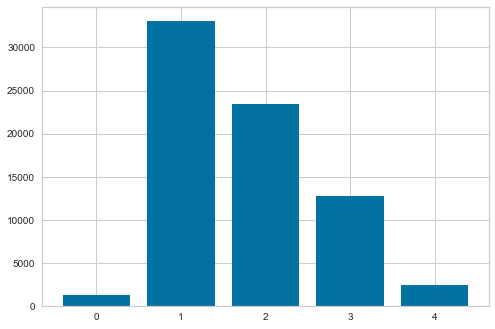

In [117]:
n = customer_feature_short["cluster_label"].value_counts()
n = n.sort_index(ascending=True)
plt.figure()
plt.bar(n.index, n.values)

<BarContainer object of 5 artists>

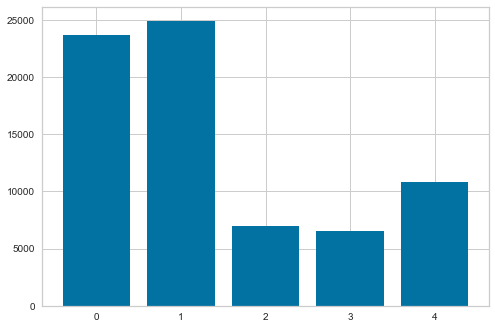

In [247]:
n = customer_feature_short["cluster_label"].value_counts()
n = n.sort_index(ascending=True)
plt.figure()
plt.bar(n.index, n.values)

In [118]:
categories = customer_feature_short.columns.values[1:]

test_radar = customer_feature_short.iloc[:,1:].groupby(by=["cluster_label"]).mean()
test_radar

for i in range(0, n_cluster_opti):
    fig = go.Figure()
    fig.add_trace(go.Scatterpolar(
          r=test_radar.iloc[i,:],
          theta=categories,
          fill='toself',
          name='Cluster '+str(i)
    ))

    fig.update_layout(
      polar=dict(
        radialaxis=dict(
          visible=True,
          range=[0, 1.1]
        )),
      showlegend=False
    )

    fig.show()

In [250]:
tsne = TSNE(n_components=2, verbose=0, perplexity=30, n_iter=300)
# tsne = TSNE(n_components=2,init="random", n_jobs=5, perplexity=40)
tsne_results = tsne.fit_transform(pca_t.iloc[:,:])

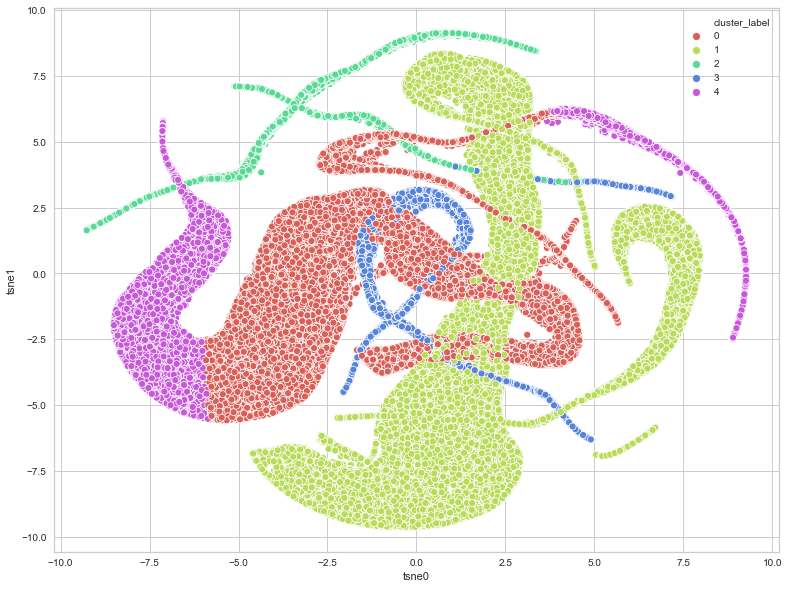

In [251]:
df_tsne = pd.DataFrame(data=tsne_results[:,0], columns=["tsne0"])
df_tsne["tsne1"] = tsne_results[:,1]

plt.figure(figsize=(13,10))
sns.scatterplot(
    x="tsne0", y="tsne1",
    data=df_tsne,
    palette=sns.color_palette("hls", n_cluster_opti),
    hue=customer_feature_short["cluster_label"]
)

### DBSCAN

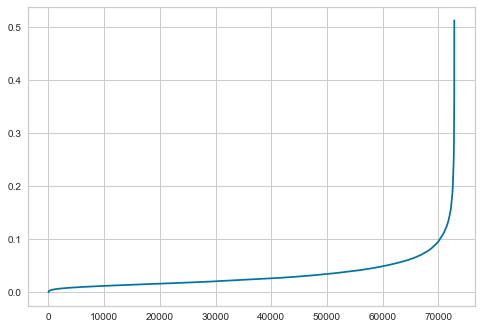

In [133]:
pca = PCA()

pca_t = pca.fit_transform(customer_feature_short.iloc[:, 1:])
pca_t = pd.DataFrame(data = pca_t)

neighbors = NearestNeighbors(n_neighbors=50)
neighbors_fit = neighbors.fit(pca_t)
distances, indices = neighbors_fit.kneighbors(pca_t)

distances = np.sort(distances, axis=0)
distances = distances[:,1]

plt.plot(distances)

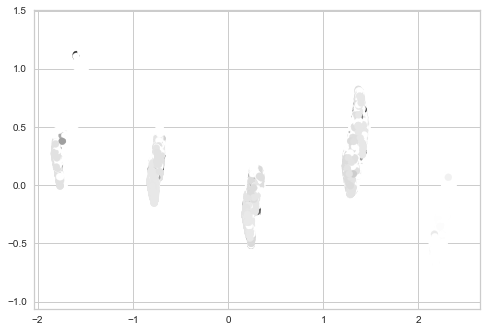

In [134]:
clustering_pred = DBSCAN(eps=0.07,min_samples=5).fit_predict(pca_t)
# clustering.labels_
plt.scatter(pca_t.iloc[:,0],pca_t.iloc[:,1],c = clustering_pred)

In [135]:
clustering = DBSCAN(eps=0.07,min_samples=5).fit(pca_t)
Counter(clustering.labels_)

Counter({-1: 10849,
         0: 809,
         1: 9,
         2: 18,
         6: 82,
         12: 9,
         3: 14,
         4: 81,
         5: 18,
         31: 5,
         22: 6,
         21: 5,
         7: 17,
         24: 5,
         11: 9,
         15: 9,
         27: 7,
         14: 4,
         26: 5,
         8: 7,
         9: 7,
         17: 5,
         13: 7,
         10: 5,
         25: 7,
         18: 5,
         19: 6,
         16: 3,
         23: 5,
         20: 2,
         32: 4,
         29: 16,
         28: 7,
         30: 6,
         33: 12309,
         34: 18708,
         35: 4546,
         36: 3045,
         37: 3845,
         38: 1403,
         39: 3043,
         40: 3168,
         95: 15,
         41: 5653,
         111: 11,
         42: 331,
         171: 4,
         47: 707,
         43: 781,
         54: 28,
         44: 521,
         127: 8,
         45: 8,
         206: 5,
         46: 315,
         48: 949,
         49: 103,
         160: 5,
         189: 5,
 

# Test de robustesse

In [136]:
customer_study = pd.read_csv('customer_study')
customer_study = customer_study.iloc[:, 1:]
customer_study["order_purchase_timestamp"] = customer_study.loc[:, ["order_purchase_timestamp"]].apply(lambda x: pd.to_datetime(x))             
customer_study = customer_study.sort_values(by=["order_purchase_timestamp"])  
customer_study

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english\r
101546,08c5351a6aca1c1589a38f244edeee9d,b7d76e111c89f7ebf14761390f0f7d17,69309,boa vista,RR,2e7a8482f6fb09756ca50c10d7bfc047,shipped,2016-09-04 21:15:19,2016-10-07 13:18:03,2016-10-18 13:14:51,NaN,2016-10-20 00:00:00,1.0,c1488892604e4ba5cff5b4eb4d595400,1554a68530182680ad5c8b042c3ab563,2016-10-26 18:25:19,39.99,31.67,1.0,credit_card,1.0,136.23,cef1ee03ded4d6272894a2eead6e1328,1,NaN,1 mes de atraso na entrega !!! ultima compra q...,2016-10-22 00:00:00,2016-11-15 16:00:34,moveis_decoracao,59.0,426.0,2.0,1400.0,32.0,6.0,28.0,furniture_decor\r
101547,08c5351a6aca1c1589a38f244edeee9d,b7d76e111c89f7ebf14761390f0f7d17,69309,boa vista,RR,2e7a8482f6fb09756ca50c10d7bfc047,shipped,2016-09-04 21:15:19,2016-10-07 13:18:03,2016-10-18 13:14:51,NaN,2016-10-20 00:00:00,2.0,f293394c72c9b5fafd7023301fc21fc2,1554a68530182680ad5c8b042c3ab563,2016-10-26 18:25:19,32.90,31.67,1.0,credit_card,1.0,136.23,cef1ee03ded4d6272894a2eead6e1328,1,NaN,1 mes de atraso na entrega !!! ultima compra q...,2016-10-22 00:00:00,2016-11-15 16:00:34,moveis_decoracao,41.0,754.0,3.0,1800.0,32.0,6.0,28.0,furniture_decor\r
84561,683c54fc24d40ee9f8a6fc179fd9856c,4854e9b3feff728c13ee5fc7d1547e92,99025,passo fundo,RS,e5fa5a7210941f7d56d0208e4e071d35,canceled,2016-09-05 00:15:34,2016-10-07 13:17:15,NaN,NaN,2016-10-28 00:00:00,1.0,f3c2d01a84c947b078e32bbef0718962,a425f92c199eb576938df686728acd20,2016-09-19 00:15:34,59.50,15.56,1.0,credit_card,3.0,75.06,a93139d9d1314158c080e3db7e79618b,1,NaN,Comprei dois produtos desta loja parceira da l...,2016-10-29 00:00:00,2016-10-30 01:47:48,telefonia,42.0,381.0,1.0,700.0,25.0,2.0,25.0,telephony\r
101726,622e13439d6b5a0b486c435618b2679e,009b0127b727ab0ba422f6d9604487c7,12244,sao jose dos campos,SP,809a282bbd5dbcabb6f2f724fca862ec,canceled,2016-09-13 15:24:19,2016-10-07 13:16:46,NaN,NaN,2016-09-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,1.0,credit_card,2.0,40.95,69ac6a27fde9855ebeaaecac0f78058b,1,NaN,MEU PEDIDO NÃO FOI ENTREGUE E NÃO FOI DADA NEN...,2016-10-02 00:00:00,2016-10-26 12:31:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25367,86dc2ffce2dfff336de2f386a786e574,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,bfbd0f9bdef84302105ad712db648a6c,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,1.0,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,NaN,NaN,NaN,NaN,6916ca4502d6d3bfd39818759d55d536,1,NaN,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,beleza_saude,34.0,1036.0,1.0,1000.0,16.0,16.0,16.0,health_beauty\r
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91152,2823ffda607a2316375088e0d00005ec,9bb92bebd4cb7511e1a02d5e50bc4655,7176,guarulhos,SP,392ed9afd714e3c74767d0c4d3e3f477,canceled,2018-09-29 09:13:03,NaN,NaN,NaN,2018-10-15 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,1.0,voucher,1.0,137.03,f1f8696d256889c0fe9962a5d32746e0,1,NaN,o produto foi entregue errado eu estou esperad...,2018-08-26 00:00:00,2018-08-28 01:26:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91057,bf6181a85bbb4115736c0a8db1a53be3,634420a0ea42302205032ed44ac7fccc,27175,pirai,RJ,616fa7d4871b87832197b2a137a115d2,canceled,2018-10-01 15:30:09,NaN,NaN,NaN,2018-10-23 00:00

In [137]:
category_dict = {
        np.nan                                        : 'Unknown',
        'bed_bath_table'                              : 'Cuisine & Maison',
        'health_beauty'                               : 'Beauté, Santé et Bien-être',
        'sports_leisure'                              : 'Sport et Loisirs',
        'furniture_decor'                             : 'Cuisine & Maison',
        'computers_accessories'                       : 'High-Tech',
        'housewares'                                  : 'Cuisine & Maison',
        'watches_gifts'                               : 'Vêtements, Chaussures et Bijoux',
        'telephony'                                   : 'High-Tech',
        'garden_tools'                                : 'Bricolage, jardin et Animalerie',
        'auto'                                        : 'Automobile et Industrie',
        'toys'                                        : 'Jouets, enfants et bébés',
        'cool_stuff'                                  : 'High-Tech',
        'perfumery'                                   : 'Beauté, Santé et Bien-être',
        'baby'                                        : 'Jouets, enfants et bébés',
        'electronics'                                 : 'High-Tech',
        'stationery'                                  : 'Sport et Loisirs',
        'fashion_bags_accessories'                    : 'Vêtements, Chaussures et Bijoux',
        'pet_shop'                                    : 'Bricolage, jardin et Animalerie',
        'office_furniture'                            : 'Cuisine & Maison',
        'luggage_accessories'                         : 'Vêtements, Chaussures et Bijoux',
        'consoles_games'                              : 'High-Tech',
        'construction_tools_construction'             : 'Bricolage, jardin et Animalerie',
        'home_appliances'                             : 'Cuisine & Maison',
        'musical_instruments'                         : 'Sport et Loisirs',
        'small_appliances'                            : 'Cuisine & Maison',
        'home_construction'                           : 'Bricolage, jardin et Animalerie',
        'books_general_interest'                      : 'Sport et Loisirs',
        'furniture_living_room'                       : 'Cuisine & Maison',
        'food'                                        : 'Cuisine & Maison',
        'home_confort'                                : 'Cuisine & Maison',
        'audio'                                       : 'High-Tech',
        'drinks'                                      : 'Cuisine & Maison',
        'market_place'                                : 'Cuisine & Maison',
        'construction_tools_lights'                   : 'Bricolage, jardin et Animalerie',
        'air_conditioning'                            : 'Cuisine & Maison',
        'kitchen_dining_laundry_garden_furniture'     : 'Cuisine & Maison',
        'food_drink'                                  : 'Cuisine & Maison',
        'fashion_shoes'                               : 'Vêtements, Chaussures et Bijoux',
        'books_technical'                             : 'Sport et Loisirs',
        'industry_commerce_and_business'              : 'Automobile et Industrie',
        'home_appliances_2'                           : 'Cuisine & Maison',
        'fixed_telephony'                             : 'High-Tech',
        'agro_industry_and_commerce'                  : 'Automobile et Industrie',
        'costruction_tools_garden'                    : 'Bricolage, jardin et Animalerie',
        'computers'                                   : 'High-Tech',
        'art'                                         : 'Sport et Loisirs',
        'signaling_and_security'                      : 'Cuisine & Maison',
        'construction_tools_safety'                   : 'Bricolage, jardin et Animalerie',
        'christmas_supplies'                          : 'Cuisine & Maison',
        'fashion_underwear_beach'                     : 'Vêtements, Chaussures et Bijoux',
        'fashion_male_clothing'                       : 'Vêtements, Chaussures et Bijoux',
        'furniture_bedroom'                           : 'Cuisine & Maison',
        'costruction_tools_tools'                     : 'Bricolage, jardin et Animalerie',
        'tablets_printing_image'                      : 'High-Tech',
        'small_appliances_home_oven_and_coffee'       : 'Cuisine & Maison',
        'cine_photo'                                  : 'High-Tech',
        'dvds_blu_ray'                                : 'High-Tech',
        'books_imported'                              : 'Sport et Loisirs',
        'fashio_female_clothing'                      : 'Vêtements, Chaussures et Bijoux',
        'party_supplies'                              : 'Cuisine & Maison',
        'furniture_mattress_and_upholstery'           : 'Cuisine & Maison',
        'music'                                       : 'Sport et Loisirs',
        'diapers_and_hygiene'                         : 'Beauté, Santé et Bien-être',
        'flowers'                                     : 'Bricolage, jardin et Animalerie',
        'home_comfort_2'                              : 'Cuisine & Maison',
        'fashion_sport'                               : 'Vêtements, Chaussures et Bijoux',
        'arts_and_craftmanship'                       : 'Cuisine & Maison',
        'la_cuisine'                                  : 'Cuisine & Maison',
        'cds_dvds_musicals'                           : 'Sport et Loisirs',
        'fashion_childrens_clothes'                   : 'Vêtements, Chaussures et Bijoux',
        'security_and_services'                       : 'Cuisine & Maison'
    }

init date=2016-09-04 21:15:19
_____________________________
timer=2017-05-04 21:15:19
pca_t size=8262
_____________________________
timer=2017-06-04 21:15:19
pca_t size=11839
_____________________________
timer=2017-07-04 21:15:19
pca_t size=14967
_____________________________
timer=2017-08-04 21:15:19
pca_t size=19041
_____________________________
timer=2017-09-04 21:15:19
pca_t size=23138
_____________________________
timer=2017-10-04 21:15:19
pca_t size=27351
_____________________________
timer=2017-11-04 21:15:19
pca_t size=31696
_____________________________
timer=2017-12-04 21:15:19
pca_t size=39503
_____________________________
timer=2018-01-04 21:15:19
pca_t size=44731
_____________________________
timer=2018-02-04 21:15:19
pca_t size=51820
_____________________________
timer=2018-03-04 21:15:19
pca_t size=58414
_____________________________
timer=2018-04-04 21:15:19
pca_t size=65411
1.0
0.9689578814622529
0.9494271810515267
0.9002374199979113
0.8349822411243252
0.7710655875866

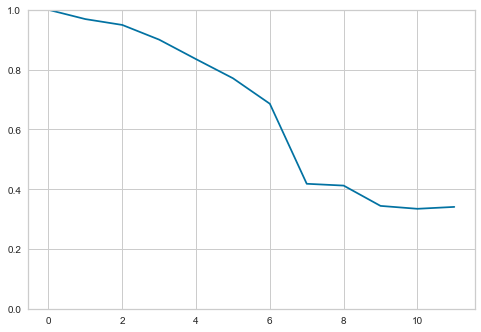

,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,cluster_11
customer_unique_id,,,,,,,,,,,,
0000f46a3911fa3c0805444483337064,2,2,2,2,2,2,2,3,3,3,3,4
0005e1862207bf6ccc02e4228effd9a0,2,2,2,2,2,2,2,3,3,3,3,4
00115fc7123b5310cf6d3a3aa932699e,6,6,6,6,6,6,6,6,6,6,6,4
0011805441c0d1b68b48002f1d005526,2,2,2,2,2,2,2,2,2,2,3,2
00191a9719ef48ebb5860b130347bf33,2,2,2,2,2,2,2,2,2,3,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...
ffe3e199b9d0b7fb7d2d29a5b9498447,0,0,0,0,0,0,0,5,5,5,5,5
ffebb6424578e7bb153322da9d65634f,5,5,5,5,5,5,5,5,5,5,5,5
ffedff0547d809c90c05c2691c51f9b7,1,1,1,1,1,1,1,1,1,1,1,1


In [150]:
def packup(data, key, namea, nameb):
    data = data.join(key, how="left", on="customer_unique_id")
    del(key)
    if namea != None and nameb != None:
        data = data.rename(columns={namea: nameb})
    return(data)

customer_study = pd.read_csv('customer_study')
customer_study = customer_study.iloc[:, 1:]
customer_study["order_purchase_timestamp"] = customer_study.loc[:, 
                                            ["order_purchase_timestamp"]].apply(lambda x: pd.to_datetime(x))             
# customer_study = customer_study.sort_values(by=["order_purchase_timestamp"], ascending=True)  
kpoint = customer_study.loc[:,"order_purchase_timestamp"].min()


print("init date="+str(kpoint))
timer = kpoint
timer = timer.replace(year=kpoint.year+1)
timer = timer.replace(month=timer.month-5)

# n_useful_comp = 20
n_useful_comp = 9
n_cluster_opti = 7

store_cluster_labels = pd.DataFrame(data = None, columns = ["cluster_0"])

count = 0
n_mois = 12

for i in range(0,n_mois):
    if timer.month <12:
        timer = timer.replace(month=timer.month+1)
    else:
        timer = timer.replace(month=1)
        timer = timer.replace(year=timer.year+1)
        
    print("_____________________________")
    print("timer="+str(timer))
    
    customer_study = pd.read_csv('customer_study')
    customer_study = customer_study.iloc[:, 1:]
    customer_study["order_purchase_timestamp"] = customer_study["order_purchase_timestamp"].apply(lambda x: pd.to_datetime(x))                           
    customer_study = customer_study.sort_values(by=["order_purchase_timestamp"], ascending=True) 
    customer_study = customer_study[customer_study["order_purchase_timestamp"]<=timer]
    
    customer_feature = pd.DataFrame()
    
    n_product_count = customer_study.loc[:,["customer_unique_id", 
                                        "order_item_id"]].groupby(["customer_unique_id"]).sum()
    n_product_count = n_product_count.reset_index(level=[0,0])
    customer_feature = n_product_count
#     customer_feature.set_index("customer_unique_id")
#     print("NB_ORDER")
    if count==0:
        unique_custom = customer_feature["customer_unique_id"]
        count=1
        
    customer_feature = customer_feature.rename(columns={"order_item_id": "nb_product_bought"})
    
    customer_nb_order = customer_study.loc[:,["customer_unique_id", "order_id"]].groupby("customer_unique_id").count()             
    customer_feature = packup(customer_feature, customer_nb_order, "order_id", "nb_order")
    customer_feature = customer_feature.drop(columns=["nb_product_bought"])
    
#     print("PRODUCT CATEGORY")
    customer_order_by_cat = customer_study.loc[:,["customer_unique_id", 
                                                  "product_category_name_english\r"]]
    customer_order_by_cat["product_category_name_english"] = customer_order_by_cat["product_category_name_english\r"].str.replace(r'\r$', '')             
    customer_order_by_cat = customer_order_by_cat.drop(columns=["product_category_name_english\r"])
    customer_order_by_cat['product_category_name_english'] = customer_order_by_cat['product_category_name_english'].apply(lambda x: category_dict[x])
    customer_order_by_cat = pd.get_dummies(customer_order_by_cat, columns=["product_category_name_english"], 
                                           prefix="",
                                           prefix_sep="")
    customer_order_by_cat = customer_order_by_cat.groupby(["customer_unique_id"]).sum()
    customer_feature = packup(customer_feature,customer_order_by_cat,None, None)
#     print("REVIEW SCORE")    
    temp_rscore = customer_study.loc[:,["customer_unique_id", 
                                      "review_score"]].groupby("customer_unique_id").mean() 
    customer_feature = packup(customer_feature, temp_rscore, None, None)
    
#     print("EXPENSE MEAN")
    temp_mean = customer_study.loc[:,["customer_unique_id", 
                                      "price"]].groupby("customer_unique_id").mean() 
    customer_feature = packup(customer_feature, temp_mean, "price", "expense_mean")

#     temp_tot = customer_study.loc[:,["customer_unique_id", 
#                                      "price"]].groupby("customer_unique_id").sum()
#     customer_feature = packup(customer_feature, temp_tot, "price", "expense_total")
    
#     print("RECENCE")
    test = customer_study.loc[:,["customer_unique_id", 
                                 "order_purchase_timestamp"]].groupby("customer_unique_id").max()
    test = test.reset_index(level=[0,0])
    test["order_purchase_timestamp"] = pd.to_datetime(test["order_purchase_timestamp"])
    customer_feature['n_day_w/o_order'] = test["order_purchase_timestamp"].max()
    customer_feature['n_day_w/o_order'] = round((customer_feature['n_day_w/o_order']
                                          -test["order_purchase_timestamp"])/np.timedelta64(1, 'D'),0)
    
#     print("PAYMENT")
    temp_payment = customer_study.loc[:,["customer_unique_id", "payment_type"]]       
    temp_payment = pd.get_dummies(temp_payment, columns=["payment_type"], prefix="pm")
    temp_payment = temp_payment.groupby(by="customer_unique_id").sum()
    customer_feature = packup(customer_feature,temp_payment,None,None)
    
#     print("FREIGHT TIME")
    temp_time = customer_study.loc[:, ["customer_unique_id", "order_purchase_timestamp",
                                       "order_delivered_customer_date"]]
    temp_time["order_purchase_timestamp"] = pd.to_datetime(temp_time["order_purchase_timestamp"])
    temp_time["order_delivered_customer_date"] = pd.to_datetime(temp_time["order_delivered_customer_date"])
    temp_time["diff_time"] = (temp_time["order_delivered_customer_date"]-
                              temp_time["order_purchase_timestamp"])/np.timedelta64(1, 'D')
    temp_time = temp_time.drop(columns=["order_purchase_timestamp",
                                        "order_delivered_customer_date"])
    temp_time = temp_time.groupby(by="customer_unique_id").mean()
    customer_feature = packup(customer_feature,temp_time,"diff_time","freight_time")

#     print("FREIGHT TOTAL")
    temp_freight = round(customer_study.loc[:,["customer_unique_id", "freight_value"]].groupby("customer_unique_id").sum(), 2)            
    customer_feature = packup(customer_feature, temp_freight, "freight_value","freight_total")
    
    
    k = customer_study.loc[:,["customer_unique_id", 
                              "product_description_lenght"]].groupby(by="customer_unique_id").mean()   
    customer_feature = packup(customer_feature, k,0,"product_description_lenght")
    
    l = customer_study[customer_study["review_comment_message"].isnull()==False]
    l = l.loc[:,["customer_unique_id", "review_comment_message"]] 
    l["review_length"] = l.loc[:,"review_comment_message"].astype(str).map(len)
    l = l.drop(columns=["review_comment_message"])
    l = l.groupby(by="customer_unique_id").mean()
    customer_feature = packup(customer_feature,l,None,None)
    
    if "pm_not_defined" in customer_feature.columns:
        customer_feature = customer_feature.drop(columns=['pm_not_defined'])
    if "pm_debit_card" in customer_feature.columns:
        customer_feature = customer_feature.drop(columns=['pm_debit_card'])
    
    customer_feature = customer_feature.fillna(0)
#     imputer = KNNImputer(n_neighbors=3)
#     customer_feature.iloc[:,1:] = imputer.fit_transform(customer_feature.iloc[:,1:])
#     customer_feature = customer_feature.dropna()
#     customer_feature = customer_feature[(np.abs(zscore(customer_feature.iloc[:,1:-4])) < 3).all(axis=1)]

# customer_feature
#     scaler = StandardScaler()
    scaler = MinMaxScaler()
#     scaler = RobustScaler()
    customer_feature.iloc[:,1:] = scaler.fit_transform(customer_feature.iloc[:,1:])
    customer_feature = customer_feature.set_index("customer_unique_id")

    pca = PCA()
    pca_t = pca.fit_transform(customer_feature.iloc[:,:])
    pca_t = pd.DataFrame(data = pca_t)
    pca_t.index = customer_feature.index

    pca_t = pca_t.iloc[:,0:n_useful_comp]
    print("pca_t size="+str(pca_t.iloc[:,0].size))

        
    if count == 1:
        count = 2
        n_cluster_opti = 7
        n_var = pca_t.columns.size
#         n_var = 12
        kmeans = KMeans(n_clusters=n_cluster_opti, init="k-means++", random_state=0).fit(pca_t)
        pca_t["clusters"] = kmeans.labels_
    else:
        pca_t["clusters"] = kmeans.predict(pca_t.iloc[:,0:n_var])

    store_cluster_labels["cluster_"+str(i)] =   pca_t.loc[unique_custom.values,"clusters"]
    
#     n = store_cluster_labels["cluster_"+str(i)].value_counts()
#     n = n.sort_index(ascending=True)
#     plt.figure()
#     plt.bar(n.index, n.values) 
#     plt.show()
    
from sklearn.metrics.cluster import adjusted_rand_score

adj = []
store_cluster_labels = store_cluster_labels.dropna()

for i in range(0,store_cluster_labels.columns.size):
    adj.append(adjusted_rand_score(store_cluster_labels.iloc[:,0], store_cluster_labels.iloc[:,i].astype(int)))
    print(adjusted_rand_score(store_cluster_labels.iloc[:,0], store_cluster_labels.iloc[:,i].astype(int) ))
    
plt.figure()
plt.ylim(0,1)
plt.plot(range(0,n_mois), adj)
plt.show()
store_cluster_labels
  

# Test de robustesse rfm

In [139]:
customer_study = pd.read_csv('customer_study')
customer_study = customer_study.iloc[:, 1:]
customer_study["order_purchase_timestamp"] = customer_study.loc[:, ["order_purchase_timestamp"]].apply(lambda x: pd.to_datetime(x))             
customer_study = customer_study.sort_values(by=["order_purchase_timestamp"])   
customer_study

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english\r
101546,08c5351a6aca1c1589a38f244edeee9d,b7d76e111c89f7ebf14761390f0f7d17,69309,boa vista,RR,2e7a8482f6fb09756ca50c10d7bfc047,shipped,2016-09-04 21:15:19,2016-10-07 13:18:03,2016-10-18 13:14:51,NaN,2016-10-20 00:00:00,1.0,c1488892604e4ba5cff5b4eb4d595400,1554a68530182680ad5c8b042c3ab563,2016-10-26 18:25:19,39.99,31.67,1.0,credit_card,1.0,136.23,cef1ee03ded4d6272894a2eead6e1328,1,NaN,1 mes de atraso na entrega !!! ultima compra q...,2016-10-22 00:00:00,2016-11-15 16:00:34,moveis_decoracao,59.0,426.0,2.0,1400.0,32.0,6.0,28.0,furniture_decor\r
101547,08c5351a6aca1c1589a38f244edeee9d,b7d76e111c89f7ebf14761390f0f7d17,69309,boa vista,RR,2e7a8482f6fb09756ca50c10d7bfc047,shipped,2016-09-04 21:15:19,2016-10-07 13:18:03,2016-10-18 13:14:51,NaN,2016-10-20 00:00:00,2.0,f293394c72c9b5fafd7023301fc21fc2,1554a68530182680ad5c8b042c3ab563,2016-10-26 18:25:19,32.90,31.67,1.0,credit_card,1.0,136.23,cef1ee03ded4d6272894a2eead6e1328,1,NaN,1 mes de atraso na entrega !!! ultima compra q...,2016-10-22 00:00:00,2016-11-15 16:00:34,moveis_decoracao,41.0,754.0,3.0,1800.0,32.0,6.0,28.0,furniture_decor\r
84561,683c54fc24d40ee9f8a6fc179fd9856c,4854e9b3feff728c13ee5fc7d1547e92,99025,passo fundo,RS,e5fa5a7210941f7d56d0208e4e071d35,canceled,2016-09-05 00:15:34,2016-10-07 13:17:15,NaN,NaN,2016-10-28 00:00:00,1.0,f3c2d01a84c947b078e32bbef0718962,a425f92c199eb576938df686728acd20,2016-09-19 00:15:34,59.50,15.56,1.0,credit_card,3.0,75.06,a93139d9d1314158c080e3db7e79618b,1,NaN,Comprei dois produtos desta loja parceira da l...,2016-10-29 00:00:00,2016-10-30 01:47:48,telefonia,42.0,381.0,1.0,700.0,25.0,2.0,25.0,telephony\r
101726,622e13439d6b5a0b486c435618b2679e,009b0127b727ab0ba422f6d9604487c7,12244,sao jose dos campos,SP,809a282bbd5dbcabb6f2f724fca862ec,canceled,2016-09-13 15:24:19,2016-10-07 13:16:46,NaN,NaN,2016-09-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,1.0,credit_card,2.0,40.95,69ac6a27fde9855ebeaaecac0f78058b,1,NaN,MEU PEDIDO NÃO FOI ENTREGUE E NÃO FOI DADA NEN...,2016-10-02 00:00:00,2016-10-26 12:31:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25367,86dc2ffce2dfff336de2f386a786e574,830d5b7aaa3b6f1e9ad63703bec97d23,14600,sao joaquim da barra,SP,bfbd0f9bdef84302105ad712db648a6c,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,1.0,5a6b04657a4c5ee34285d1e4619a96b4,ecccfa2bb93b34a3bf033cc5d1dcdc69,2016-09-19 23:11:33,44.99,2.83,NaN,NaN,NaN,NaN,6916ca4502d6d3bfd39818759d55d536,1,NaN,nao recebi o produto e nem resposta da empresa,2016-10-06 00:00:00,2016-10-07 18:32:28,beleza_saude,34.0,1036.0,1.0,1000.0,16.0,16.0,16.0,health_beauty\r
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91152,2823ffda607a2316375088e0d00005ec,9bb92bebd4cb7511e1a02d5e50bc4655,7176,guarulhos,SP,392ed9afd714e3c74767d0c4d3e3f477,canceled,2018-09-29 09:13:03,NaN,NaN,NaN,2018-10-15 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,1.0,voucher,1.0,137.03,f1f8696d256889c0fe9962a5d32746e0,1,NaN,o produto foi entregue errado eu estou esperad...,2018-08-26 00:00:00,2018-08-28 01:26:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
91057,bf6181a85bbb4115736c0a8db1a53be3,634420a0ea42302205032ed44ac7fccc,27175,pirai,RJ,616fa7d4871b87832197b2a137a115d2,canceled,2018-10-01 15:30:09,NaN,NaN,NaN,2018-10-23 00:00

In [140]:
kpoint = customer_study.iloc[0,7]
kpoint

Timestamp('2016-09-04 21:15:19')

init date=2016-09-04 21:15:19
_____________________________
timer=2017-09-04 21:15:19
pca_t size=23138
_____________________________
timer=2017-10-04 21:15:19
pca_t size=27351
_____________________________
timer=2017-11-04 21:15:19
pca_t size=31696
_____________________________
timer=2017-12-04 21:15:19
pca_t size=39503
_____________________________
timer=2018-01-04 21:15:19
pca_t size=44731
_____________________________
timer=2018-02-04 21:15:19
pca_t size=51820
_____________________________
timer=2018-03-04 21:15:19
pca_t size=58414
_____________________________
timer=2018-04-04 21:15:19
pca_t size=65411
_____________________________
timer=2018-05-04 21:15:19
pca_t size=72234
_____________________________
timer=2018-06-04 21:15:19
pca_t size=78486
_____________________________
timer=2018-07-04 21:15:19
pca_t size=84520
_____________________________
timer=2018-08-04 21:15:19
pca_t size=90911
_____________________________
timer=2018-09-04 21:15:19
pca_t size=96091
1.0
0.979351868682292

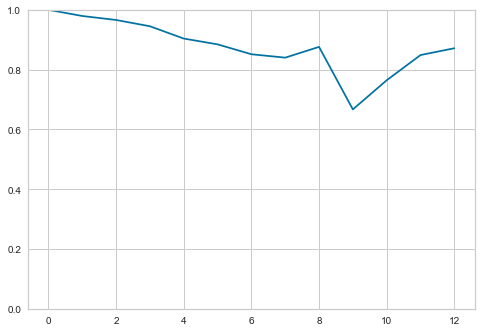

,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8,cluster_9,cluster_10,cluster_11,cluster_12
customer_unique_id,,,,,,,,,,,,,
0000f46a3911fa3c0805444483337064,1,1,1,1,1,1,0,0,1,0,0,1,1
0005e1862207bf6ccc02e4228effd9a0,0,0,0,0,0,0,0,0,0,0,0,0,0
0006fdc98a402fceb4eb0ee528f6a8d4,1,1,1,1,1,1,0,0,1,0,0,0,1
000a5ad9c4601d2bbdd9ed765d5213b3,0,0,0,0,0,0,0,0,0,0,0,0,0
000de6019bb59f34c099a907c151d855,1,1,1,1,1,1,1,1,1,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
fff3a9369e4b7102fab406a334a678c3,0,0,0,0,0,0,0,0,0,0,0,0,0
fff699c184bcc967d62fa2c6171765f7,4,4,4,4,4,4,4,4,4,4,4,4,4
fffcf5a5ff07b0908bd4e2dbc735a684,2,2,2,2,2,2,2,2,2,2,2,2,2


In [145]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

def packup(data, key, namea, nameb):
    data = data.join(key, how="left", on="customer_unique_id")
    del(key)
    if namea != None and nameb != None:
        data = data.rename(columns={namea: nameb})
    return(data)

customer_study = pd.read_csv('customer_study')
customer_study = customer_study.iloc[:, 1:]
customer_study["order_purchase_timestamp"] = customer_study.loc[:, 
                                            ["order_purchase_timestamp"]].apply(lambda x: pd.to_datetime(x))             
# customer_study = customer_study.sort_values(by=["order_purchase_timestamp"], ascending=True)  
kpoint = customer_study.loc[:,"order_purchase_timestamp"].min()


print("init date="+str(kpoint))
timer = kpoint
timer = timer.replace(year=kpoint.year+1)
timer = timer.replace(month=timer.month-1)

n_useful_comp = 12
n_cluster_opti = 5

store_cluster_labels = pd.DataFrame(data = None, columns = ["cluster_0"])

count = 0
n_mois = 13

for i in range(0,n_mois):
    if timer.month <12:
        timer = timer.replace(month=timer.month+1)
    else:
        timer = timer.replace(month=1)
        timer = timer.replace(year=timer.year+1)
        
    print("_____________________________")
    print("timer="+str(timer))
    
    customer_study = pd.read_csv('customer_study')
    customer_study = customer_study.iloc[:, 1:]
    customer_study["order_purchase_timestamp"] = customer_study["order_purchase_timestamp"].apply(lambda x: pd.to_datetime(x))                           
    customer_study = customer_study.sort_values(by=["order_purchase_timestamp"], ascending=True) 
    customer_study = customer_study[customer_study["order_purchase_timestamp"]<=timer]
    
    customer_feature = pd.DataFrame()
    
    n_product_count = customer_study.loc[:,["customer_unique_id", 
                                        "order_item_id"]].groupby(["customer_unique_id"]).sum()
    n_product_count = n_product_count.reset_index(level=[0,0])
    customer_feature = n_product_count
    
#     print("NB_ORDER")
    if count==0:
        unique_custom = customer_feature["customer_unique_id"]
        count=1
        
    customer_feature = customer_feature.rename(columns={"order_item_id": "nb_product_bought"})
    
    customer_nb_order = customer_study.loc[:,["customer_unique_id", "order_id"]].groupby("customer_unique_id").count()             
    customer_feature = packup(customer_feature, customer_nb_order, "order_id", "nb_order")
    customer_feature = customer_feature.drop(columns=["nb_product_bought"])
    
    temp_rscore = customer_study.loc[:,["customer_unique_id", 
                                      "review_score"]].groupby("customer_unique_id").mean() 
    customer_feature = packup(customer_feature, temp_rscore, None, None)
    
#     print("EXPENSE MEAN")
    temp_mean = customer_study.loc[:,["customer_unique_id", 
                                      "price"]].groupby("customer_unique_id").mean() 
    customer_feature = packup(customer_feature, temp_mean, "price", "expense_mean")
    
#     print("RECENCE")
    test = customer_study.loc[:,["customer_unique_id", 
                                 "order_purchase_timestamp"]].groupby("customer_unique_id").max()
    test = test.reset_index(level=[0,0])
    test["order_purchase_timestamp"] = pd.to_datetime(test["order_purchase_timestamp"])
    customer_feature['n_day_w/o_order'] = test["order_purchase_timestamp"].max()
    customer_feature['n_day_w/o_order'] = round((customer_feature['n_day_w/o_order']
                                          -test["order_purchase_timestamp"])/np.timedelta64(1, 'D'),0)
    
    temp_payment = customer_study.loc[:,["customer_unique_id", "payment_type"]]       
    temp_payment = pd.get_dummies(temp_payment, columns=["payment_type"], prefix="pm")
    temp_payment = temp_payment.groupby(by="customer_unique_id").sum()
    customer_feature = packup(customer_feature,temp_payment,None,None)
    
#     print("FREIGHT TIME")
    temp_time = customer_study.loc[:, ["customer_unique_id", "order_purchase_timestamp",
                                       "order_delivered_customer_date"]]
    temp_time["order_purchase_timestamp"] = pd.to_datetime(temp_time["order_purchase_timestamp"])
    temp_time["order_delivered_customer_date"] = pd.to_datetime(temp_time["order_delivered_customer_date"])
    temp_time["diff_time"] = (temp_time["order_delivered_customer_date"]-
                              temp_time["order_purchase_timestamp"])/np.timedelta64(1, 'D')
    temp_time = temp_time.drop(columns=["order_purchase_timestamp",
                                        "order_delivered_customer_date"])
    temp_time = temp_time.groupby(by="customer_unique_id").mean()
    customer_feature = packup(customer_feature,temp_time,"diff_time","freight_time")

#     print("FREIGHT TOTAL")
    temp_freight = round(customer_study.loc[:,["customer_unique_id", "freight_value"]].groupby("customer_unique_id").sum(), 2)            
    customer_feature = packup(customer_feature, temp_freight, "freight_value","freight_total")
    
    if "pm_not_defined" in customer_feature.columns:
        customer_feature = customer_feature.drop(columns=['pm_not_defined'])
    if "pm_debit_card" in customer_feature.columns:
        customer_feature = customer_feature.drop(columns=['pm_debit_card'])
    
    customer_feature = customer_feature.fillna(0)
#     imputer = KNNImputer(n_neighbors=3)
#     customer_feature.iloc[:,1:] = imputer.fit_transform(customer_feature.iloc[:,1:])
#     customer_feature = customer_feature.dropna()
    scaler = StandardScaler()
    customer_feature.iloc[:,1:] = scaler.fit_transform(customer_feature.iloc[:,1:])
    customer_feature = customer_feature.set_index("customer_unique_id")

    pca = PCA()
    pca_t = pca.fit_transform(customer_feature)
    pca_t = pd.DataFrame(data = pca_t)
    pca_t.index = customer_feature.index

    print("pca_t size="+str(pca_t.iloc[:,0].size))

        
    if count == 1:
        count = 2
#         n_cluster_opti = 5
        n_var = pca_t.columns.size
        kmeans = KMeans(n_clusters=n_cluster_opti, init="k-means++", random_state=0).fit(pca_t)
        pca_t["clusters"] = kmeans.labels_
    else:
        pca_t["clusters"] = kmeans.predict(pca_t.iloc[:,0:n_var])

    store_cluster_labels["cluster_"+str(i)] = pca_t.loc[unique_custom.values,"clusters"]
    
#     n = store_cluster_labels["cluster_"+str(i)].value_counts()
#     n = n.sort_index(ascending=True)
#     plt.figure()
#     plt.bar(n.index, n.values) 
#     plt.show()
    
from sklearn.metrics.cluster import adjusted_rand_score

adj = []
store_cluster_labels = store_cluster_labels.dropna()

for i in range(0,store_cluster_labels.columns.size):
    adj.append(adjusted_rand_score(store_cluster_labels.iloc[:,0], store_cluster_labels.iloc[:,i].astype(int)))
    print(adjusted_rand_score(store_cluster_labels.iloc[:,0], store_cluster_labels.iloc[:,i].astype(int)))
    
plt.figure()
plt.ylim(0,1)
plt.plot(range(0,n_mois), adj)
plt.show()
store_cluster_labels
  

In [ ]:
# def packup(data, key, namea, nameb):
#     data = data.join(key, how="left", on="customer_unique_id")
#     del(key)
#     if namea != None and nameb != None:
#         data = data.rename(columns={namea: nameb})
#     return(data)

# customer_study = pd.read_csv('customer_study')
# customer_study = customer_study.iloc[:, 1:]
# customer_study["order_purchase_timestamp"] = customer_study.loc[:, 
#                                             ["order_purchase_timestamp"]].apply(lambda x: pd.to_datetime(x))             
# # customer_study = customer_study.sort_values(by=["order_purchase_timestamp"], ascending=True)  
# kpoint = customer_study.loc[:,"order_purchase_timestamp"].min()


# print("init date="+str(kpoint))
# timer = kpoint
# timer = timer.replace(year=kpoint.year+1)
# timer = timer.replace(month=timer.month+2)

# n_useful_comp = 12
# n_cluster_opti = 5

# store_cluster_labels = pd.DataFrame(data = None, columns = ["cluster_0"])

# count = 0
# n_mois = 10

# for i in range(0,n_mois):
#     if timer.month <12:
#         timer = timer.replace(month=timer.month+1)
#     else:
#         timer = timer.replace(month=1)
#         timer = timer.replace(year=timer.year+1)
        
#     print("_____________________________")
#     print("timer="+str(timer))
    
#     customer_study = pd.read_csv('customer_study')
#     customer_study = customer_study.iloc[:, 1:]
#     customer_study["order_purchase_timestamp"] = customer_study["order_purchase_timestamp"].apply(lambda x: pd.to_datetime(x))                           
#     customer_study = customer_study.sort_values(by=["order_purchase_timestamp"], ascending=True) 
#     customer_study = customer_study[customer_study["order_purchase_timestamp"]<=timer]
    
#     customer_feature = pd.DataFrame()
    
#     n_product_count = customer_study.loc[:,["customer_unique_id", 
#                                         "order_item_id"]].groupby(["customer_unique_id"]).sum()
#     n_product_count = n_product_count.reset_index(level=[0,0])
#     customer_feature = n_product_count
# #     customer_feature.set_index("customer_unique_id")
# #     print("NB_ORDER")
#     if count==0:
#         unique_custom = customer_feature["customer_unique_id"]
#         count=1
        
#     customer_feature = customer_feature.rename(columns={"order_item_id": "nb_product_bought"})
    
#     customer_nb_order = customer_study.loc[:,["customer_unique_id", "order_id"]].groupby("customer_unique_id").count()             
#     customer_feature = packup(customer_feature, customer_nb_order, "order_id", "nb_order")
    
#     customer_feature = customer_feature.drop(columns=["nb_product_bought"])
    
# #     print("review score")    
#     temp_rscore = customer_study.loc[:,["customer_unique_id", 
#                                       "review_score"]].groupby("customer_unique_id").mean() 
#     customer_feature = packup(customer_feature, temp_rscore, None, None)
    
# #     print("EXPENSE MEAN")
#     temp_mean = customer_study.loc[:,["customer_unique_id", 
#                                       "price"]].groupby("customer_unique_id").mean() 
#     customer_feature = packup(customer_feature, temp_mean, "price", "expense_mean")

# #     temp_tot = customer_study.loc[:,["customer_unique_id", 
# #                                      "price"]].groupby("customer_unique_id").sum()
# #     customer_feature = packup(customer_feature, temp_tot, "price", "expense_total")
    
# #     print("RECENCE")
#     test = customer_study.loc[:,["customer_unique_id", 
#                                  "order_purchase_timestamp"]].groupby("customer_unique_id").max()
#     test = test.reset_index(level=[0,0])
#     test["order_purchase_timestamp"] = pd.to_datetime(test["order_purchase_timestamp"])
#     customer_feature['n_day_w/o_order'] = test["order_purchase_timestamp"].max()
#     customer_feature['n_day_w/o_order'] = round((customer_feature['n_day_w/o_order']
#                                           -test["order_purchase_timestamp"])/np.timedelta64(1, 'D'),0)
    
# #     print("PAYMENT TYPE")
#     temp_payment = customer_study.loc[:,["customer_unique_id", "payment_type"]]       
#     temp_payment = pd.get_dummies(temp_payment, columns=["payment_type"], prefix="pm")
#     temp_payment = temp_payment.groupby(by="customer_unique_id").sum()
#     customer_feature = packup(customer_feature,temp_payment,None,None)
    
# #     print("FREIGHT TIME")
#     temp_time = customer_study.loc[:, ["customer_unique_id", "order_purchase_timestamp",
#                                        "order_delivered_customer_date"]]
#     temp_time["order_purchase_timestamp"] = pd.to_datetime(temp_time["order_purchase_timestamp"])
#     temp_time["order_delivered_customer_date"] = pd.to_datetime(temp_time["order_delivered_customer_date"])
#     temp_time["diff_time"] = (temp_time["order_delivered_customer_date"]-
#                               temp_time["order_purchase_timestamp"])/np.timedelta64(1, 'D')
#     temp_time = temp_time.drop(columns=["order_purchase_timestamp",
#                                         "order_delivered_customer_date"])
#     temp_time = temp_time.groupby(by="customer_unique_id").mean()
#     customer_feature = packup(customer_feature,temp_time,"diff_time","freight_time")

# #     print("FREIGHT TOTAL")
#     temp_freight = round(customer_study.loc[:,["customer_unique_id", "freight_value"]].groupby("customer_unique_id").sum(), 2)            
#     customer_feature = packup(customer_feature, temp_freight, "freight_value","freight_total")
    
    
# #     customer_feature = customer_feature.drop(columns=['Unknown'])
#     if "pm_not_defined" in customer_feature.columns:
#         customer_feature = customer_feature.drop(columns=['pm_not_defined'])
#     if "pm_debit_card" in customer_feature.columns:
#         customer_feature = customer_feature.drop(columns=['pm_debit_card'])
    
#     customer_feature = customer_feature.fillna(0)
# #     imputer = KNNImputer(n_neighbors=3)
# #     customer_feature.iloc[:,1:] = imputer.fit_transform(customer_feature.iloc[:,1:])
# #     customer_feature = customer_feature.dropna()
#     scaler = StandardScaler()
# #     scaler = MinMaxScaler()
# #     scaler = RobustScaler()
#     customer_feature.iloc[:,1:] = scaler.fit_transform(customer_feature.iloc[:,1:])
#     customer_feature = customer_feature.set_index("customer_unique_id")

#     pca = PCA()
#     pca_t = pca.fit_transform(customer_feature)
#     pca_t = pd.DataFrame(data = pca_t)
#     pca_t.index = customer_feature.index


#     print("pca_t size="+str(pca_t.iloc[:,0].size))

        
#     if count == 1:
#         count = 2
#         n_cluster_opti = 5
#         n_var = pca_t.columns.size
#         kmeans = KMeans(n_clusters=n_cluster_opti, init="k-means++", random_state=0).fit(pca_t)
#         pca_t["clusters"] = kmeans.labels_
#     else:
#         pca_t["clusters"] = kmeans.predict(pca_t.iloc[:,0:n_var])

#     store_cluster_labels["cluster_"+str(i)] = pca_t.loc[unique_custom.values,"clusters"]
    
# #     n = store_cluster_labels["cluster_"+str(i)].value_counts()
# #     n = n.sort_index(ascending=True)
# #     plt.figure()
# #     plt.bar(n.index, n.values) 
# #     plt.show()
    
# from sklearn.metrics.cluster import adjusted_rand_score

# adj = []
# store_cluster_labels = store_cluster_labels.dropna()

# for i in range(0,store_cluster_labels.columns.size):
#     adj.append(adjusted_rand_score(store_cluster_labels.iloc[:,0], store_cluster_labels.iloc[:,i].astype(int)))
#     print(adjusted_rand_score(store_cluster_labels.iloc[:,0], store_cluster_labels.iloc[:,i].astype(int) ))
    
# plt.figure()
# plt.ylim(0,1)
# plt.plot(range(0,n_mois), adj)
# plt.show()
# store_cluster_labels
  

### Dashboard

In [ ]:
# app = dash.Dash(__name__)
# import dash
# import dash_core_components as dcc
# import dash_html_components as html
# from dash.dependencies import Input, Output

# table = customer_feature["nb_order"].value_counts()

# fig = go.Figure()
# fig.add_trace(go.Scatterpolar(
#       r=test_radar.iloc[0,:],
#       theta=categories,
#       fill='toself',
#       name='Cluster '+str(i)
# ))

# fig.update_layout(
#   polar=dict(
#     radialaxis=dict(
#       visible=True,
#       range=[0, 1.1]
#     )),
#   showlegend=False
# )

# colors = {
#     'background': '#273746',
#     'text': '#F7DC6F'
# }
# fig.update_layout(
#     plot_bgcolor=colors['background'],
#     paper_bgcolor=colors['background'],
#     font_color=colors['text']
# )

# # app.layout = html.Div(style={'backgroundColor': colors['background']},
# #                       children=[html.H1(children='Customer Discovery', 
# #                                         style={'textAlign': 'center','color': colors['text']}),

# #                     html.Div(children='''Customer Knowledge''',
# #                             style={'textAlign': 'center','color': colors['text']}),

# #                     dcc.Dropdown(id='Clusters',
# #                                 options=[{'label': i, 'value': i} for i in range(0,6)],
# #                                 value=0),

# #                     dcc.Graph( id='graph',figure=fig )
# #                 ])




# app.layout = html.Div([
#     html.Div([

#         html.Div([
#             dcc.Dropdown(
#                 id='Clusters',
#                 options=[{'label': i, 'value': i} for i in range(0,6)],
#                 value=0
#             )
#         ], style={'width': '48%', 'display': 'inline-block'})
#     ]),

#     dcc.Graph(id='Graph')
# ])


# @app.callback(
#     Output('Graph', 'figure'),
#     Input('Clusters', 'value'))
# def update_graph(Clusters):
#     figure = go.Figure()
#     figure.add_trace(go.Scatterpolar(
#           r=test_radar.iloc[Clusters,:],
#           theta=categories,
#           fill='toself',
#           name='Cluster '+str(i)
#     ))

#     figure.update_layout(
#       polar=dict(
#         radialaxis=dict(
#           visible=True,
#           range=[0, 1.1]
#         )),
#       showlegend=False
#     )
#     return figure

# app.run_server(debug=False)

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

def packup(data, key, namea, nameb):
    data = data.join(key, how="left", on="customer_unique_id")
    del(key)
    if namea != None and nameb != None:
        data = data.rename(columns={namea: nameb})
    return(data)

customer_study = pd.read_csv('customer_study')
customer_study = customer_study.iloc[:, 1:]
customer_study["order_purchase_timestamp"] = customer_study.loc[:, 
                                            ["order_purchase_timestamp"]].apply(lambda x: pd.to_datetime(x))             
# customer_study = customer_study.sort_values(by=["order_purchase_timestamp"], ascending=True)  
kpoint = customer_study.loc[:,"order_purchase_timestamp"].min()


print("init date="+str(kpoint))
timer = kpoint
timer = timer.replace(year=kpoint.year+1)
timer = timer.replace(month=timer.month+2)

n_useful_comp = 12
n_cluster_opti = 6

store_cluster_labels = pd.DataFrame(data = None, columns = ["cluster_0"])

count = 0
n_mois = 10

for i in range(0,n_mois):
    if timer.month <12:
        timer = timer.replace(month=timer.month+1)
    else:
        timer = timer.replace(month=1)
        timer = timer.replace(year=timer.year+1)
        
    print("_____________________________")
    print("timer="+str(timer))
    
    customer_study = pd.read_csv('customer_study')
    customer_study = customer_study.iloc[:, 1:]
    customer_study["order_purchase_timestamp"] = customer_study["order_purchase_timestamp"].apply(lambda x: pd.to_datetime(x))                           
    customer_study = customer_study.sort_values(by=["order_purchase_timestamp"], ascending=True) 
    customer_study = customer_study[customer_study["order_purchase_timestamp"]<=timer]
    
    customer_feature = pd.DataFrame()
    
    n_product_count = customer_study.loc[:,["customer_unique_id", 
                                        "order_item_id"]].groupby(["customer_unique_id"]).sum()
    n_product_count = n_product_count.reset_index(level=[0,0])
    customer_feature = n_product_count
#     customer_feature.set_index("customer_unique_id")
#     print("NB_ORDER")
    if count==0:
        unique_custom = customer_feature["customer_unique_id"]
        count=1
        
    customer_feature = customer_feature.rename(columns={"order_item_id": "nb_product_bought"})
    
    customer_nb_order = customer_study.loc[:,["customer_unique_id", "order_id"]].groupby("customer_unique_id").count()             
    customer_feature = packup(customer_feature, customer_nb_order, "order_id", "nb_order")
    customer_feature = customer_feature.drop(columns=["nb_product_bought"])
    
#     print("PRODUCT CATEGORY")
#     customer_order_by_cat = customer_study.loc[:,["customer_unique_id", 
#                                                   "product_category_name_english\r"]]
#     customer_order_by_cat["product_category_name_english"] = customer_order_by_cat["product_category_name_english\r"].str.replace(r'\r$', '')             
#     customer_order_by_cat = customer_order_by_cat.drop(columns=["product_category_name_english\r"])
#     customer_order_by_cat['product_category_name_english'] = customer_order_by_cat['product_category_name_english'].apply(lambda x: category_dict[x])
#     customer_order_by_cat = pd.get_dummies(customer_order_by_cat, columns=["product_category_name_english"], 
#                                            prefix="",
#                                            prefix_sep="")
#     customer_order_by_cat = customer_order_by_cat.groupby(["customer_unique_id"]).sum()
#     customer_feature = packup(customer_feature,customer_order_by_cat,None, None)
    
    temp_rscore = customer_study.loc[:,["customer_unique_id", 
                                      "review_score"]].groupby("customer_unique_id").mean() 
    customer_feature = packup(customer_feature, temp_rscore, None, None)
    
#     print("EXPENSE MEAN")
    temp_mean = customer_study.loc[:,["customer_unique_id", 
                                      "price"]].groupby("customer_unique_id").mean() 
    customer_feature = packup(customer_feature, temp_mean, "price", "expense_mean")

#     temp_tot = customer_study.loc[:,["customer_unique_id", 
#                                      "price"]].groupby("customer_unique_id").sum()
#     customer_feature = packup(customer_feature, temp_tot, "price", "expense_total")
    
#     print("RECENCE")
    test = customer_study.loc[:,["customer_unique_id", 
                                 "order_purchase_timestamp"]].groupby("customer_unique_id").max()
    test = test.reset_index(level=[0,0])
    test["order_purchase_timestamp"] = pd.to_datetime(test["order_purchase_timestamp"])
    customer_feature['n_day_w/o_order'] = test["order_purchase_timestamp"].max()
    customer_feature['n_day_w/o_order'] = round((customer_feature['n_day_w/o_order']
                                          -test["order_purchase_timestamp"])/np.timedelta64(1, 'D'),0)
    
#     temp_freight = customer_study.loc[:,["customer_unique_id", 
#                                          "freight_value"]].groupby("customer_unique_id").mean()          
#     customer_feature = packup(customer_feature,temp_freight,"freight_value","freight_mean")
    
    temp_payment = customer_study.loc[:,["customer_unique_id", "payment_type"]]       
    temp_payment = pd.get_dummies(temp_payment, columns=["payment_type"], prefix="pm")
    temp_payment = temp_payment.groupby(by="customer_unique_id").sum()
    customer_feature = packup(customer_feature,temp_payment,None,None)
    
#     print("FREIGHT TIME")
    temp_time = customer_study.loc[:, ["customer_unique_id", "order_purchase_timestamp",
                                       "order_delivered_customer_date"]]
    temp_time["order_purchase_timestamp"] = pd.to_datetime(temp_time["order_purchase_timestamp"])
    temp_time["order_delivered_customer_date"] = pd.to_datetime(temp_time["order_delivered_customer_date"])
    temp_time["diff_time"] = (temp_time["order_delivered_customer_date"]-
                              temp_time["order_purchase_timestamp"])/np.timedelta64(1, 'D')
    temp_time = temp_time.drop(columns=["order_purchase_timestamp",
                                        "order_delivered_customer_date"])
    temp_time = temp_time.groupby(by="customer_unique_id").mean()
    customer_feature = packup(customer_feature,temp_time,"diff_time","freight_time")

#     print("FREIGHT TOTAL")
    temp_freight = round(customer_study.loc[:,["customer_unique_id", "freight_value"]].groupby("customer_unique_id").sum(), 2)            
    customer_feature = packup(customer_feature, temp_freight, "freight_value","freight_total")
    
    
    
#     customer_feature = customer_feature.drop(columns=['Unknown'])
    if "pm_not_defined" in customer_feature.columns:
        customer_feature = customer_feature.drop(columns=['pm_not_defined'])
#     if "pm_boleto" in customer_feature.columns:
#         customer_feature = customer_feature.drop(columns=['pm_boleto'])
#     customer_feature = customer_feature.drop(columns=['Automobile et Industrie', 'pm_debit_card'])
#     customer_feature = customer_feature.drop(columns=['pm_debit_card'])
    if "pm_debit_card" in customer_feature.columns:
        customer_feature = customer_feature.drop(columns=['pm_debit_card'])
    
    customer_feature = customer_feature.fillna(0)
#     imputer = KNNImputer(n_neighbors=3)
#     customer_feature.iloc[:,1:] = imputer.fit_transform(customer_feature.iloc[:,1:])
#     customer_feature = customer_feature.dropna()
    scaler = StandardScaler()
#     scaler = MinMaxScaler()
#     scaler = RobustScaler()
    customer_feature.iloc[:,1:] = scaler.fit_transform(customer_feature.iloc[:,1:])
    customer_feature = customer_feature.set_index("customer_unique_id")

    pca = PCA()
    pca_t = pca.fit_transform(customer_feature)
    pca_t = pd.DataFrame(data = pca_t)
    pca_t.index = customer_feature.index

#     pca_t = customer_feature.iloc[:,1:]
#     pca_t = pca_t.iloc[:,0:n_useful_comp]
#     pca_t["customer_unique_id"] = customer_feature["customer_unique_id"]
    print("pca_t size="+str(pca_t.iloc[:,0].size))

        
    if count == 1:
        count = 2
        n_cluster_opti = 5
        n_var = pca_t.columns.size
#         model = KMeans()
#         visualizer = KElbowVisualizer(model, k=(3,10))
#         while visualizer.elbow_value_ is None:
#             visualizer.fit(pca_t.iloc[:,0:-1])    # Fit the data to the visualizer
#         n_cluster_opti = visualizer.elbow_value_
#         kmeans = KMeans(n_clusters=n_cluster_opti, init='k-means++').fit(pca_t.iloc[:,0:-1])
        kmeans = KMeans(n_clusters=n_cluster_opti, init="k-means++", random_state=0).fit(pca_t)
        pca_t["clusters"] = kmeans.labels_
    else:
#         kmeans_bis = KMeans(n_clusters=n_cluster_opti, init="k-means++", random_state=0).fit(pca_t)
        pca_t["clusters"] = kmeans.predict(pca_t.iloc[:,0:n_var])
#         pca_t["clusters"] = kmeans.predict(pca_t.loc[:,pca_t.columns != 'clusters'])
#         pca_t["clusters"] = kmeans_bis.labels_

    store_cluster_labels["cluster_"+str(i)] = pca_t.loc[unique_custom.values,"clusters"]
    
#     n = store_cluster_labels["cluster_"+str(i)].value_counts()
#     n = n.sort_index(ascending=True)
#     plt.figure()
#     plt.bar(n.index, n.values) 
#     plt.show()
    
from sklearn.metrics.cluster import adjusted_rand_score

adj = []
store_cluster_labels = store_cluster_labels.dropna()

for i in range(0,store_cluster_labels.columns.size):
    adj.append(adjusted_rand_score(store_cluster_labels.iloc[:,0], store_cluster_labels.iloc[:,i].astype(int)))
    print(adjusted_rand_score(store_cluster_labels.iloc[:,0], store_cluster_labels.iloc[:,i].astype(int)))
    
plt.figure()
plt.ylim(0,1)
plt.plot(range(0,n_mois), adj)
plt.show()
store_cluster_labels
  

In [143]:
customer_study.loc[:,"order_purchase_timestamp"].max()

Timestamp('2018-10-17 17:30:18')

In [ ]:
customer_feature

In [ ]:
"nb_order","review_score","expense_mean","n_day_w/o_order","pm_boleto","pm_credit_card","pm_voucher","freight_time","freight_total","review_length"